In [1]:
!pip install pandas numpy matplotlib seaborn --quiet

import pandas as pd
sales = pd.read_excel('eCommerce Sales_Update.xlsx')

sales.rename(columns={
    'Customer Code': 'Customer_ID',
    'Segment': 'Customer_type',
    'Category': 'Product_category',
    'Sub-Category': 'Product_subcategory',
    'Update Sale': 'Sales_revenue',
    'Quantity': 'Quantity_sold',
    'Discount': 'Discount_applied',
    'Profit': 'Profit_on_sale'
}, inplace=True)

sales['Product_price'] = sales['Sales_revenue'] / sales['Quantity_sold'] / (1 - sales['Discount_applied'])
sales['Discounted_product_price'] = sales['Sales_revenue'] / sales['Quantity_sold']
sales['Product_income'] = sales['Profit_on_sale'] / sales['Quantity_sold']
sales['Product_cost'] = sales['Discounted_product_price'] - sales['Product_income']
sales['Product_margin'] = 1 - sales['Product_cost'] / sales['Product_price'] #discount agnostic
sales['Discounted_product_margin'] = sales['Product_income'] / sales['Discounted_product_price']

sales.drop(columns='Postal Code', inplace=True) #generation only works with max 20 columns

In [52]:
#the 4 orders from April removed
removed = sales.sort_values(by='Order Date')[:-4]

#remove 2020 which is not a full year
to_2019 = sales[sales['Order Date']<'2020-01-01']

In [3]:
#Is product income consistent?

analysis = sales.copy()
analysis['year'] = sales['Order Date'].dt.year
income_by_product = analysis.groupby(['Product ID', 'Customer_type', 'Region', 'Discount_applied', 'year']).aggregate({'Product_income':['min', 'max', 'mean', 'count']})
income_by_product.sort_values(by=('Product_income', 'count'), ascending=False).head(10)

Product_income  \
                                                                       min   
Product ID      Customer_type Region  Discount_applied year                  
FUR-TA-10001520 Corporate     West    0.2              2019      -2.616667   
OFF-BI-10002072 Corporate     Central 0.0              2019       4.233333   
TEC-AC-10001838 Consumer      West    0.0              2019      51.000000   
FUR-CH-10004287 Consumer      West    0.2              2017      14.116667   
OFF-PA-10004621 Consumer      Central 0.2              2018       0.733333   
OFF-BI-10000050 Consumer      West    0.2              2018       1.987500   
OFF-PA-10000019 Consumer      West    0.0              2018       4.025000   
FUR-FU-10004848 Consumer      West    0.0              2019       2.437500   
OFF-BI-10001757 Corporate     West    0.2              2019      -0.525000   
FUR-CH-10001215 Corporate     West    0.2              2018       9.516667   

                                                                         \
                                                                    max   
Product ID      Customer_type Region  Discount_applied year               
FUR-TA-10001520 Corporate     West    0.2              2019    2.750000   
OFF-BI-10002072 Corporate     Central 0.0              2019   15.880000   
TEC-AC-10001838 Consumer      West    0.0              2019  307.000000   
FUR-CH-10004287 Consumer      West    0.2              2017  114.400000   
OFF-PA-10004621 Consumer      Central 0.2              2018    4.650000   
OFF-BI-10000050 Consumer      West    0.2              2018    7.333333   
OFF-PA-10000019 Consumer      West    0.0              2018   32.600000   
FUR-FU-10004848 Consumer      West    0.0              2019    8.733333   
OFF-BI-10001757 Corporate     West    0.2              2019    4.300000   
FUR-CH-10001215 Corporate     West    0.2              2018   74.100000   

                                                                               
                                                                   mean count  
Product ID      Customer_type Region  Discount_applied year                    
FUR-TA-10001520 Corporate     West    0.2              2019    0.073333     4  
OFF-BI-10002072 Corporate     Central 0.0              2019    8.271111     3  
TEC-AC-10001838 Consumer      West    0.0              2019  159.000000     3  
FUR-CH-10004287 Consumer      West    0.2              2017   74.355556     3  
OFF-PA-10004621 Consumer      Central 0.2              2018    2.256944     3  
OFF-BI-10000050 Consumer      West    0.2              2018    4.644444     3  
OFF-PA-10000019 Consumer      West    0.0              2018   14.888333     3  
FUR-FU-10004848 Consumer      West    0.0              2019    5.223611     3  
OFF-BI-10001757 Corporate     West    0.2              2019    1.632407     3  
FUR-CH-10001215 Corporate     West    0.2              2018   32.338889     3

In [4]:
#It is hard to imagine that the profit increased by 500% in a matter of a few months for the same product, in the same state, sold to the same customer type, in the same quantity, for the same discount, in the same year.

sales[(sales['Product ID'] == 'TEC-AC-10001838') & (sales['Customer_type']=='Consumer') & (sales['Region'] == 'West')][['Order Date', 'Product ID', 'Customer_type', 'State', 'Region', 'Quantity_sold', 'Discount_applied', 'Profit_on_sale']]

,Order Date,Product ID,Customer_type,State,Region,Quantity_sold,Discount_applied,Profit_on_sale
814,2019-08-19,TEC-AC-10001838,Consumer,California,West,2,0.0,614.0
2730,2019-04-07,TEC-AC-10001838,Consumer,Washington,West,3,0.0,357.0
6633,2019-01-11,TEC-AC-10001838,Consumer,California,West,2,0.0,102.0


In [5]:
#How often customers from different categories buy?

sales.groupby(['Customer_type', 'Customer_ID'])['Update order ID'].count().reset_index().groupby('Customer_type')['Update order ID'].mean()

,Update order ID
Customer_type,
Consumer,12.691932
Corporate,12.796610
Home Office,12.047297


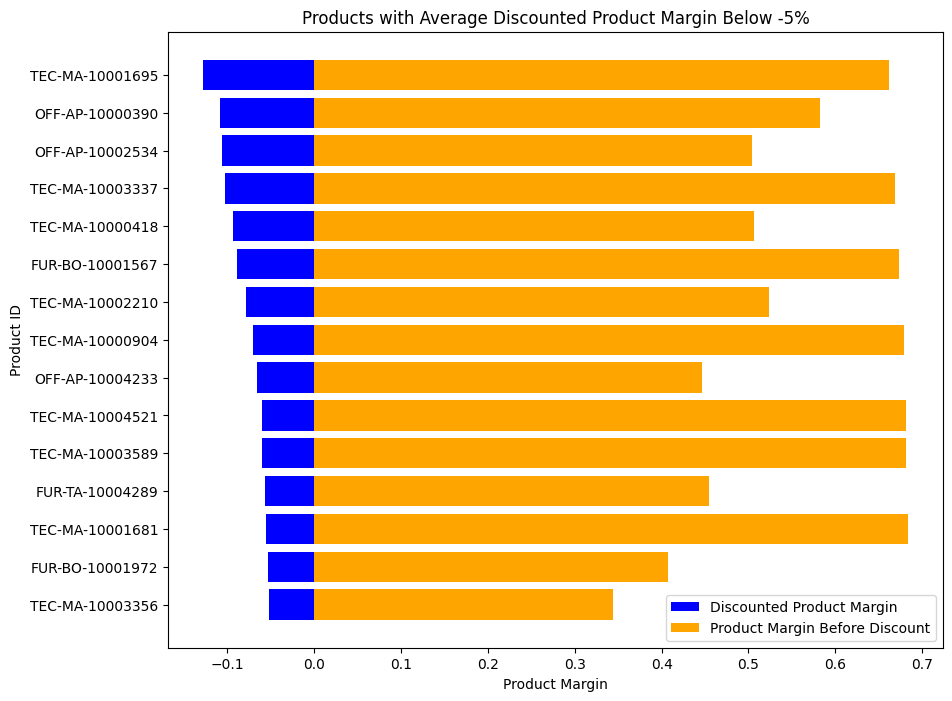

In [6]:
import matplotlib.pyplot as plt

# Filter products with average discounted product margin below 5%
products_below_zero = sales.groupby('Product ID')['Discounted_product_margin'].mean() < -0.05
products_to_plot = sales[sales['Product ID'].isin(products_below_zero[products_below_zero].index)]

# Group by product and calculate average discounted and non-discounted product margin
avg_margins = products_to_plot.groupby('Product ID').agg({'Discounted_product_margin': 'mean', 'Product_margin': 'mean'})

# Sort by discounted product margin in increasing order
avg_margins_sorted = avg_margins.sort_values('Discounted_product_margin', ascending=False)

# Create a horizontal bar chart
fig, ax = plt.subplots(figsize=(10, 8))

ax.barh(avg_margins_sorted.index, avg_margins_sorted['Discounted_product_margin'], color='blue', label='Discounted Product Margin')
ax.barh(avg_margins_sorted.index, avg_margins_sorted['Product_margin'], color='orange', label='Product Margin Before Discount')

ax.set_xlabel('Product Margin')
ax.set_ylabel('Product ID')
ax.set_title('Products with Average Discounted Product Margin Below -5%')
ax.legend()

plt.show()

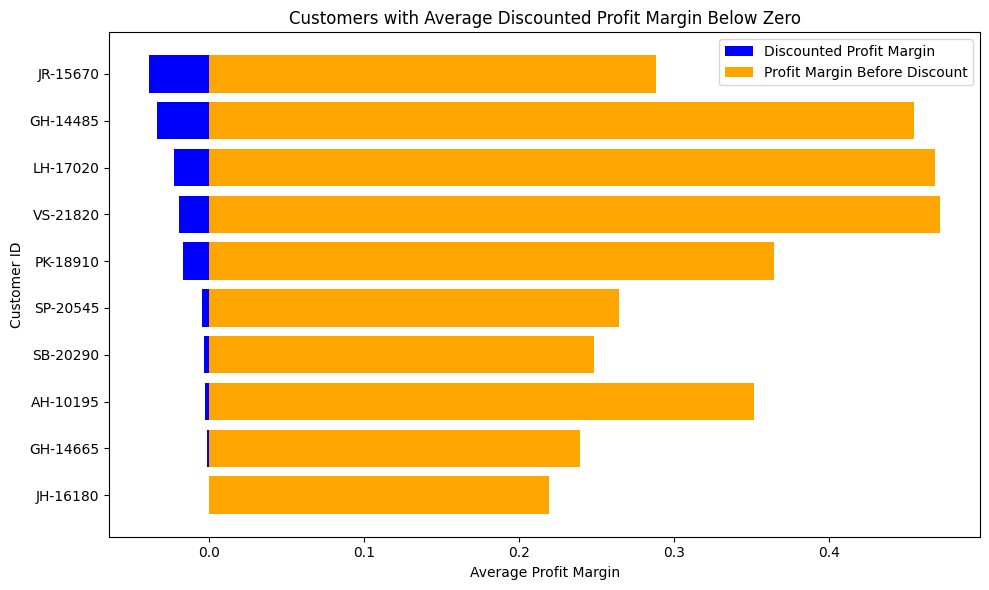

In [8]:
import matplotlib.pyplot as plt

# Filter customers with average discounted product margin below zero
customers_below_zero = sales.groupby('Customer_ID')['Discounted_product_margin'].mean() < 0
customers_to_plot = sales[sales['Customer_ID'].isin(customers_below_zero[customers_below_zero].index)]

# Calculate average discounted and actual product margin per customer
avg_discounted_margin = customers_to_plot.groupby('Customer_ID')['Discounted_product_margin'].mean()
avg_actual_margin = customers_to_plot.groupby('Customer_ID')['Product_margin'].mean()

# Sort customers by increasing discounted product margin
sorted_customers = avg_discounted_margin.sort_values(ascending=False)

# Create the horizontal bar chart
plt.figure(figsize=(10, 6))
plt.barh(sorted_customers.index, sorted_customers.values, color='blue', label='Discounted Profit Margin')
plt.barh(sorted_customers.index, avg_actual_margin.loc[sorted_customers.index].values, color='orange', label='Profit Margin Before Discount')

# Customize the plot
plt.xlabel('Average Profit Margin')
plt.ylabel('Customer ID')
plt.title('Customers with Average Discounted Profit Margin Below Zero')
plt.legend()
plt.tight_layout()
plt.show()

In [9]:
#Pricing inconsistencies

prices = sales.groupby('Product ID').aggregate({'Product_price':['min', 'mean', 'max']})
prices.columns = ['Min price', 'Avg price', 'Max price']
prices['Max/Min'] = prices['Max price'] / prices['Min price']
prices.sort_values(by='Max/Min', ascending=False)

,Min price,Avg price,Max price,Max/Min
Product ID,,,,
OFF-BI-10001249,10.400000,445.384722,1542.500000,148.317308
FUR-TA-10003473,378.625000,9557.416907,46110.000000,121.782767
FUR-FU-10004864,39.861111,944.233059,4316.000000,108.275958
OFF-BI-10002764,25.000000,584.114583,2660.000000,106.400000
OFF-BI-10002571,46.666667,1038.784722,4850.000000,103.928571
...,...,...,...,...
TEC-AC-10000926,160.000000,160.000000,160.000000,1.000000
TEC-MA-10004552,3696.000000,3696.000000,3696.000000,1.000000
TEC-MA-10004521,1900.000000,1900.000000,1900.000000,1.000000


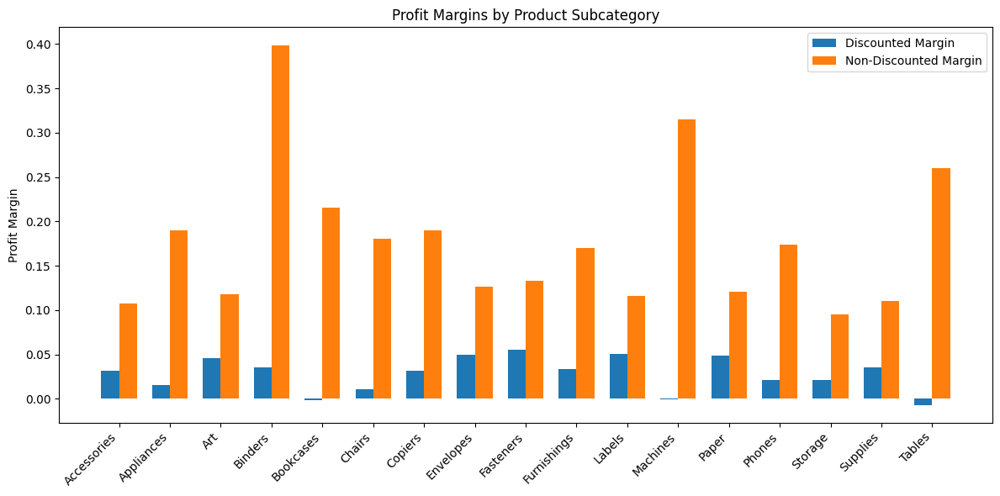

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Group by product subcategory and calculate the mean of discounted and non-discounted profit margins
subcategory_margins = sales.groupby('Product_subcategory').agg({'Discounted_product_margin': 'mean', 'Product_margin': 'mean'})

# Set up the bar chart
x = np.arange(len(subcategory_margins.index))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width/2, subcategory_margins['Discounted_product_margin'], width, label='Discounted Margin')
rects2 = ax.bar(x + width/2, subcategory_margins['Product_margin'], width, label='Non-Discounted Margin')

# Add labels, title, and legend
ax.set_ylabel('Profit Margin')
ax.set_title('Profit Margins by Product Subcategory')
ax.set_xticks(x)
ax.set_xticklabels(subcategory_margins.index, rotation=45, ha="right")
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()

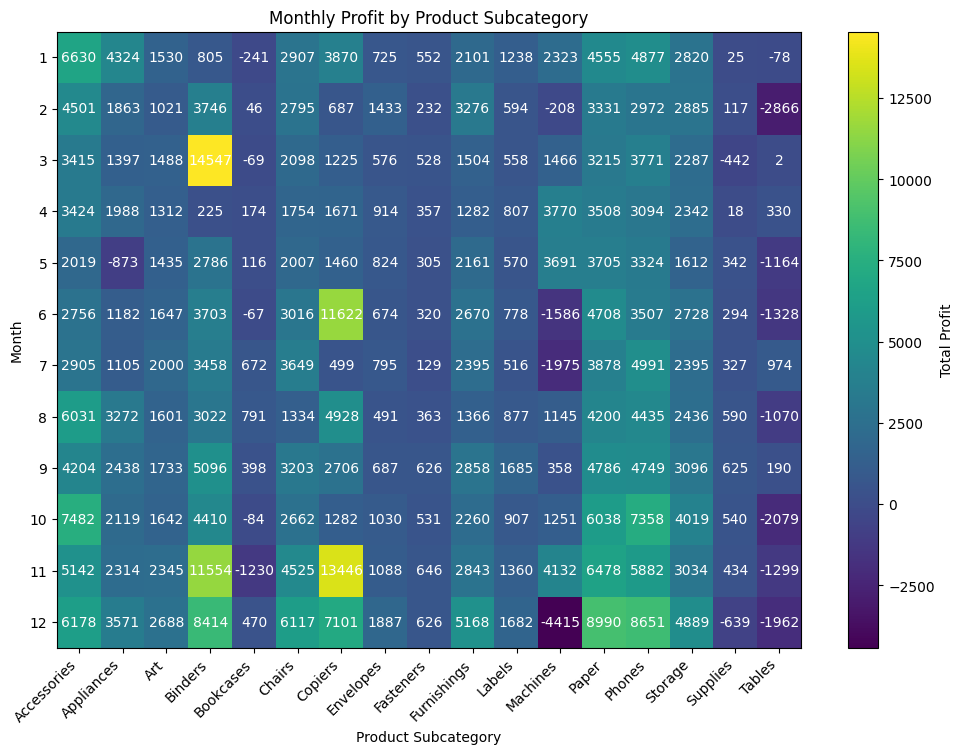

In [15]:
# prompt: Using dataframe sales: for each month (January to December) and for each product subcategory calculate the total profit and display it on a 2D heatmap- use matplotlib - display the profit in the corresponding square in the heatmap

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

#import warnings
#from pandas.core.common import SettingWithCopyWarning
#warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)

# Extract year and month from 'Order Date'
to_2019.loc[:, 'Order_Month'] = pd.DatetimeIndex(to_2019['Order Date']).month

# Group by month and product subcategory, calculate total profit
monthly_profit = to_2019.groupby(['Order_Month', 'Product_subcategory'])['Profit_on_sale'].sum().unstack()

# Create a heatmap using matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(monthly_profit, cmap='viridis', aspect='auto')
plt.colorbar(label='Total Profit')
plt.xticks(np.arange(len(monthly_profit.columns)), monthly_profit.columns, rotation=45, ha='right')
plt.yticks(np.arange(len(monthly_profit.index)), monthly_profit.index)
plt.xlabel('Product Subcategory')
plt.ylabel('Month')
plt.title('Monthly Profit by Product Subcategory')

# Display the profit values in the corresponding squares
for i in range(len(monthly_profit.index)):
    for j in range(len(monthly_profit.columns)):
        profit = monthly_profit.iloc[i, j]
        plt.text(j, i, f'{profit:.0f}', ha='center', va='center', color='w')

plt.show()

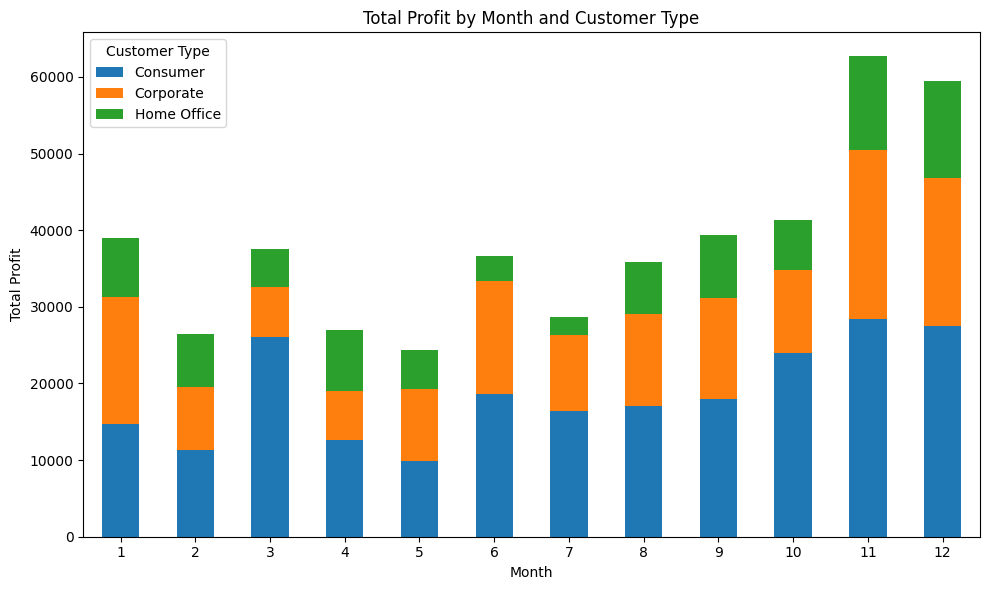

In [17]:
# prompt: Using dataframe sales: for each month (January to December) calculate the average profit and break it down by customer types on a stacked bar chart - use matplotlib

import matplotlib.pyplot as plt
import pandas as pd

# Extract month from 'Order Date'
to_2019.loc[:, 'Order_Month'] = pd.DatetimeIndex(to_2019['Order Date']).month

# Group by month and customer type, calculate average profit
monthly_profit = to_2019.groupby(['Order_Month', 'Customer_type'])['Profit_on_sale'].sum().unstack()

# Create a stacked bar chart
ax = monthly_profit.plot(kind='bar', stacked=True, figsize=(10, 6))

# Customize the chart
plt.title('Total Profit by Month and Customer Type')
plt.xlabel('Month')
plt.ylabel('Total Profit')
plt.xticks(rotation=0)
plt.legend(title='Customer Type')

# Display the chart
plt.tight_layout()
plt.show()

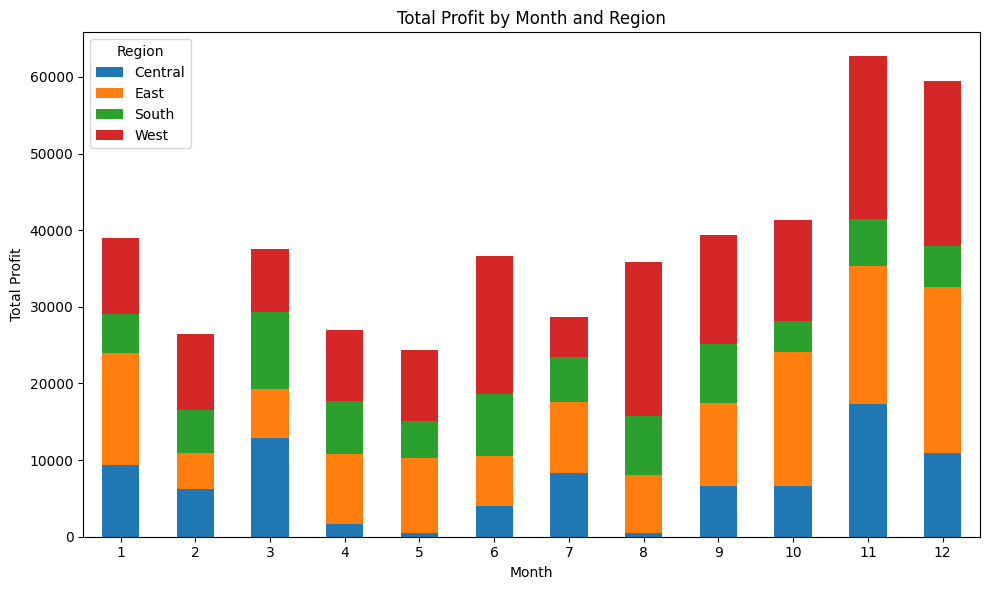

In [18]:
import matplotlib.pyplot as plt
import pandas as pd

# Extract month from 'Order Date'
to_2019.loc[:, 'Order_Month'] = pd.DatetimeIndex(to_2019['Order Date']).month

# Group by month and customer type, calculate average profit
monthly_profit = to_2019.groupby(['Order_Month', 'Region'])['Profit_on_sale'].sum().unstack()

# Create a stacked bar chart
ax = monthly_profit.plot(kind='bar', stacked=True, figsize=(10, 6))

# Customize the chart
plt.title('Total Profit by Month and Region')
plt.xlabel('Month')
plt.ylabel('Total Profit')
plt.xticks(rotation=0)
plt.legend(title='Region')

# Display the chart
plt.tight_layout()
plt.show()

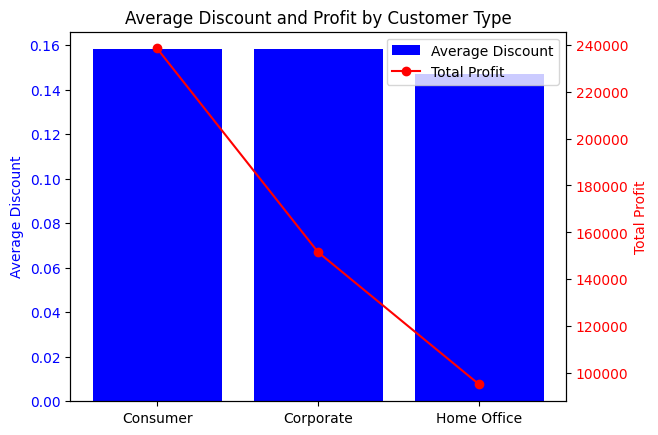

In [19]:
# prompt: Using dataframe sales: make a bar plot showing the average discount and total profit (on twin axis) by customer type - use matplotlib

import matplotlib.pyplot as plt

# Group by customer type and calculate the average discount and profit
avg_discount_profit = sales.groupby('Customer_type').agg({'Discount_applied': 'mean', 'Profit_on_sale': 'sum'})

# Create a figure and axes
fig, ax1 = plt.subplots()

# Plot the average discount on the left y-axis
ax1.bar(avg_discount_profit.index, avg_discount_profit['Discount_applied'], color='blue', label='Average Discount')
ax1.set_ylabel('Average Discount', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a second y-axis for the profit
ax2 = ax1.twinx()

# Plot the average profit on the right y-axis
ax2.plot(avg_discount_profit.index, avg_discount_profit['Profit_on_sale'], color='red', marker='o', label='Total Profit')
ax2.set_ylabel('Total Profit', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Set the title and legend
plt.title('Average Discount and Profit by Customer Type')
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='best')

# Display the plot
plt.show()

In [20]:
worst_products = sales.groupby('Product ID').aggregate({'Profit_on_sale' : 'sum', 'Quantity_sold' : 'sum', 'Customer_ID' : 'nunique', 'Product_cost' : 'mean', 'Product_price' : 'mean',
                                        'Discount_applied' : 'mean', 'Discounted_product_margin' : 'mean', 'Product_subcategory' : pd.Series.mode, 'City' : pd.Series.mode}).sort_values(by='Profit_on_sale', ascending=True)
worst_products.columns = ['Total profit', 'Total quantity sold', 'Number of unique customers', 'Avg Product Cost', 'Avg Product Price', 'Avg Discount applied', 'Avg Product Margin', 'Product Subcategory', 'Most common City']
worst_products.loc[worst_products['Total profit']<-1000, :]

,Total profit,Total quantity sold,Number of unique customers,Avg Product Cost,Avg Product Price,Avg Discount applied,Avg Product Margin,Product Subcategory,Most common City
Product ID,,,,,,,,,
TEC-MA-10000418,-8840.0,20,3,6959.416667,13612.935406,0.533333,-0.093215,Machines,"[Lancaster, Newark, San Francisco]"
TEC-MA-10000822,-4480.0,18,4,15176.450000,23039.166667,0.400000,-0.034116,Machines,"[Detroit, Houston, Louisville, San Antonio]"
TEC-MA-10004125,-3838.0,5,1,16925.600000,32316.000000,0.500000,-0.047506,Machines,Burlington
FUR-TA-10000198,-2770.2,21,5,9112.562667,13097.433333,0.280000,-0.022266,Tables,"[Concord, Detroit, Knoxville, Los Angeles, Spr..."
FUR-TA-10001889,-1838.3,48,7,2780.618175,4065.102834,0.350000,-0.027934,Tables,New York City
TEC-MA-10002412,-1767.1,10,1,22817.210000,45281.000000,0.500000,-0.007805,Machines,Jacksonville
OFF-BI-10004995,-1723.2,40,6,5198.455556,10893.437500,0.450000,-0.046960,Binders,"[Burlington, Houston, Jackson, New York City, ..."
OFF-SU-10002881,-1166.1,28,6,9355.875880,9750.272338,0.100000,-0.008274,Supplies,Philadelphia
FUR-TA-10001950,-1128.0,23,4,8252.192708,8987.267361,0.200000,-0.019369,Tables,"[Columbia, New York City, Noblesville, Seattle]"


In [21]:
worst_customers = sales.groupby('Customer_ID').aggregate({'Profit_on_sale' : 'sum', 'Quantity_sold' : 'sum', 'Product ID' : 'nunique', 'Product_subcategory' : pd.Series.mode,
                                        'Discount_applied' : 'mean', 'Customer_type' : pd.Series.mode, 'Order Date' : 'min', 'City' : pd.Series.mode}).sort_values(by='Profit_on_sale', ascending=True)
worst_customers.columns = ['Total profit', 'Total quantity sold', 'Number of unique products sold', 'Most common product subcategories', 'Avg Discount applied', 'Customer type', 'First order', 'Most common City']
worst_customers.loc[worst_customers['Total profit']<-1000, :]

,Total profit,Total quantity sold,Number of unique products sold,Most common product subcategories,Avg Discount applied,Customer type,First order,Most common City
Customer_ID,,,,,,,,
CS-12505,-6479.3,45,9,"[Machines, Paper]",0.200000,Consumer,2016-05-10,Lancaster
GT-14635,-4002.5,30,6,Binders,0.250000,Corporate,2016-07-02,Long Beach
LF-17185,-3342.0,90,16,"[Binders, Furnishings, Paper]",0.318750,Consumer,2016-08-01,San Antonio
SR-20425,-3104.8,36,9,Binders,0.366667,Home Office,2016-07-05,Louisville
HG-14965,-2410.9,84,17,Binders,0.170588,Corporate,2016-10-22,Los Angeles
NC-18415,-2000.9,84,14,Binders,0.264286,Consumer,2016-06-01,Jacksonville
SB-20290,-1819.8,89,17,"[Machines, Storage]",0.241176,Corporate,2016-05-19,"[Henderson, Philadelphia]"
SM-20320,-1675.7,74,15,Paper,0.246667,Home Office,2016-04-30,Jacksonville
CP-12340,-1529.1,89,15,"[Binders, Tables]",0.213333,Corporate,2016-03-21,New York City


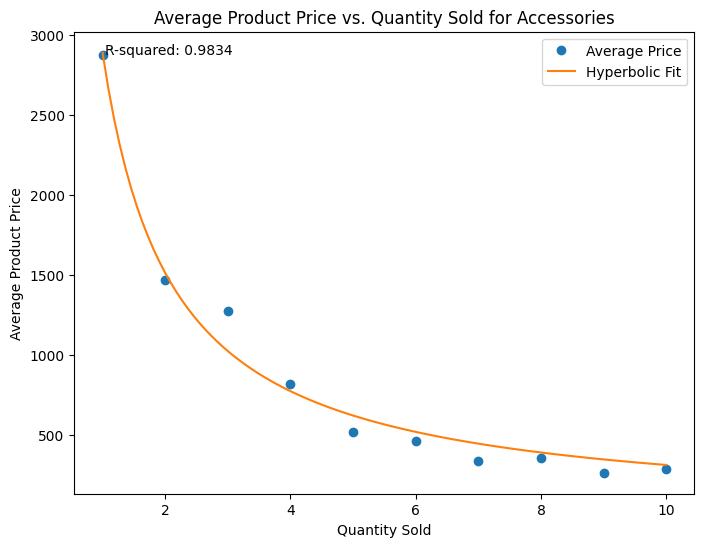

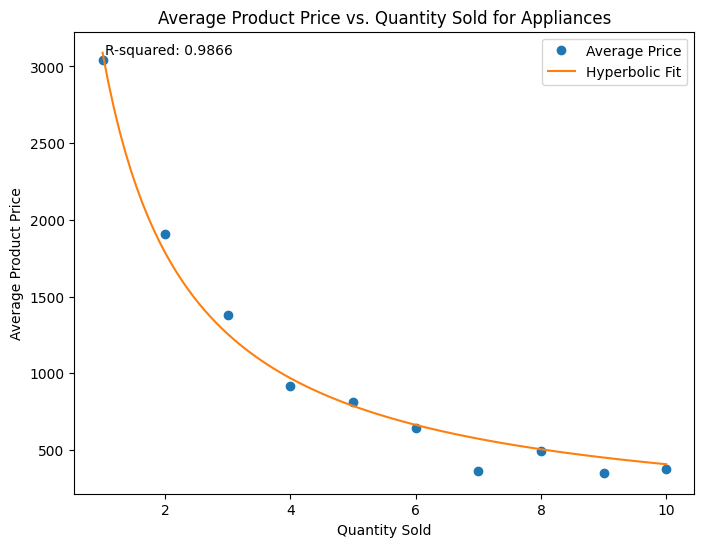

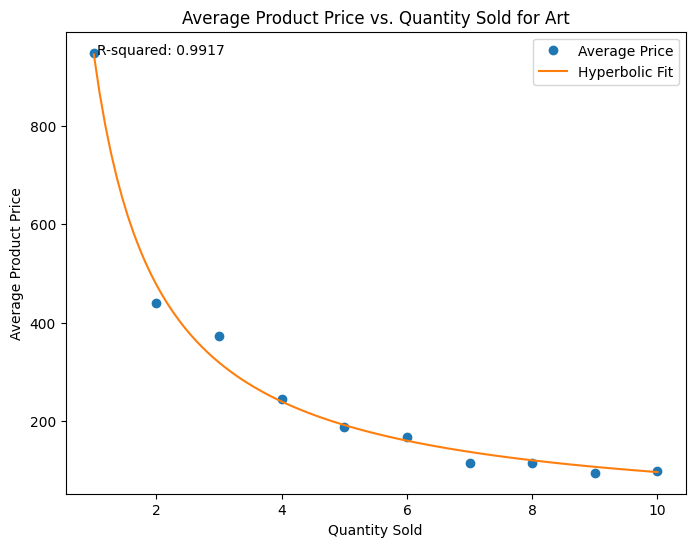

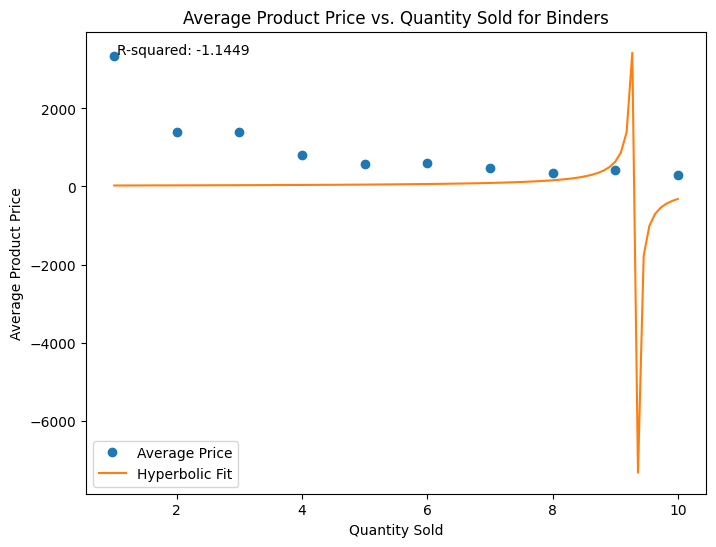

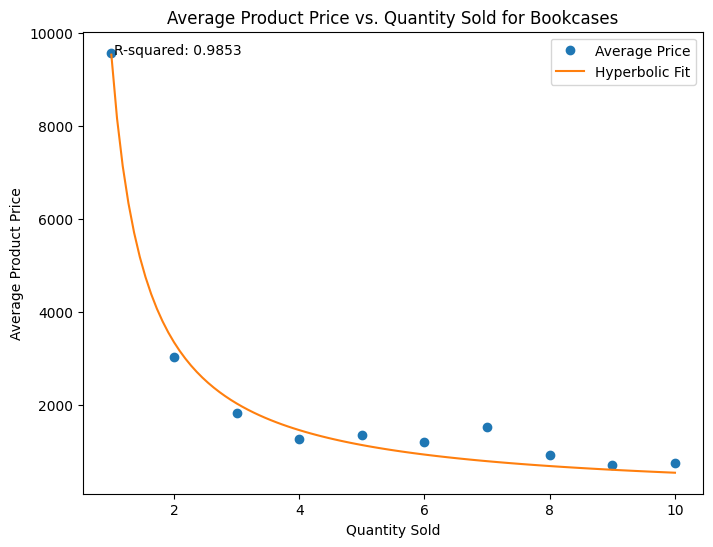

...

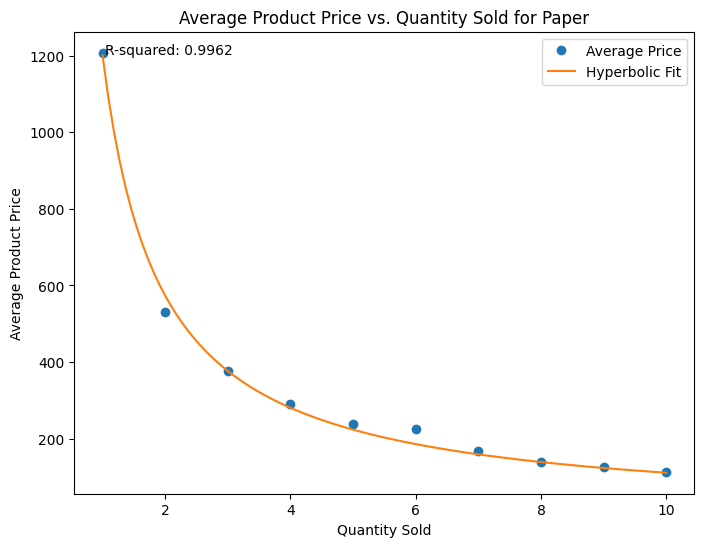

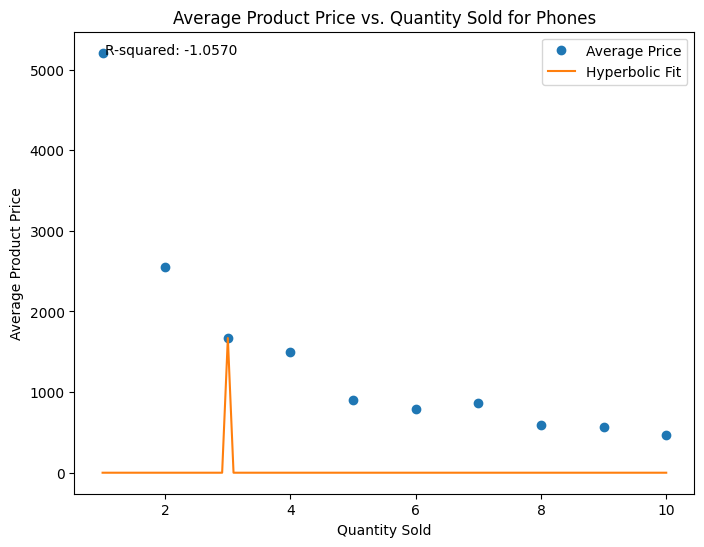

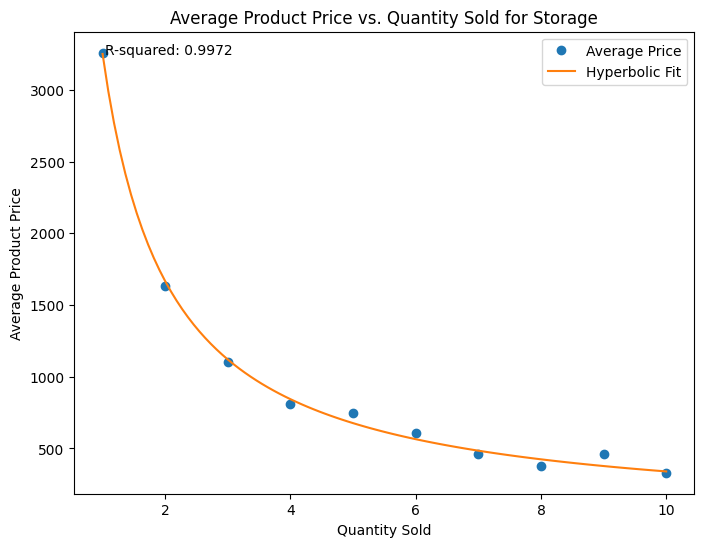

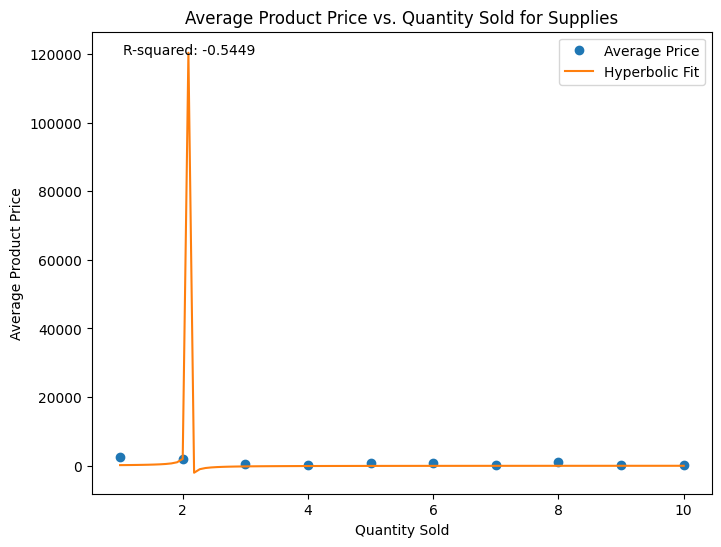

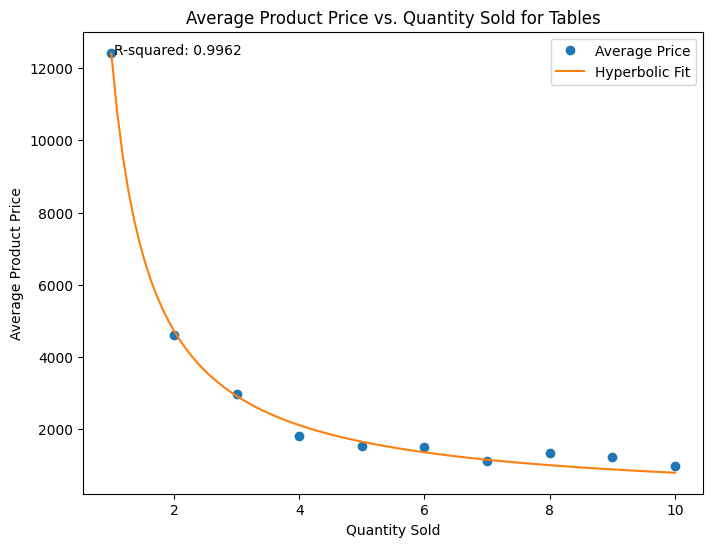

In [22]:
# prompt: Using dataframe sales: for each product subcategory: make a plot of average product price (y-axis) for each quantity (x-axis, 1-10) sold with and best fit hyperbolic curve of order one - use matplotlib and display R2, p-value and slope

#Product price (sales/quantity) seems to be hyperbolic with quantity - makes sense as sales is more or less constant with quantity (see below) - suggests that sales is actually product price in the order and not total revenue on the order

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

# Group by product subcategory and quantity sold and calculate the average product price
avg_price_by_quantity = sales.groupby(['Product_subcategory', 'Quantity_sold'])['Product_price'].mean().unstack()

# Define the hyperbolic function
def hyperbolic_function(x, a, b):
    return a / (x + b)

# Iterate through each product subcategory and plot the average product price against quantity sold
for subcategory in avg_price_by_quantity.index:
    # Get the data for the current subcategory
    data = avg_price_by_quantity.loc[subcategory].dropna()
    x_data = data.index.values
    y_data = data.values

    # Fit the hyperbolic curve to the data
    popt, _ = curve_fit(hyperbolic_function, x_data, y_data)
    # Calculate R-squared
    x_range = np.linspace(1, 10, 100)
    y_range = hyperbolic_function(x_range, *popt)
    y_pred = hyperbolic_function(x_data, *popt)
    r_squared = r2_score(y_data, y_pred)

    # Plot the data and the best-fit curve
    plt.figure(figsize=(8, 6))
    plt.plot(x_data, y_data, 'o', label='Average Price')
    plt.plot(x_range, y_range, '-', label='Hyperbolic Fit')
    plt.xlabel('Quantity Sold')
    plt.ylabel('Average Product Price')
    plt.title(f'Average Product Price vs. Quantity Sold for {subcategory}')

    # Display R-squared, p-value, and slope
    plt.text(0.05, 0.95, f"R-squared: {r_squared:.4f}", transform=plt.gca().transAxes)
    # p-value and slope are not directly available in curve_fit,
    # consider using statistical tests like ANOVA or hypothesis testing for slope if needed.

    plt.legend()
    plt.show()


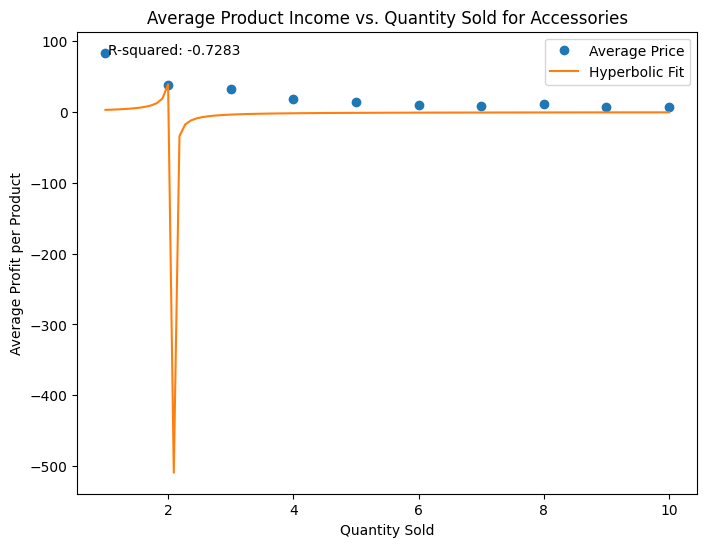

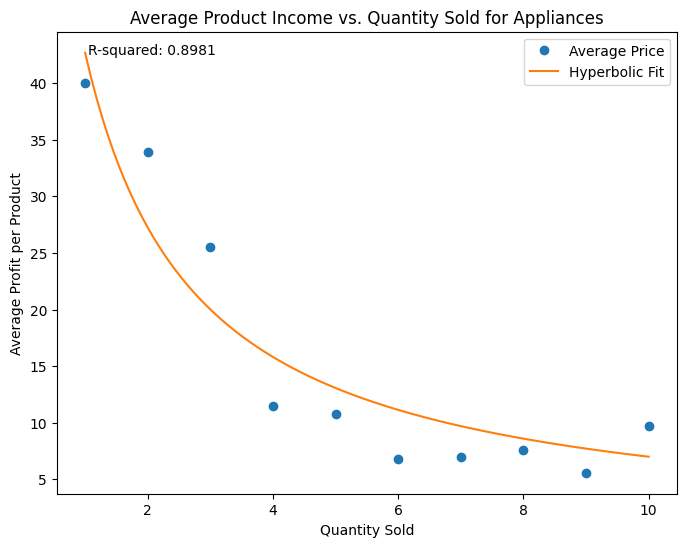

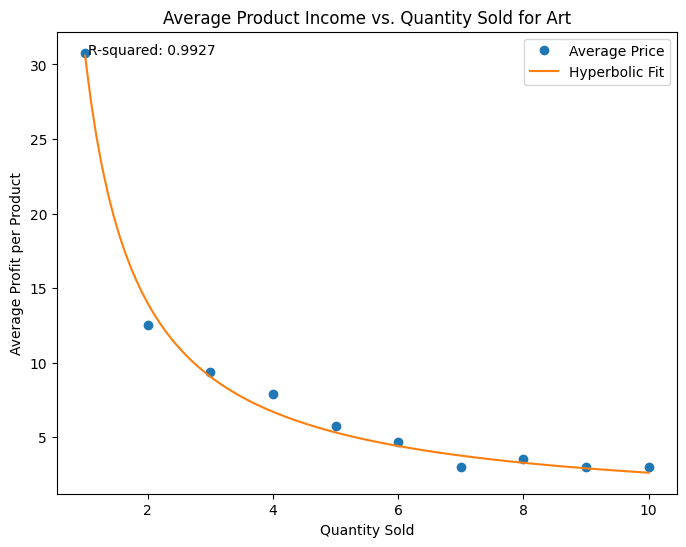

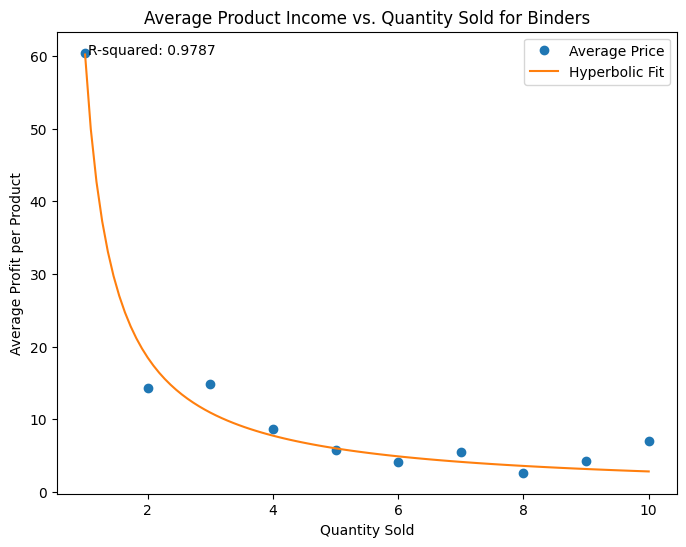

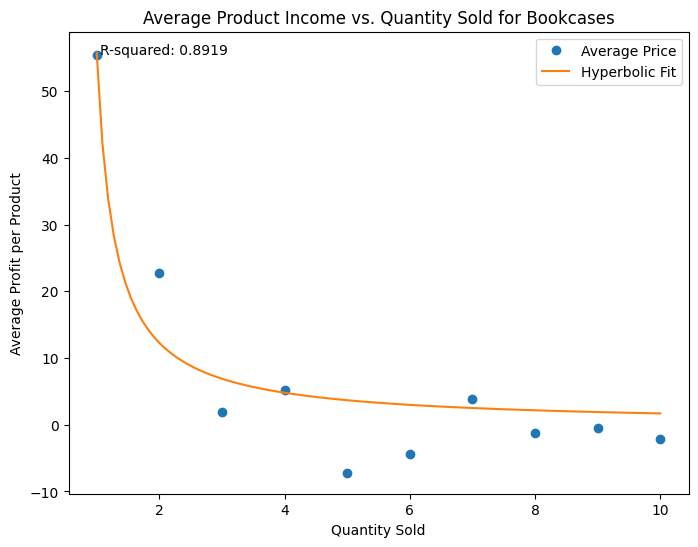

...

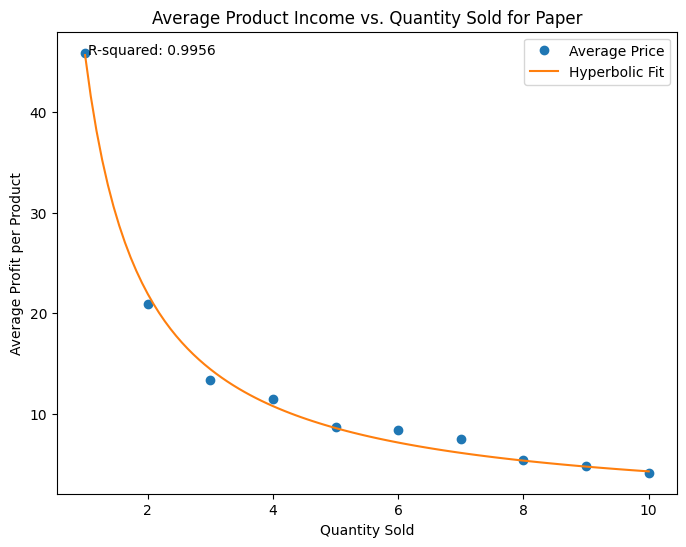

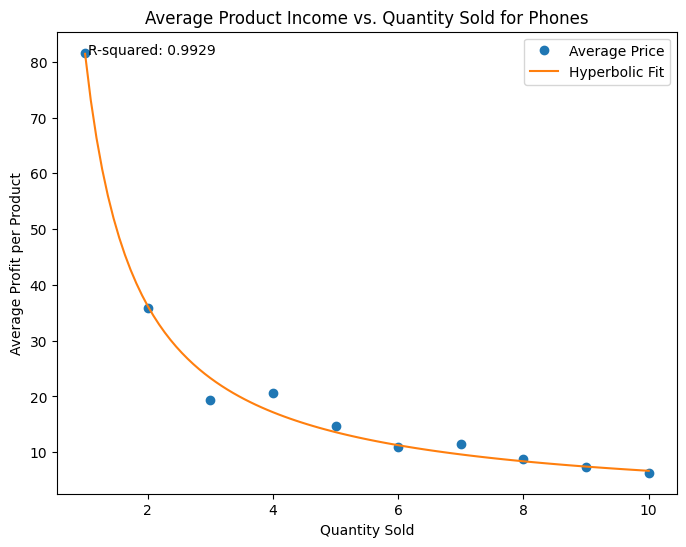

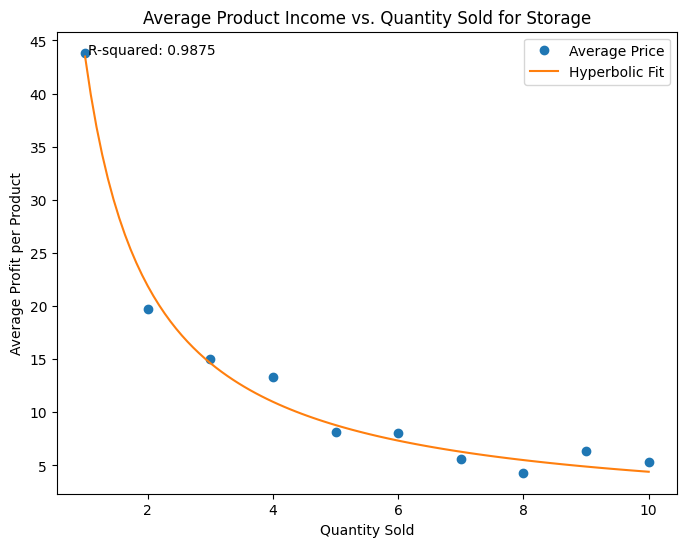

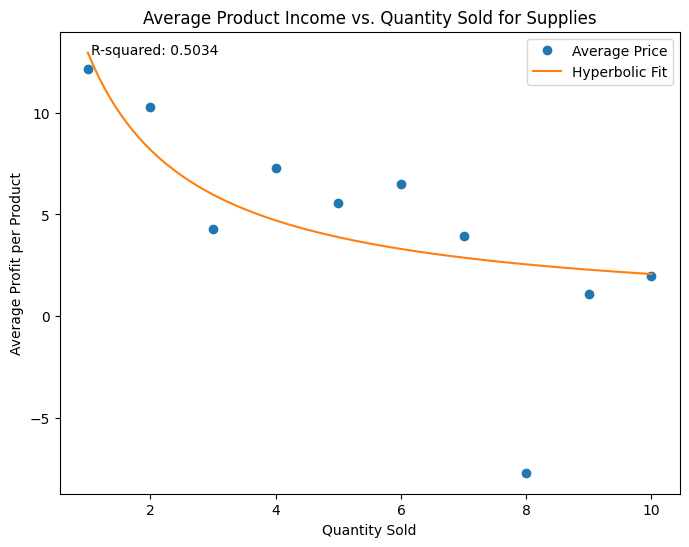

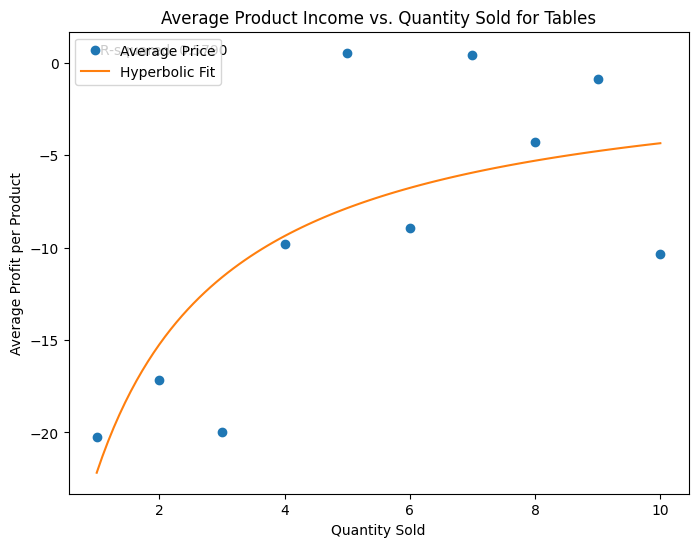

In [23]:
# prompt: Using dataframe sales: for each product subcategory: make a plot of average product price (y-axis) for each quantity (x-axis, 1-10) sold with and best fit hyperbolic curve of order one - use matplotlib and display R2, p-value and slope

#Product income (profit/quantity) seems to be hyperbolic with quantity (except tables & accessories) - makes sense as profit is more or less constant with quantity (see below) - suggests that profit is actually per product in the order and not total profit on the order

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

# Group by product subcategory and quantity sold and calculate the average product price
avg_price_by_quantity = sales.groupby(['Product_subcategory', 'Quantity_sold'])['Product_income'].mean().unstack()

# Define the hyperbolic function
def hyperbolic_function(x, a, b):
    return a / (x + b)

# Iterate through each product subcategory and plot the average product price against quantity sold
for subcategory in avg_price_by_quantity.index:
    # Get the data for the current subcategory
    data = avg_price_by_quantity.loc[subcategory].dropna()
    x_data = data.index.values
    y_data = data.values

    # Fit the hyperbolic curve to the data
    popt, _ = curve_fit(hyperbolic_function, x_data, y_data)
    # Calculate R-squared
    x_range = np.linspace(1, 10, 100)
    y_range = hyperbolic_function(x_range, *popt)
    y_pred = hyperbolic_function(x_data, *popt)
    r_squared = r2_score(y_data, y_pred)

    # Plot the data and the best-fit curve
    plt.figure(figsize=(8, 6))
    plt.plot(x_data, y_data, 'o', label='Average Price')
    plt.plot(x_range, y_range, '-', label='Hyperbolic Fit')
    plt.xlabel('Quantity Sold')
    plt.ylabel('Average Profit per Product')
    plt.title(f'Average Product Income vs. Quantity Sold for {subcategory}')

    # Display R-squared, p-value, and slope
    plt.text(0.05, 0.95, f"R-squared: {r_squared:.4f}", transform=plt.gca().transAxes)
    # p-value and slope are not directly available in curve_fit,
    # consider using statistical tests like ANOVA or hypothesis testing for slope if needed.

    plt.legend()
    plt.show()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


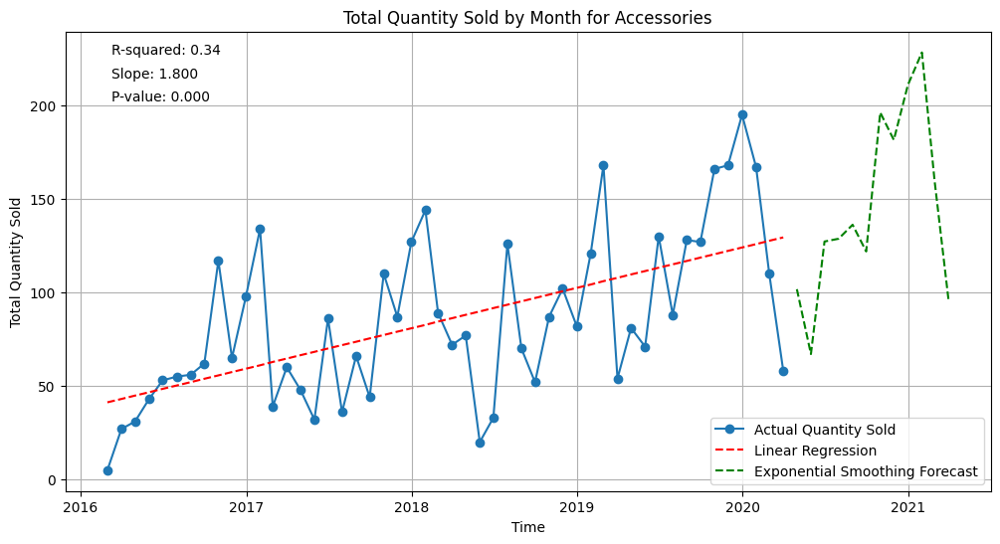

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


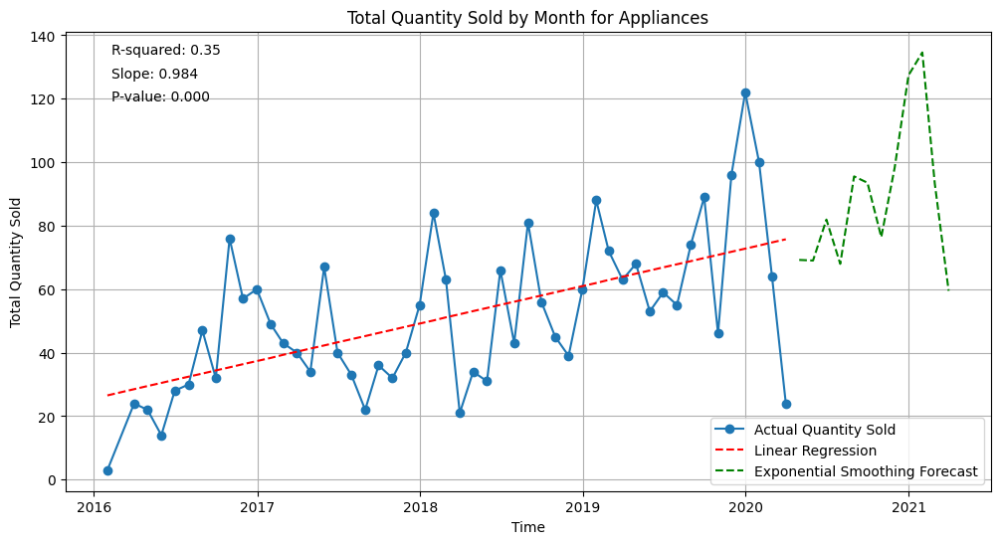

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


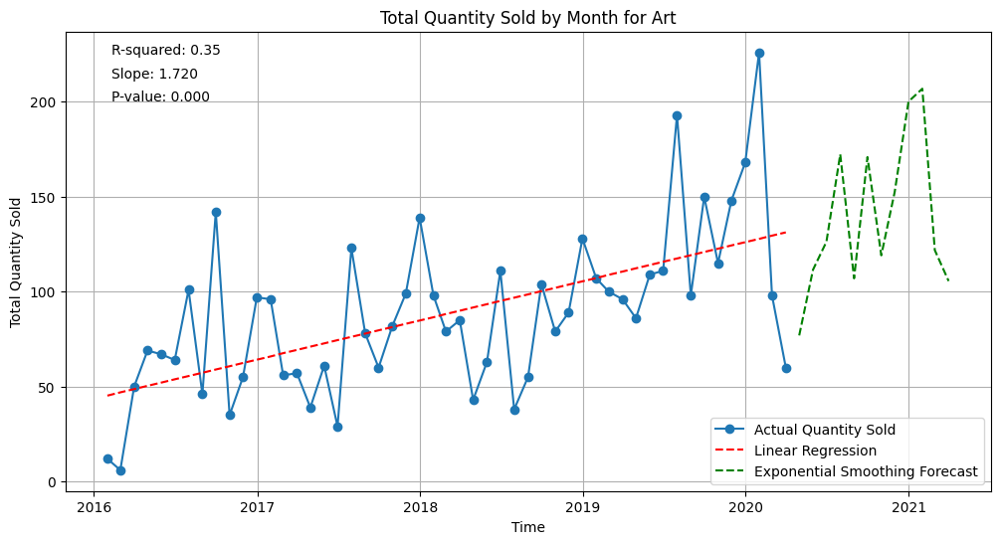

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


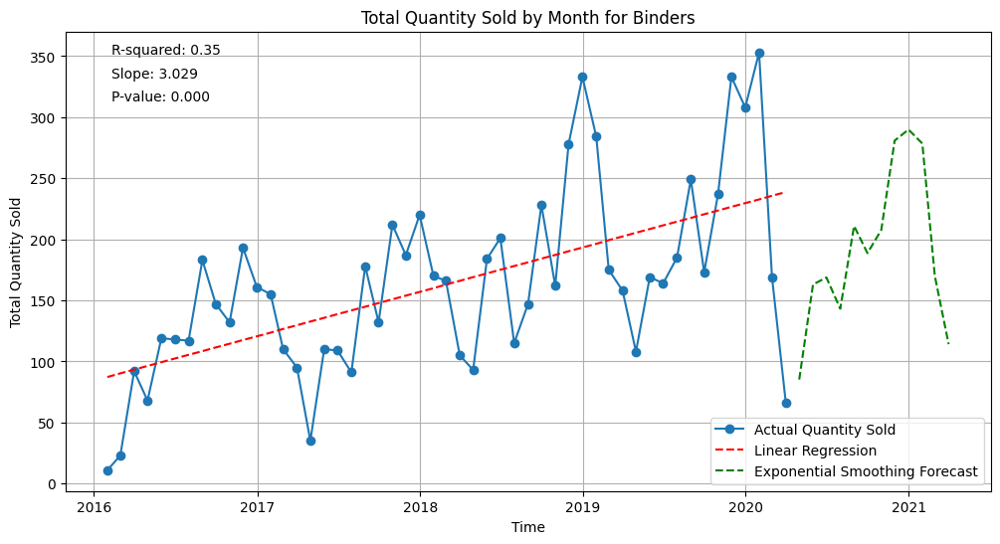

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


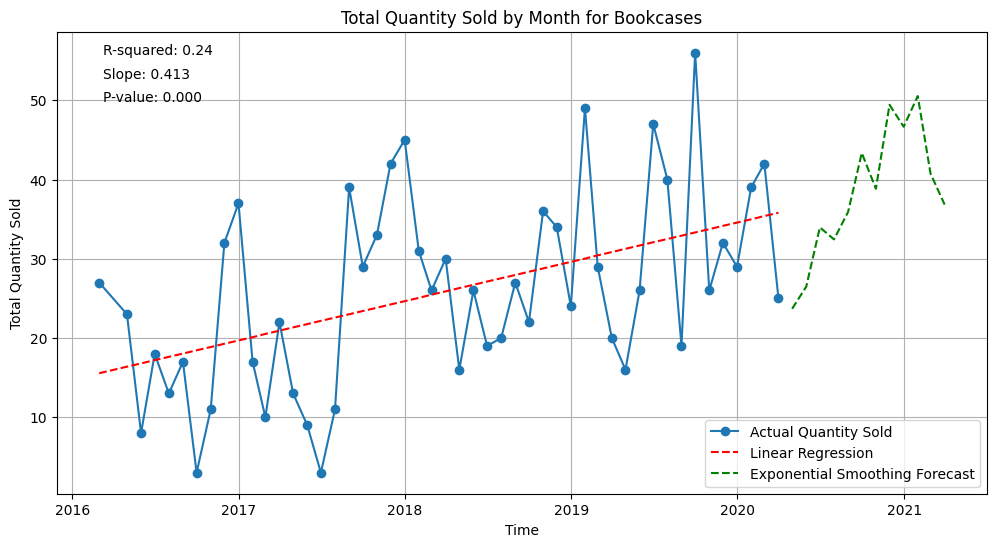

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


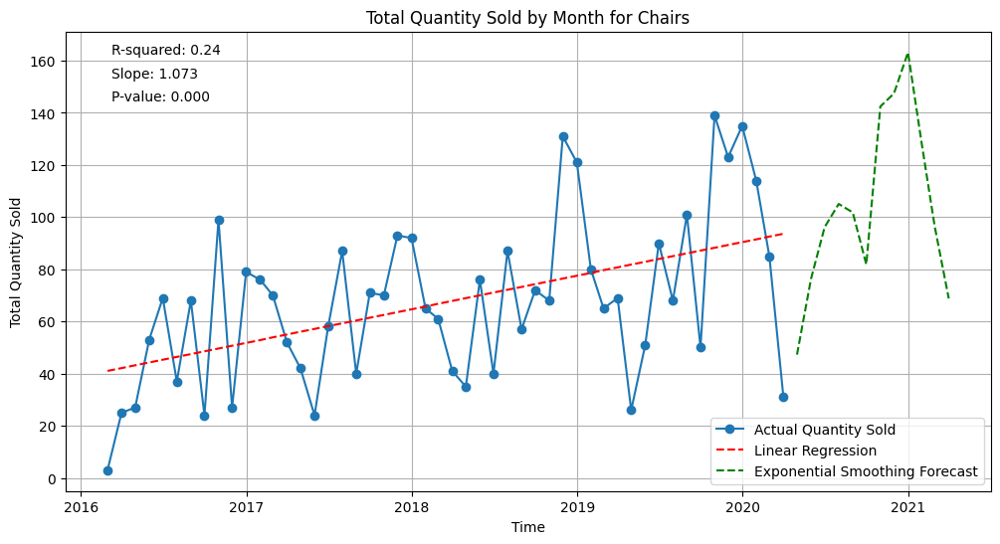

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


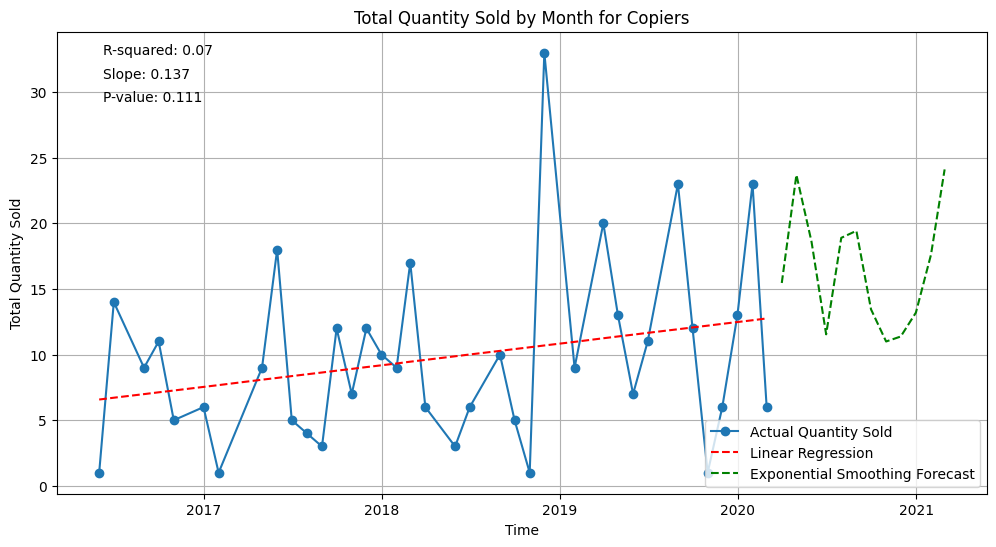

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


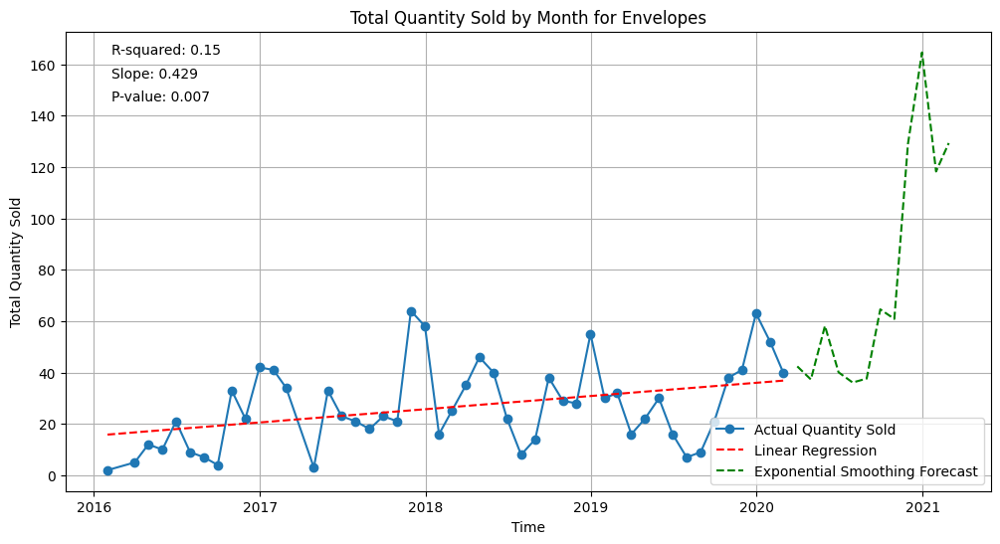

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


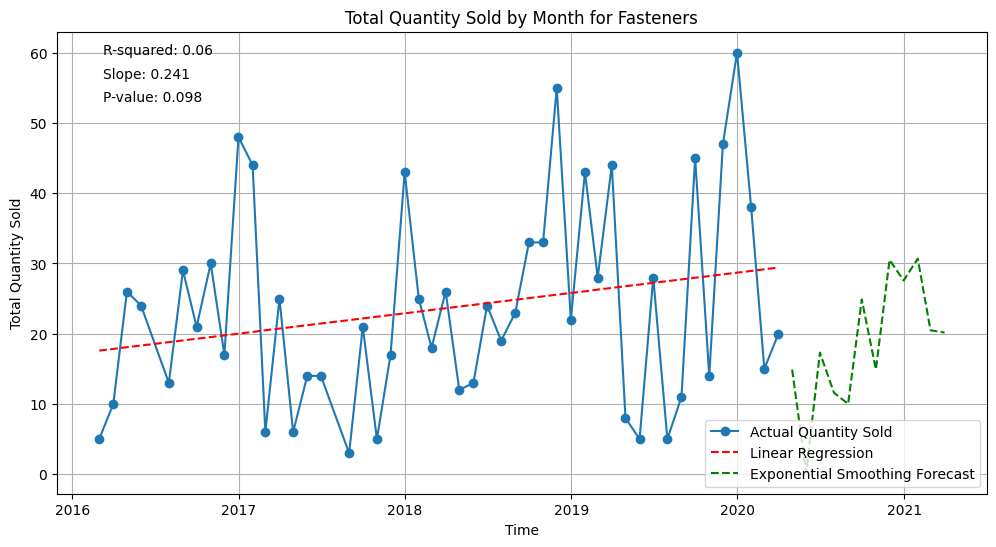

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


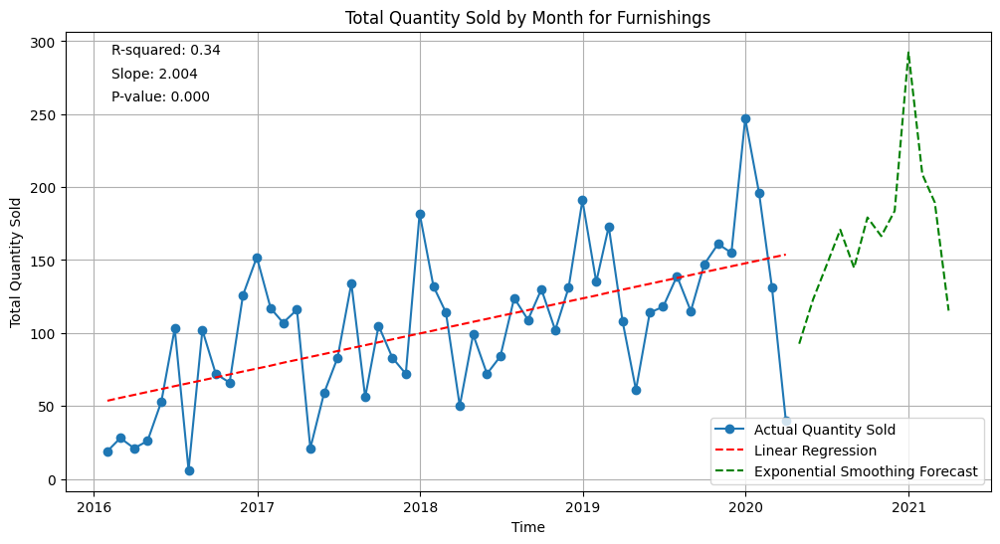

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


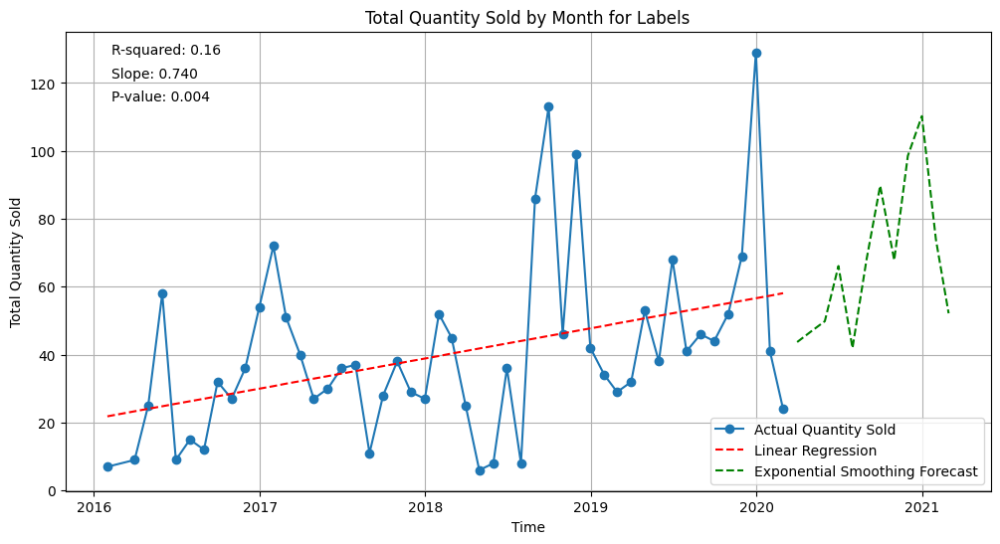

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


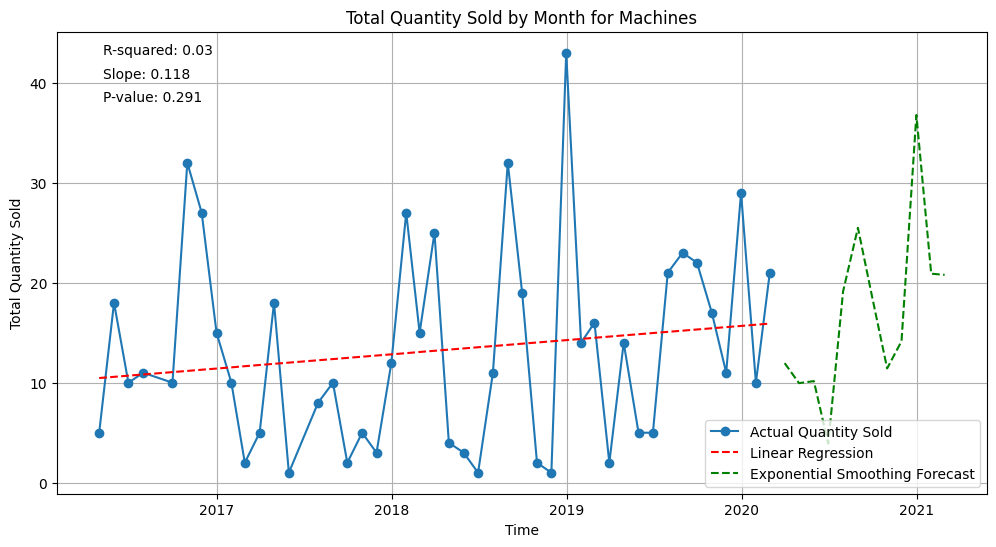

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


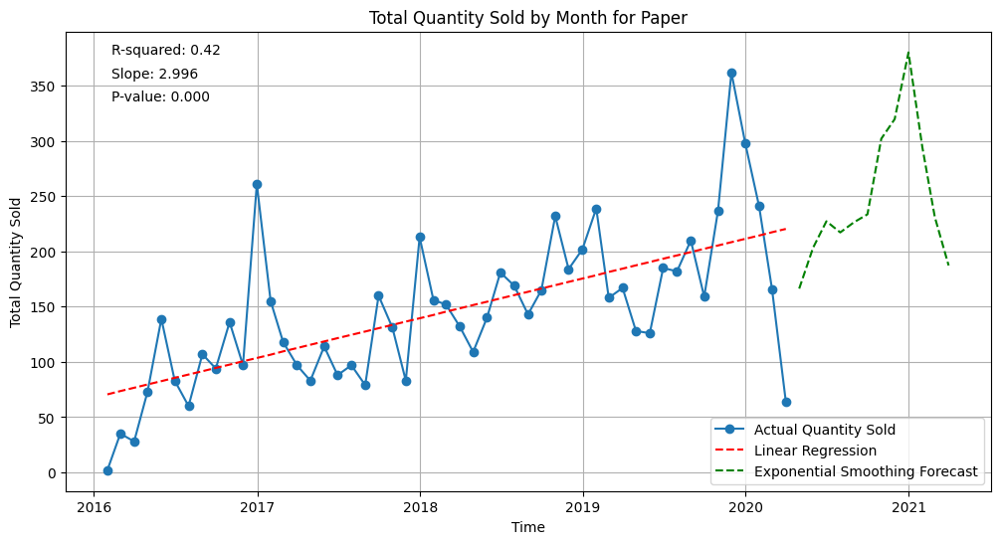

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


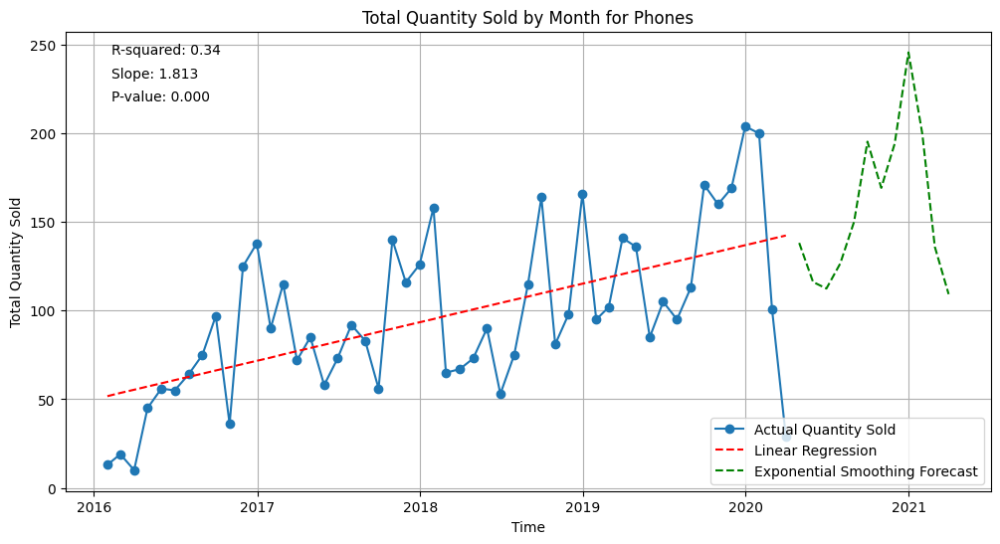

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


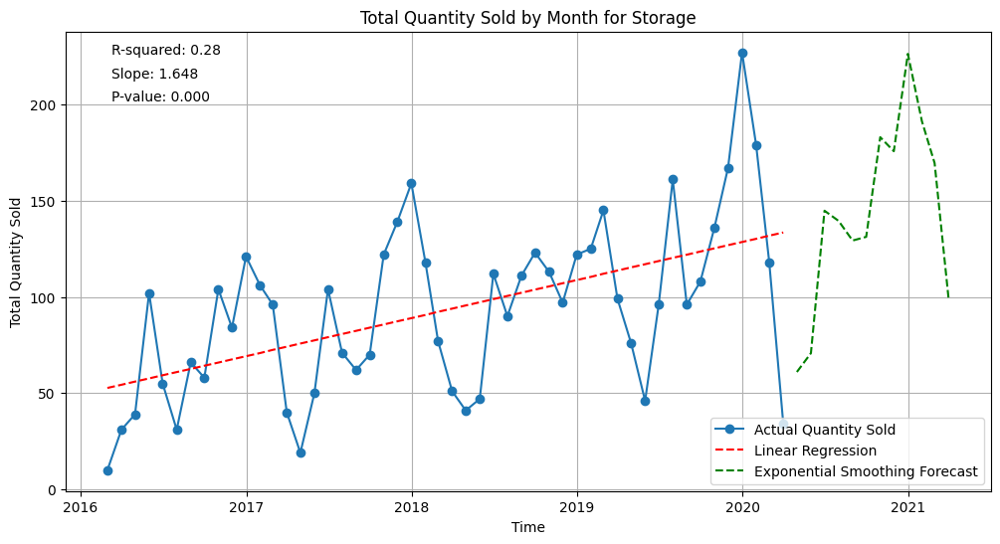

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


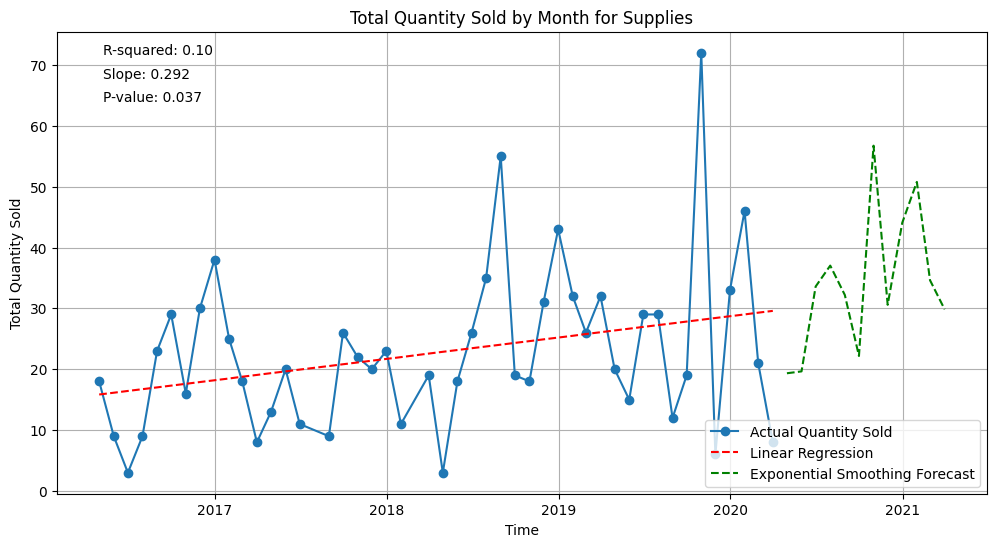

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:84: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


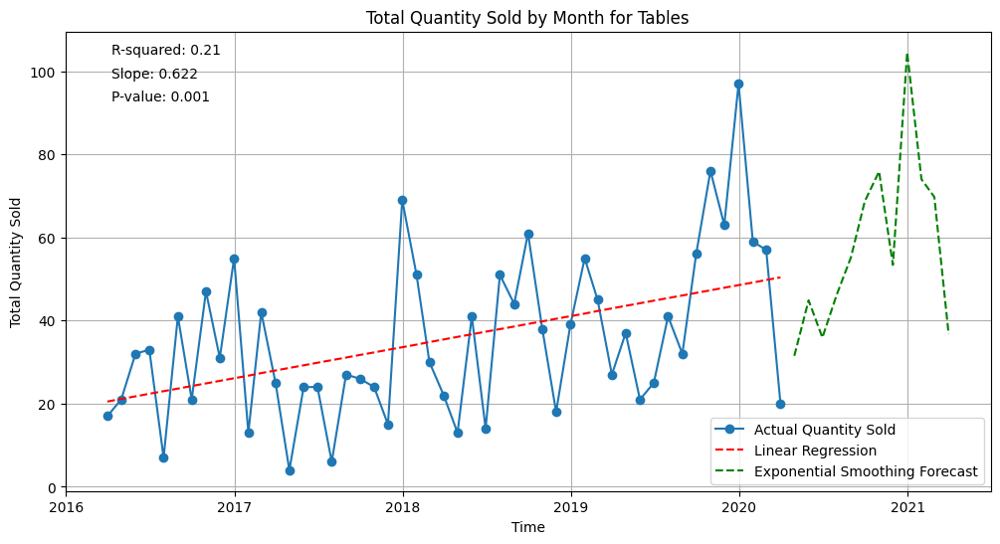

In [30]:
# prompt: Using dataframe removed: for each subcategory, make a plot for total quantity sold by month - add the best fit linear line with slope, R2 and p-value and use exponential smoothing to predict the total quantity sold for the next year - use matplotlib and use timestamp as the x-axis - take care that the linear regression works by converting the months to integer numbers so the slope is given in units quantity per month

import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Convert 'Order Date' to datetime objects
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Group by product subcategory and month, then calculate the total quantity sold
monthly_sales = removed.groupby(['Product_subcategory', pd.Grouper(key='Order Date', freq='ME')])['Quantity_sold'].sum().reset_index()

# Iterate through each subcategory
for subcategory in monthly_sales['Product_subcategory'].unique():
    # Filter data for the current subcategory
    subcategory_data = monthly_sales[monthly_sales['Product_subcategory'] == subcategory]

    # Convert months to integer numbers for linear regression
    subcategory_data['month_int'] = subcategory_data['Order Date'].dt.month + (subcategory_data['Order Date'].dt.year - subcategory_data['Order Date'].dt.year.min()) * 12

    # Perform linear regression
    X = subcategory_data['month_int']
    y = subcategory_data['Quantity_sold']
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()

    # Predict using linear regression
    y_pred = model.predict(X)

    # Plot the data and the linear regression line
    plt.figure(figsize=(12, 6))
    plt.plot(subcategory_data['Order Date'], subcategory_data['Quantity_sold'], marker='o', linestyle='-', label='Actual Quantity Sold')
    plt.plot(subcategory_data['Order Date'], y_pred, linestyle='--', color='red', label='Linear Regression')
    plt.xlabel('Time')
    plt.ylabel('Total Quantity Sold')
    plt.title(f'Total Quantity Sold by Month for {subcategory}')
    plt.legend()
    plt.grid(True)

    # Display the slope, R2, and p-value
    # print(f"For {subcategory}:")
    # print(f"Slope: {model.params['month_int']:.2f}")
    # print(f"R-squared: {model.rsquared:.2f}")
    # print(f"P-value: {model.pvalues['month_int']:.3f}")

    plt.text(0.05, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.90, f"Slope: {model.params['month_int']:.3f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.85, f"P-value: {model.pvalues['month_int']:.3f}", transform=plt.gca().transAxes)

    # Perform Exponential Smoothing for forecasting
    model_es = ExponentialSmoothing(subcategory_data['Quantity_sold'], trend='mul', seasonal='mul', seasonal_periods=12).fit()
    forecast = model_es.forecast(12) # Forecast for the next year (12 months)

    # Generate timestamps for the forecast period
    last_date = subcategory_data['Order Date'].max()
    forecast_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=12, freq='ME')

    # Plot the forecast
    plt.plot(forecast_dates, forecast, linestyle='--', color='green', label='Exponential Smoothing Forecast')
    plt.legend(loc='lower right')
    plt.show()


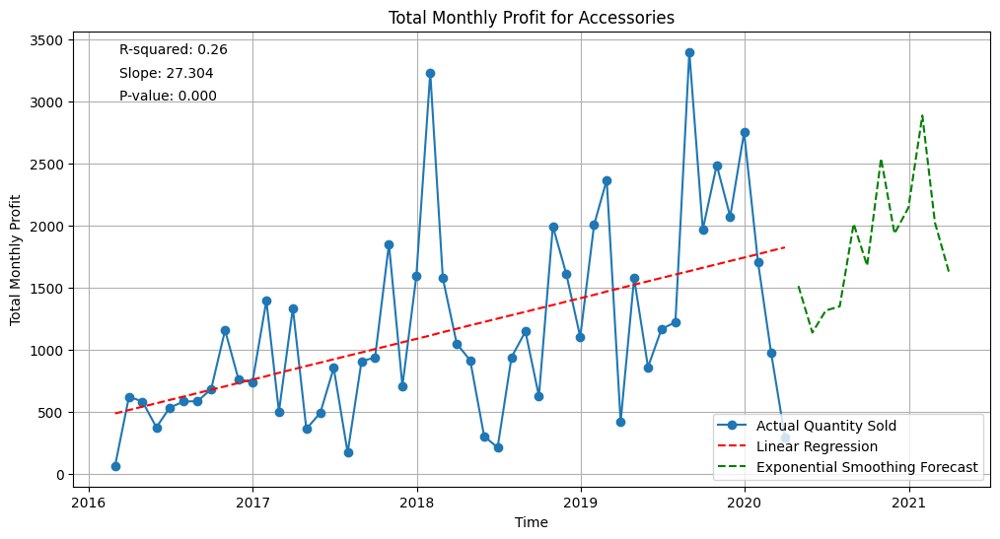

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


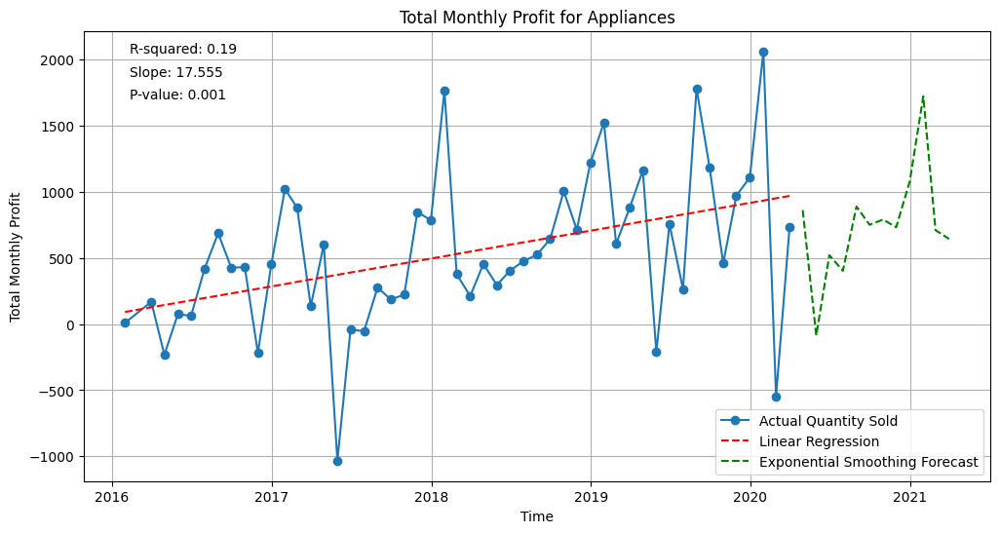

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


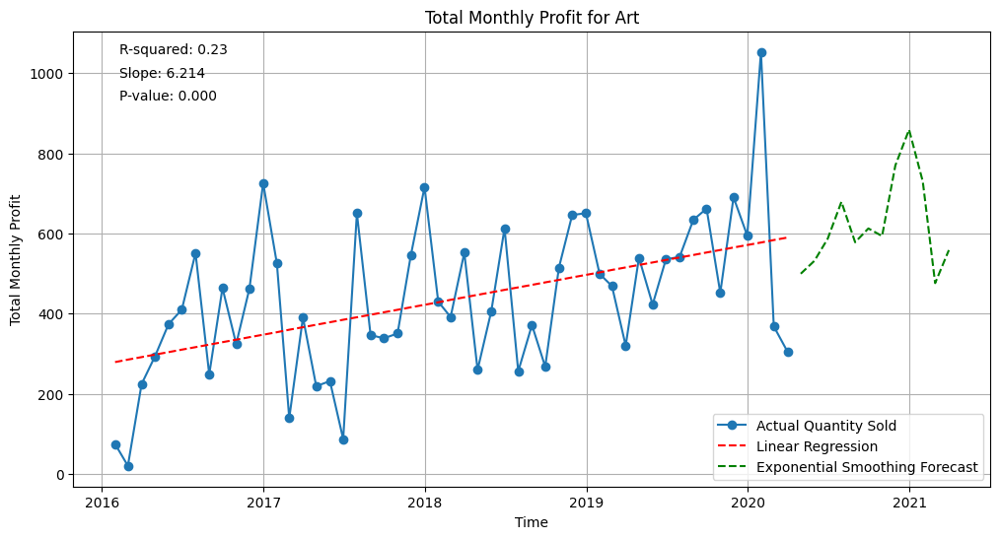

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


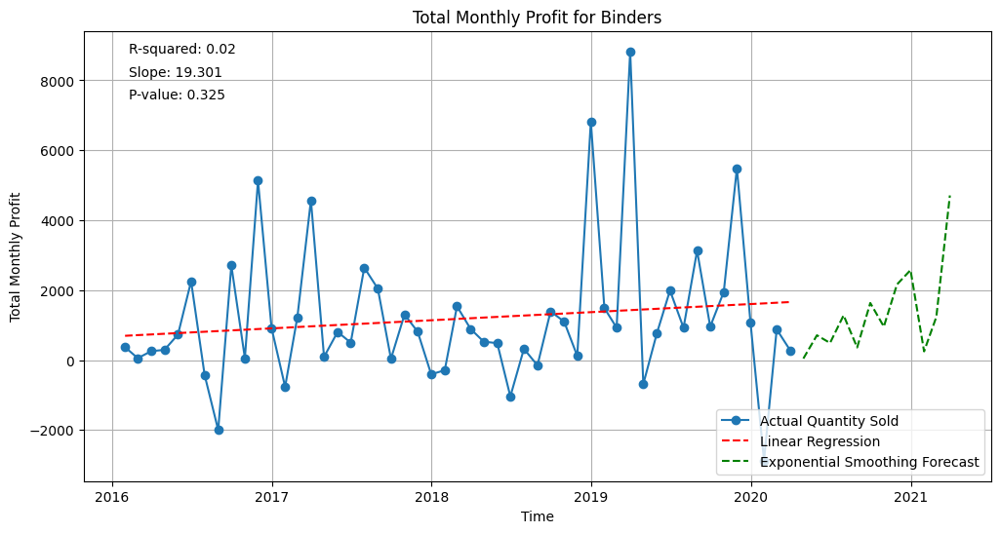

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


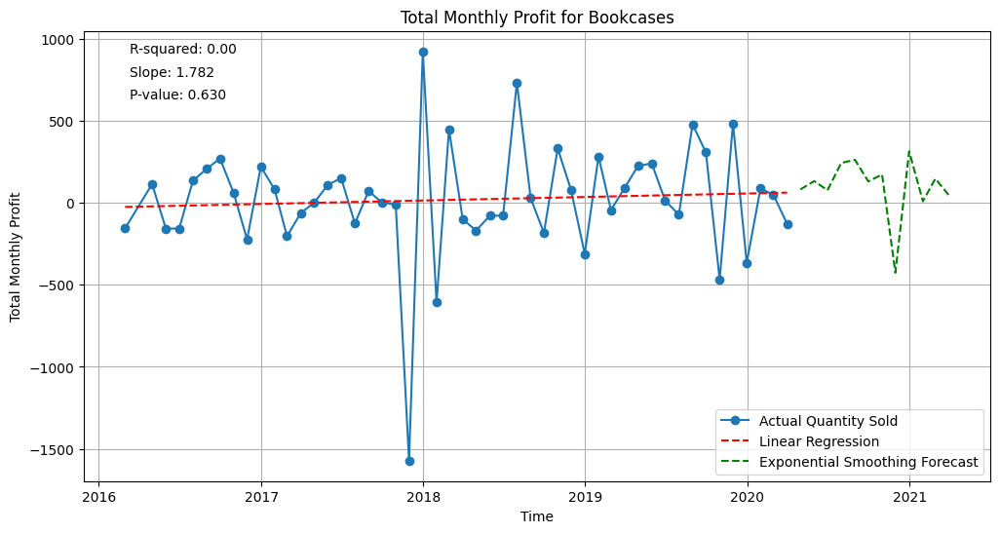

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


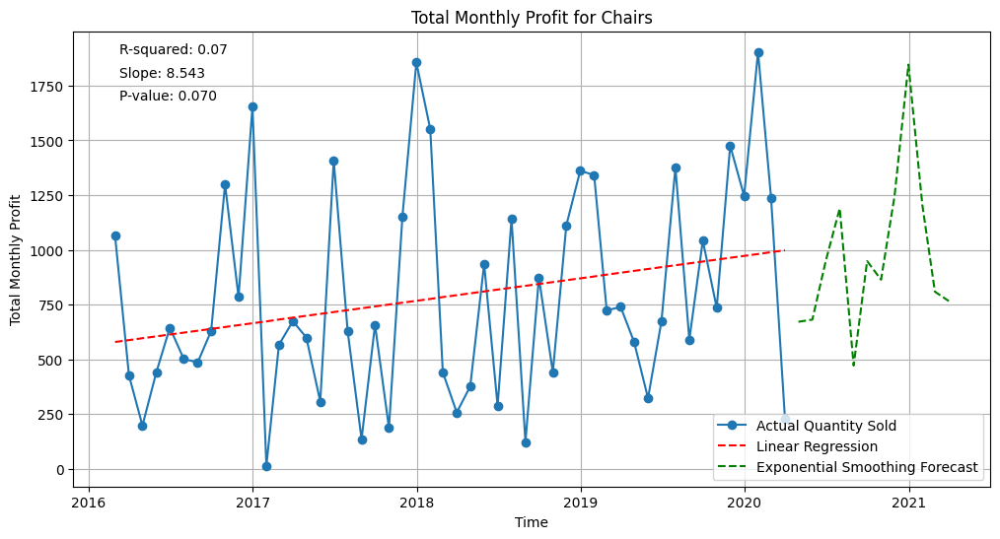

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


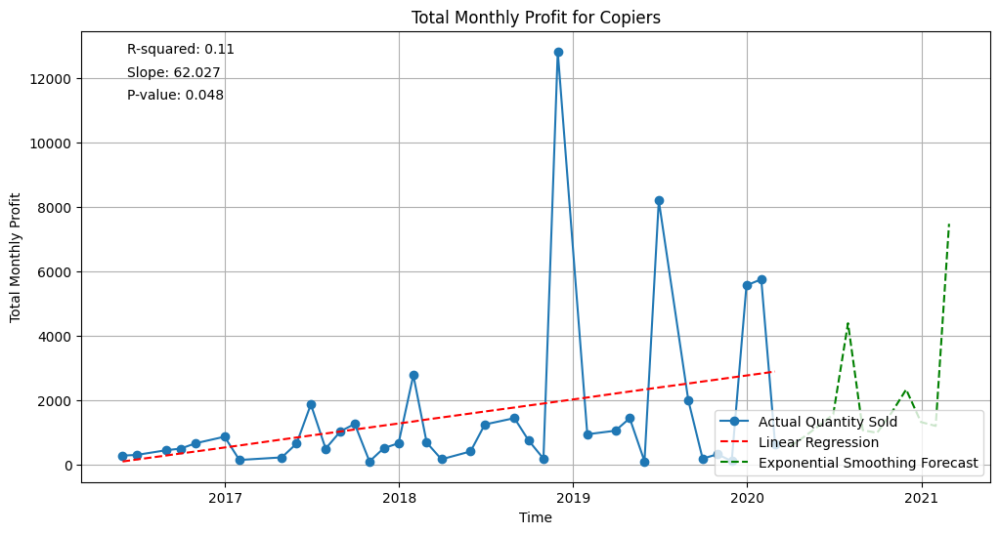

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


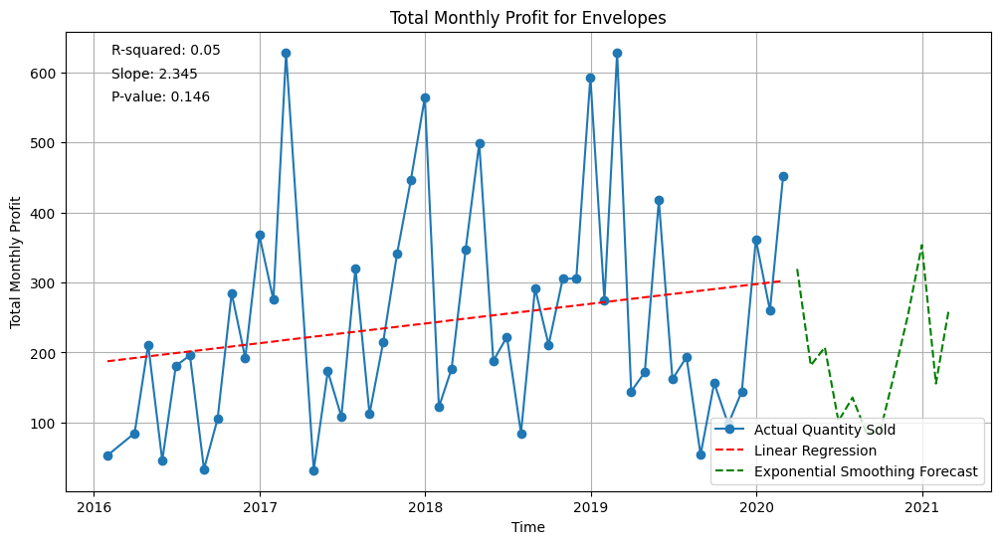

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


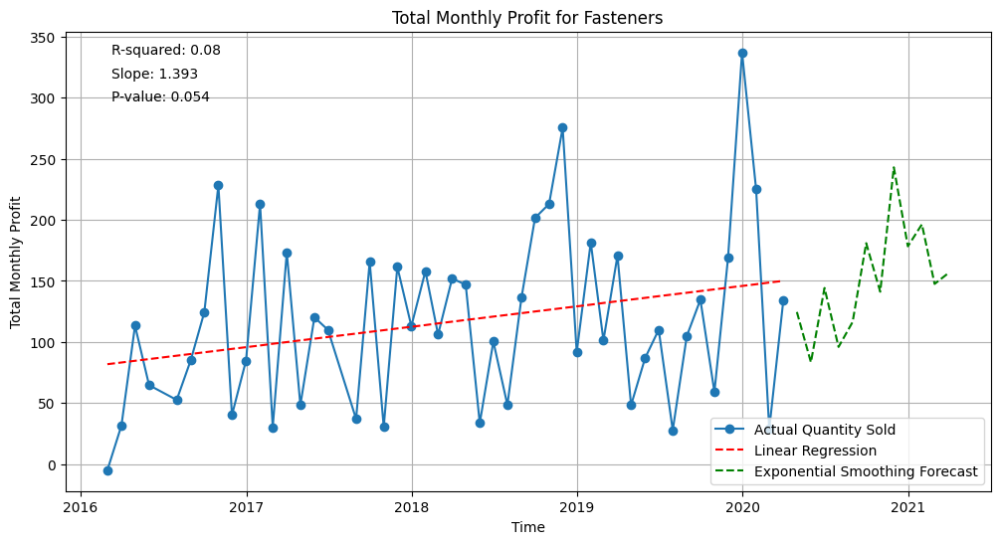

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


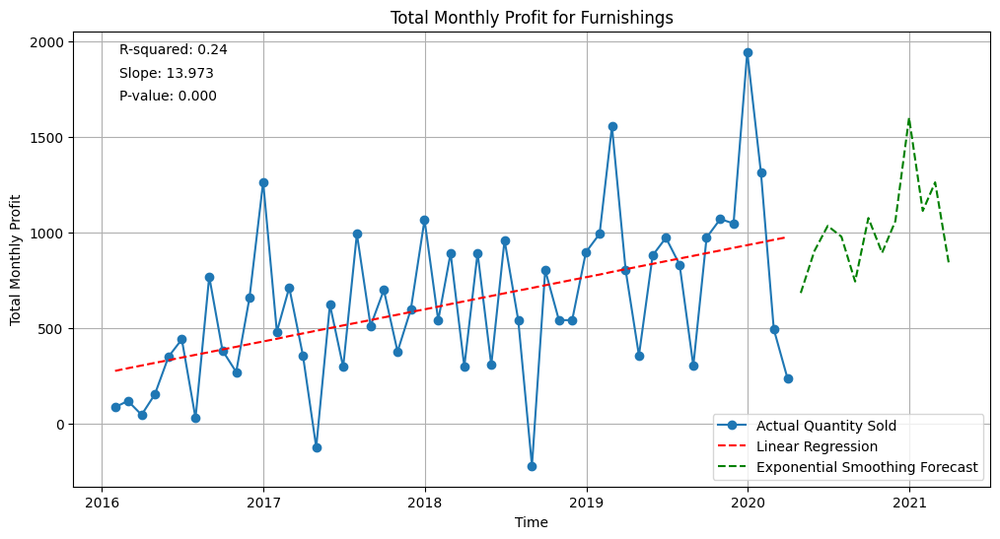

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


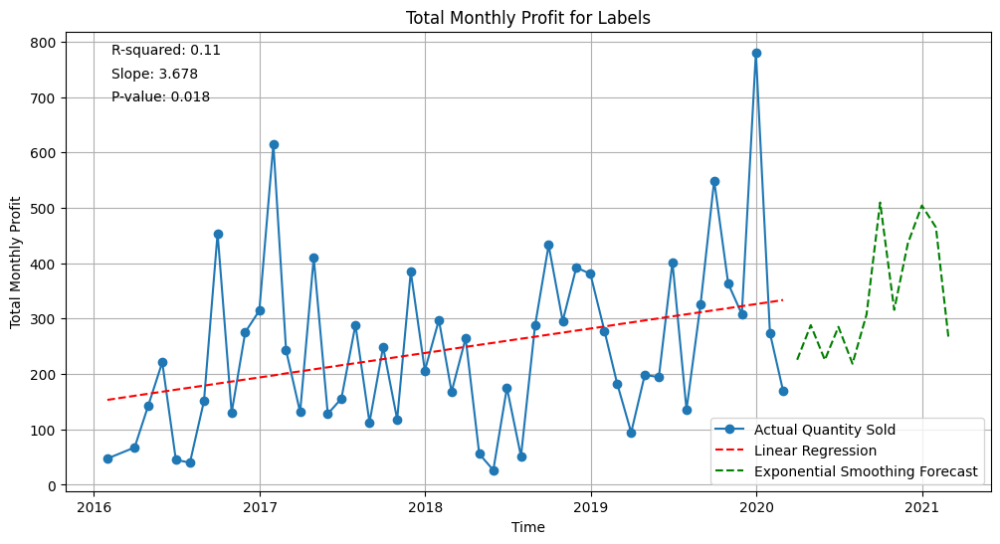

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


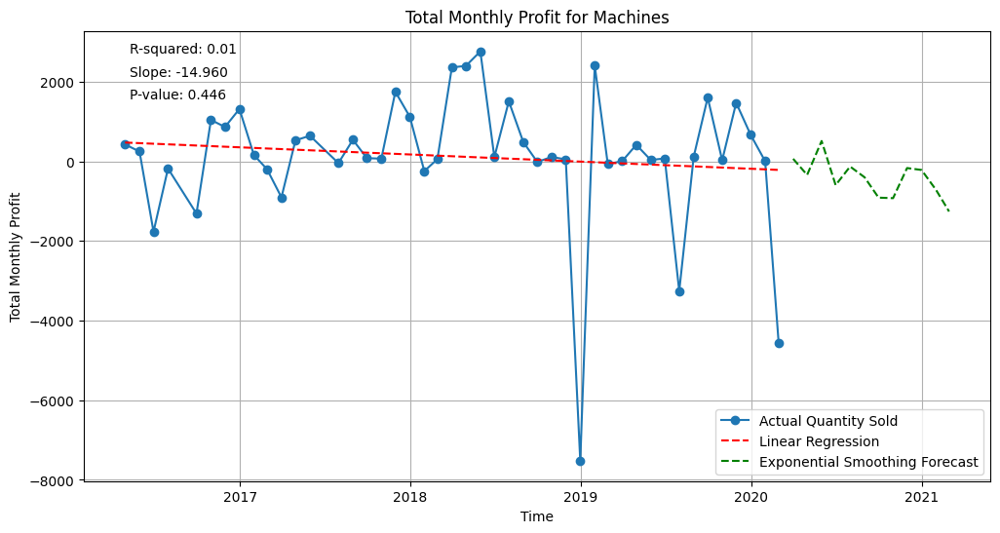

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


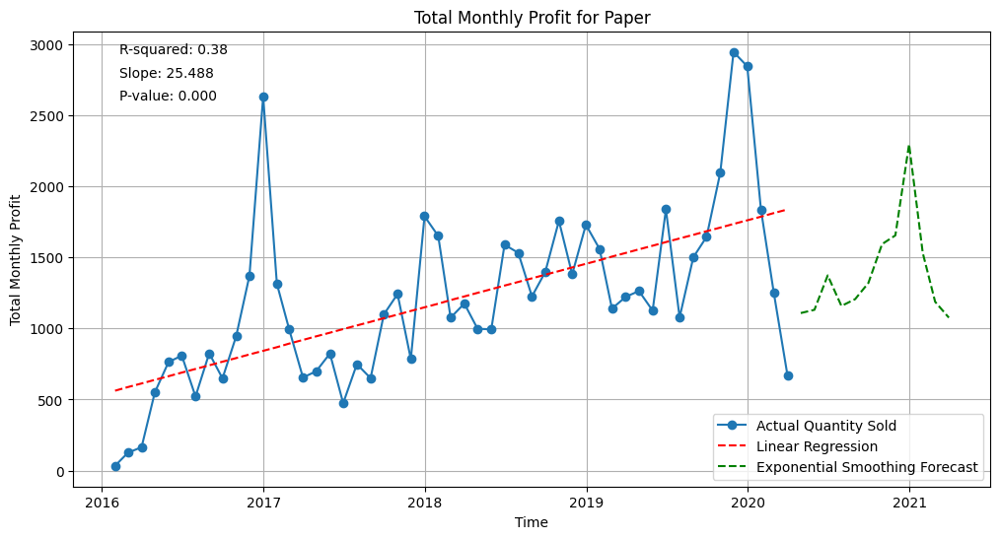

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


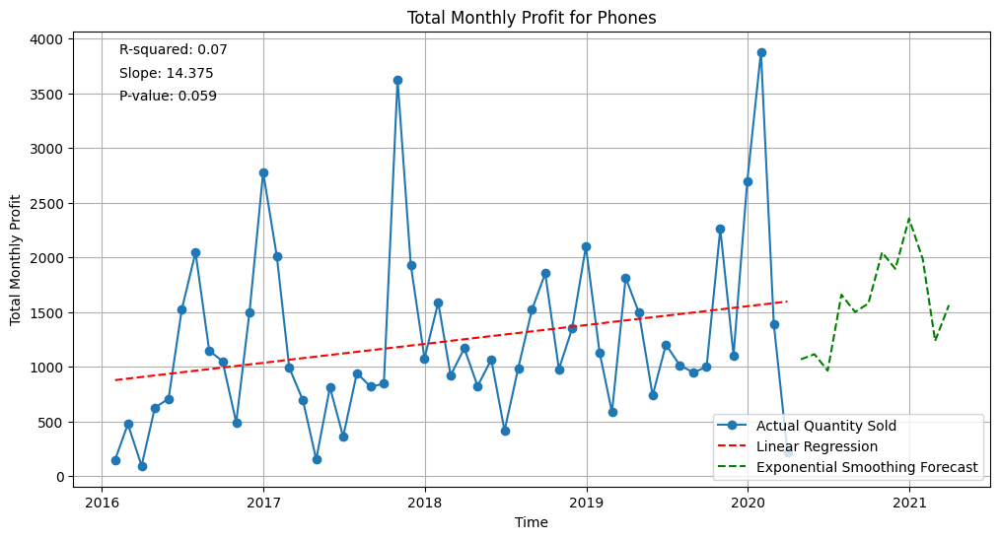

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


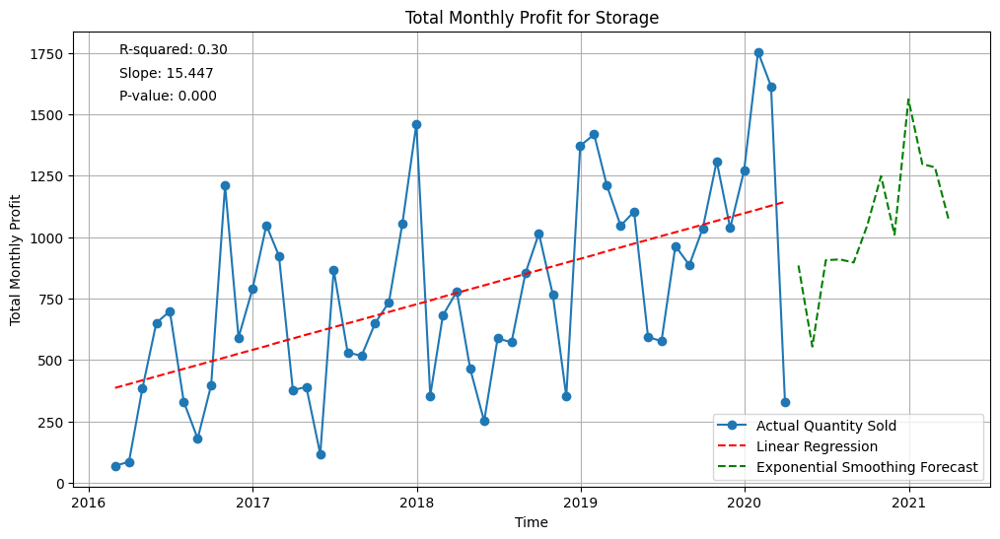

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


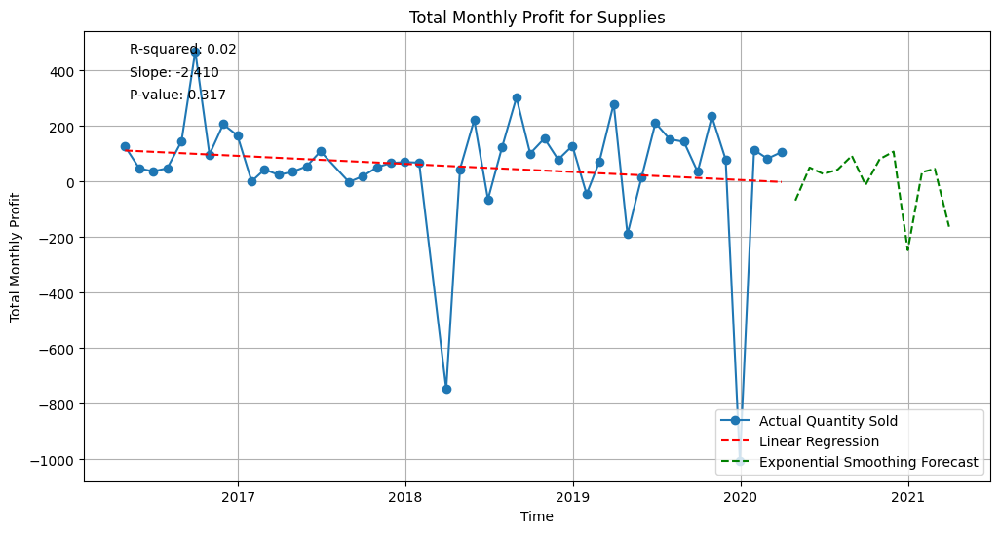

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


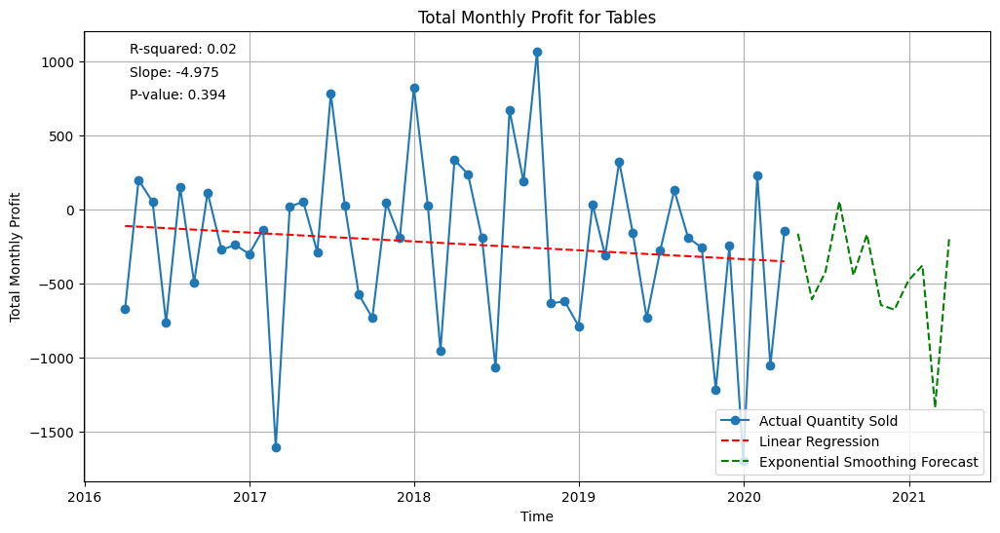

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Convert 'Order Date' to datetime objects
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Group by product subcategory and month, then calculate the total quantity sold
monthly_sales = removed.groupby(['Product_subcategory', pd.Grouper(key='Order Date', freq='ME')])['Profit_on_sale'].sum().reset_index()

# Iterate through each subcategory
for subcategory in monthly_sales['Product_subcategory'].unique():
    # Filter data for the current subcategory
    subcategory_data = monthly_sales[monthly_sales['Product_subcategory'] == subcategory]

    # Convert months to integer numbers for linear regression
    subcategory_data['month_int'] = subcategory_data['Order Date'].dt.month + (subcategory_data['Order Date'].dt.year - subcategory_data['Order Date'].dt.year.min()) * 12


    # Perform linear regression
    X = subcategory_data['month_int']
    y = subcategory_data['Profit_on_sale']
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()

    # Predict using linear regression
    y_pred = model.predict(X)

    # Plot the data and the linear regression line
    plt.figure(figsize=(12, 6))
    plt.plot(subcategory_data['Order Date'], subcategory_data['Profit_on_sale'], marker='o', linestyle='-', label='Actual Quantity Sold')
    plt.plot(subcategory_data['Order Date'], y_pred, linestyle='--', color='red', label='Linear Regression')
    plt.xlabel('Time')
    plt.ylabel('Total Monthly Profit')
    plt.title(f'Total Monthly Profit for {subcategory}')
    plt.legend()
    plt.grid(True)

    # Display the slope, R2, and p-value
    # print(f"For {subcategory}:")
    # print(f"Slope: {model.params['month_int']:.2f}")
    # print(f"R-squared: {model.rsquared:.2f}")
    # print(f"P-value: {model.pvalues['month_int']:.3f}")

    plt.text(0.05, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.90, f"Slope: {model.params['month_int']:.3f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.85, f"P-value: {model.pvalues['month_int']:.3f}", transform=plt.gca().transAxes)

    # Perform Exponential Smoothing for forecasting
    model_es = ExponentialSmoothing(subcategory_data['Profit_on_sale'], trend='add', seasonal='add', seasonal_periods=12).fit()
    forecast = model_es.forecast(12) # Forecast for the next year (12 months)

    # Generate timestamps for the forecast period
    last_date = subcategory_data['Order Date'].max()
    forecast_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=12, freq='ME')

    # Plot the forecast
    plt.plot(forecast_dates, forecast, linestyle='--', color='green', label='Exponential Smoothing Forecast')
    plt.legend(loc='lower right')
    plt.show()


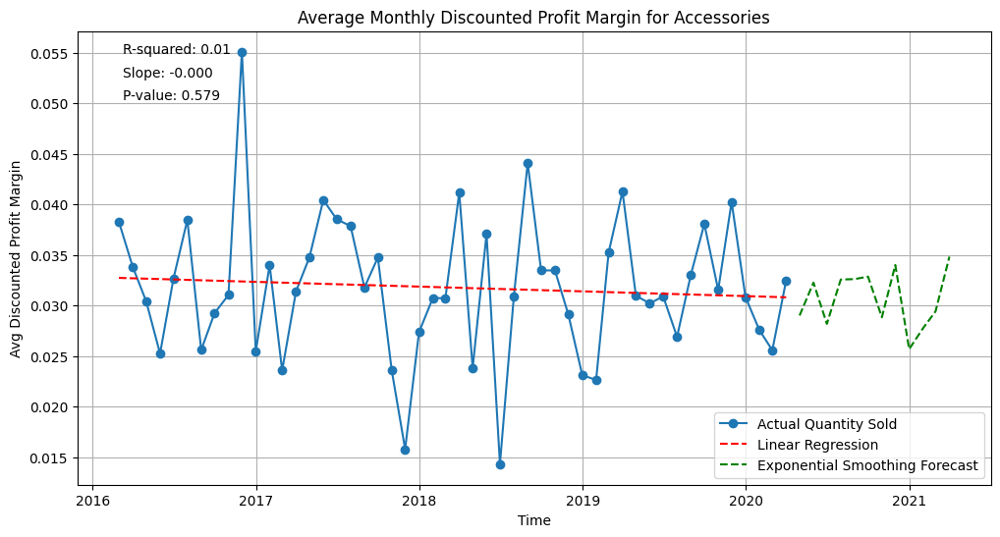

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


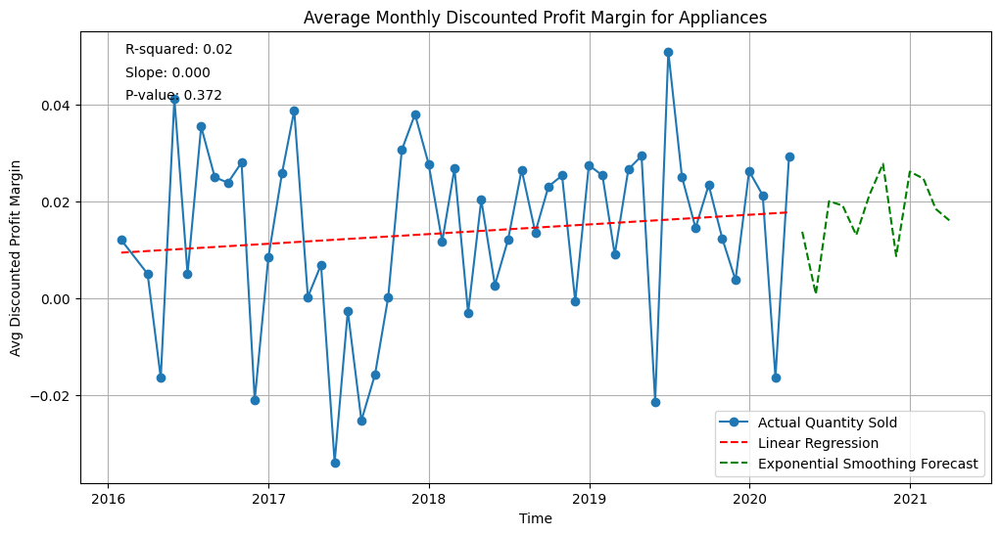

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


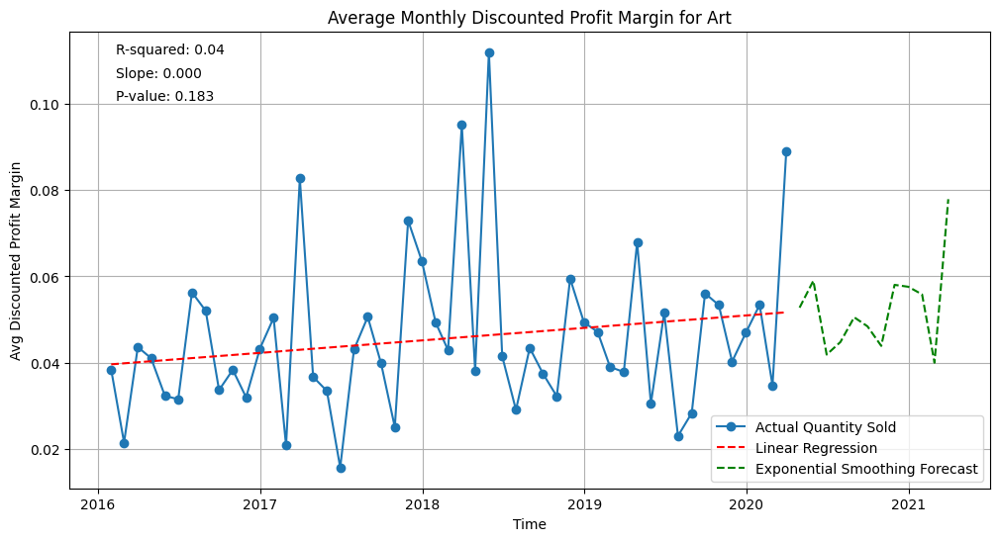

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


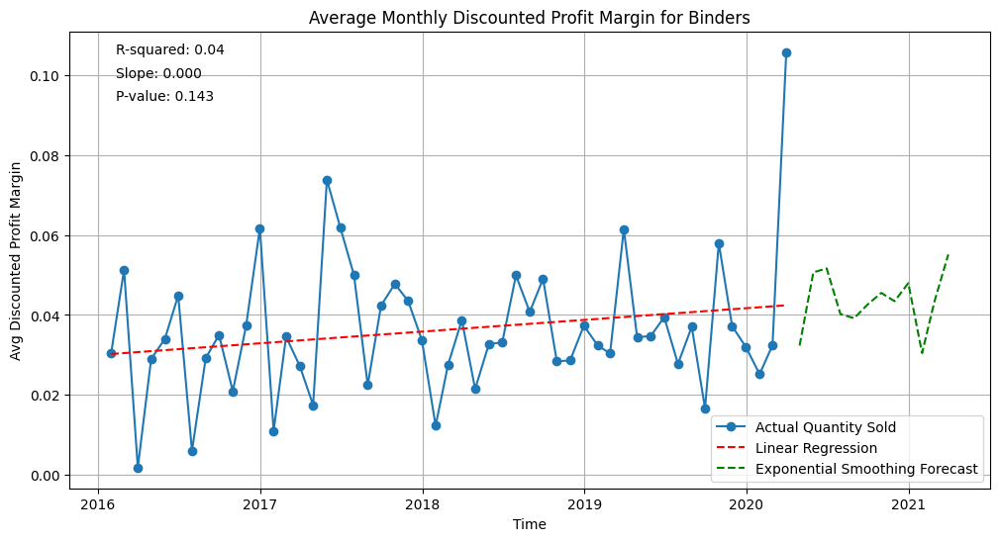

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


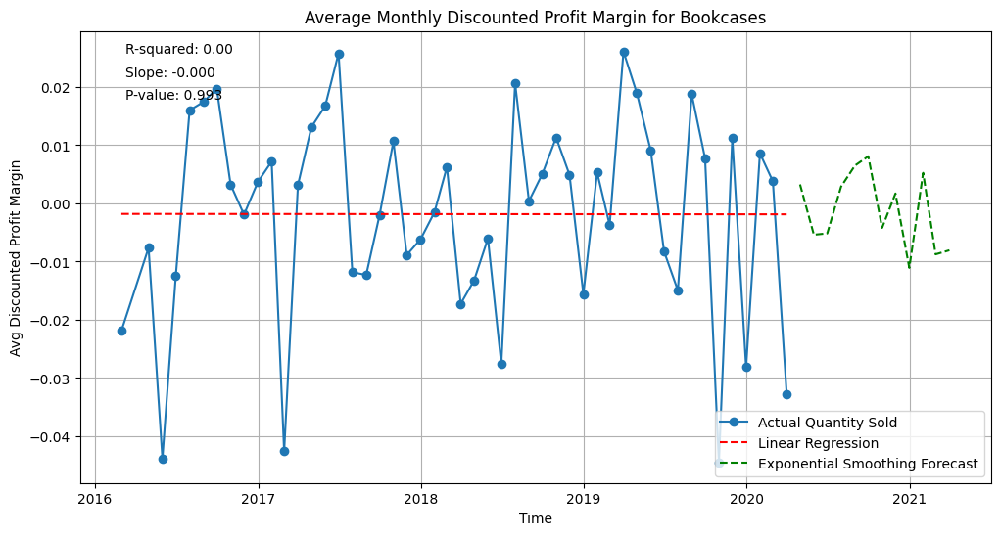

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


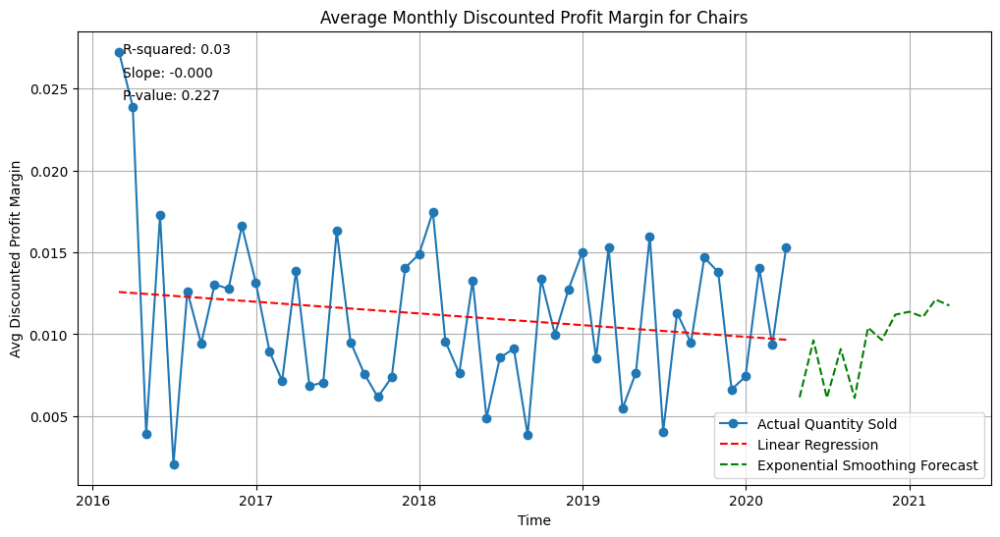

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


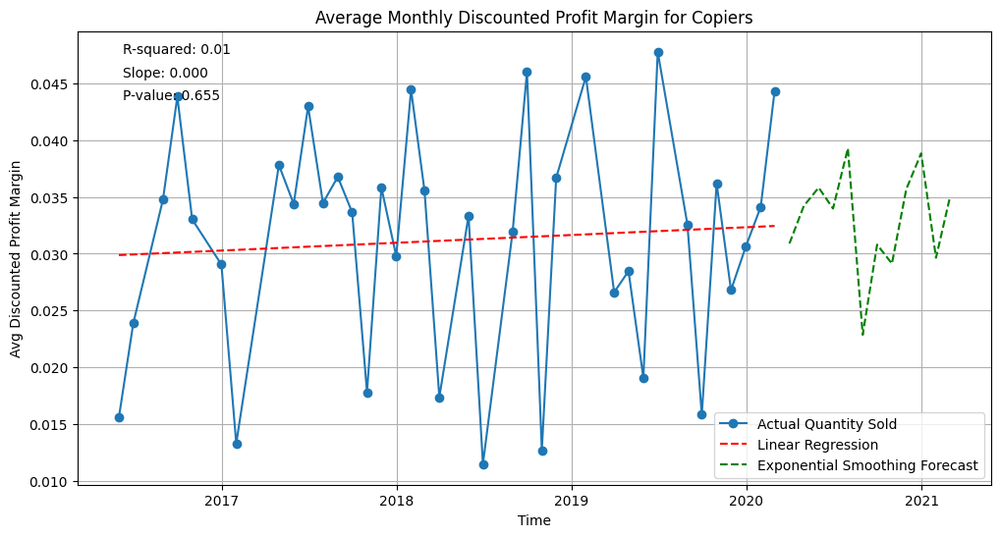

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


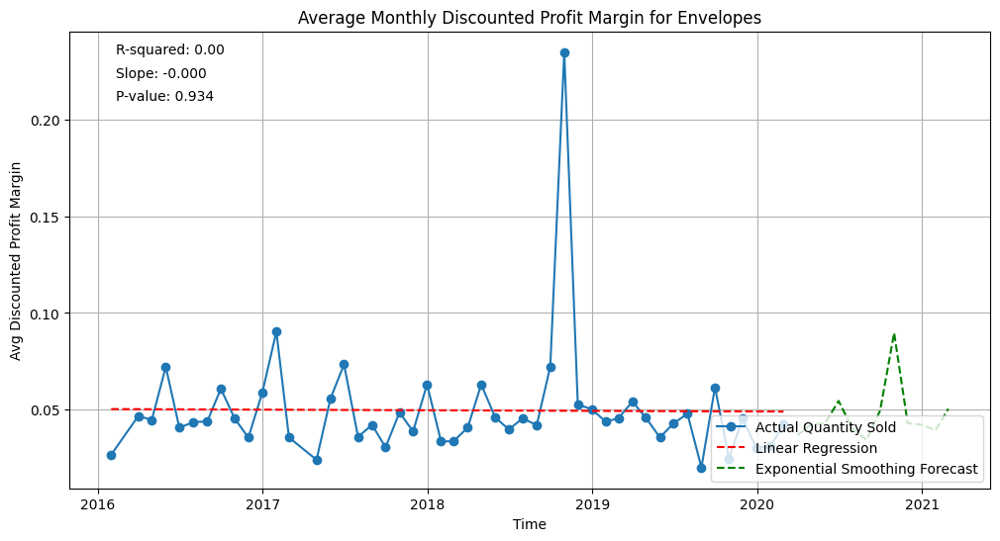

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


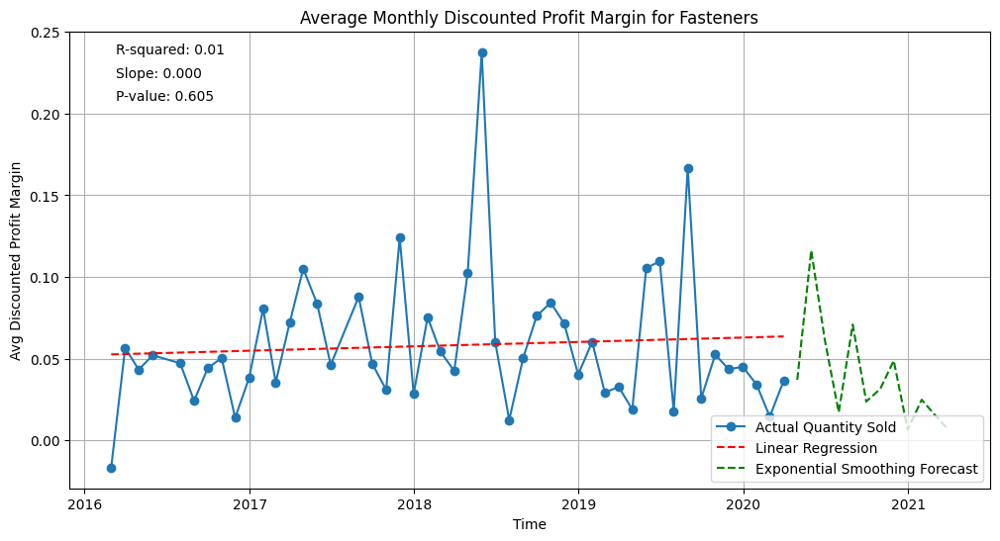

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


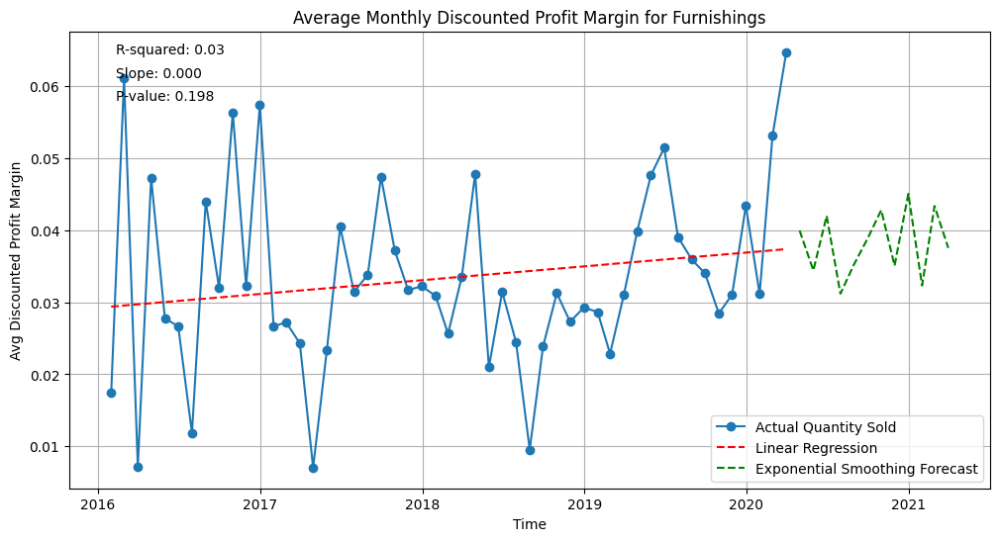

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


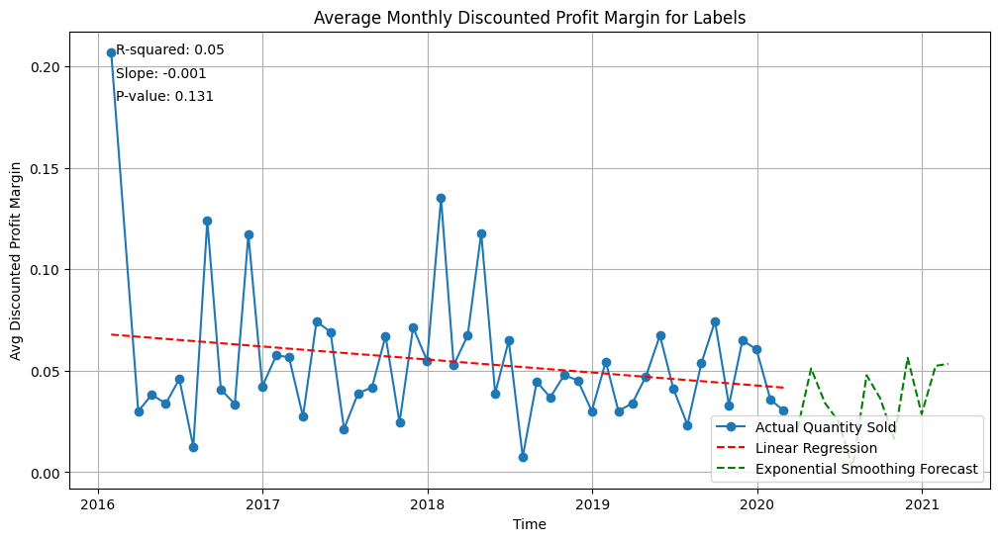

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


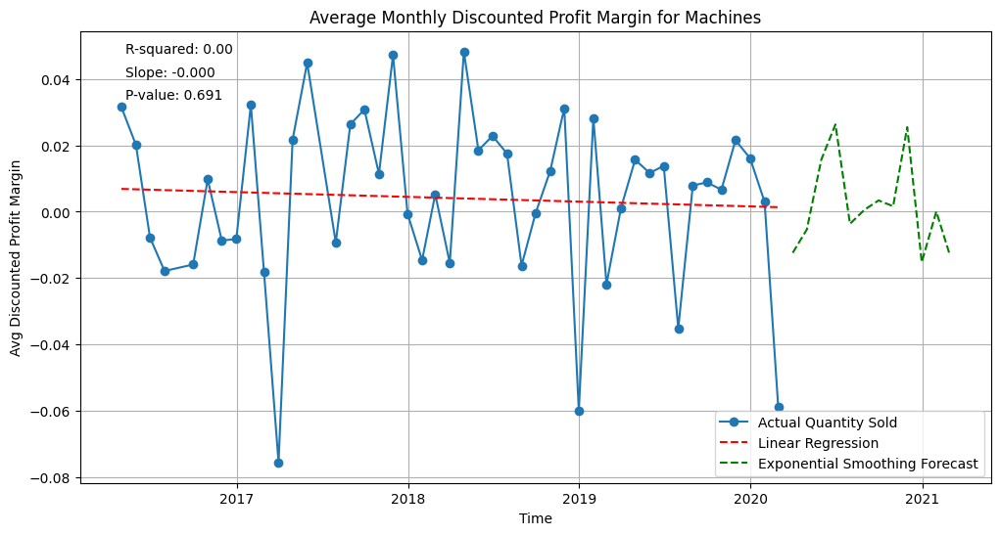

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


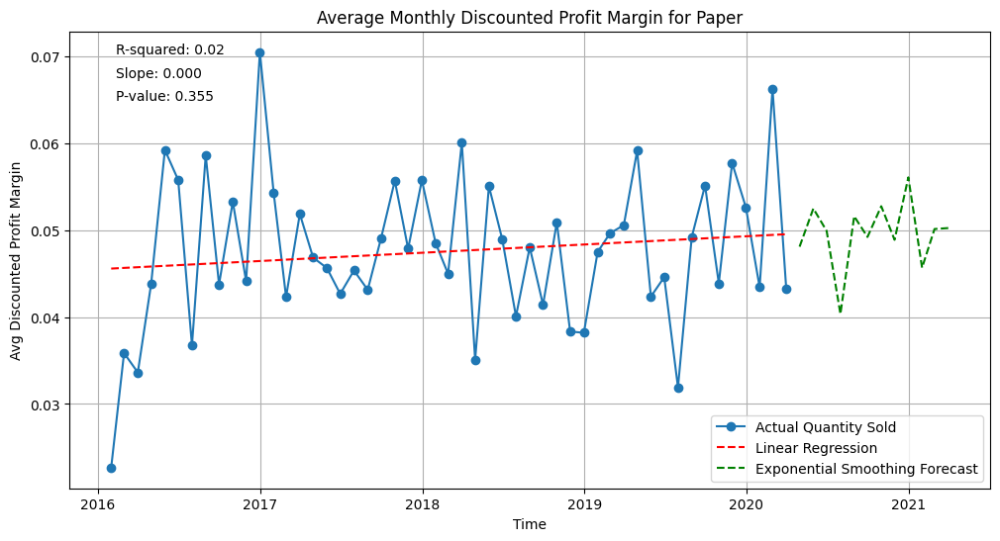

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


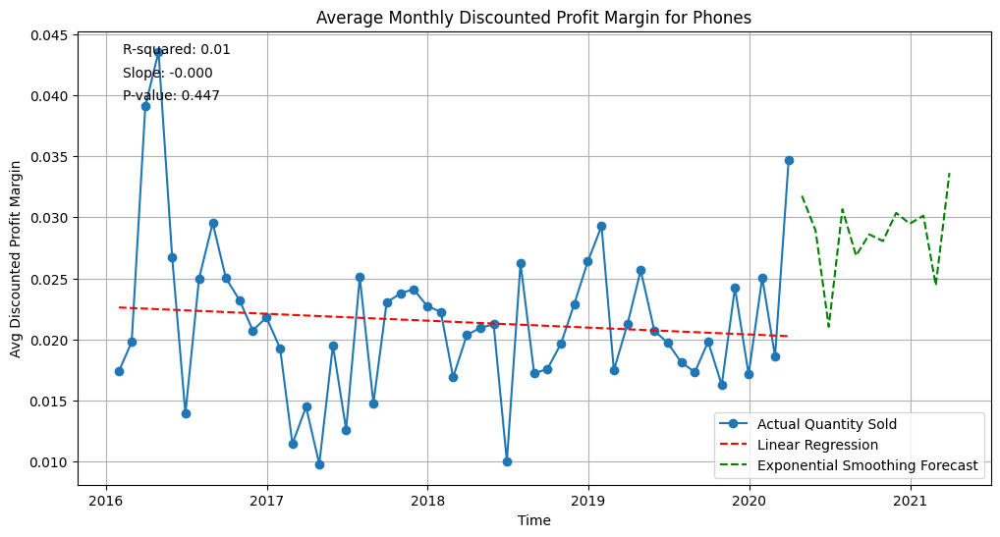

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


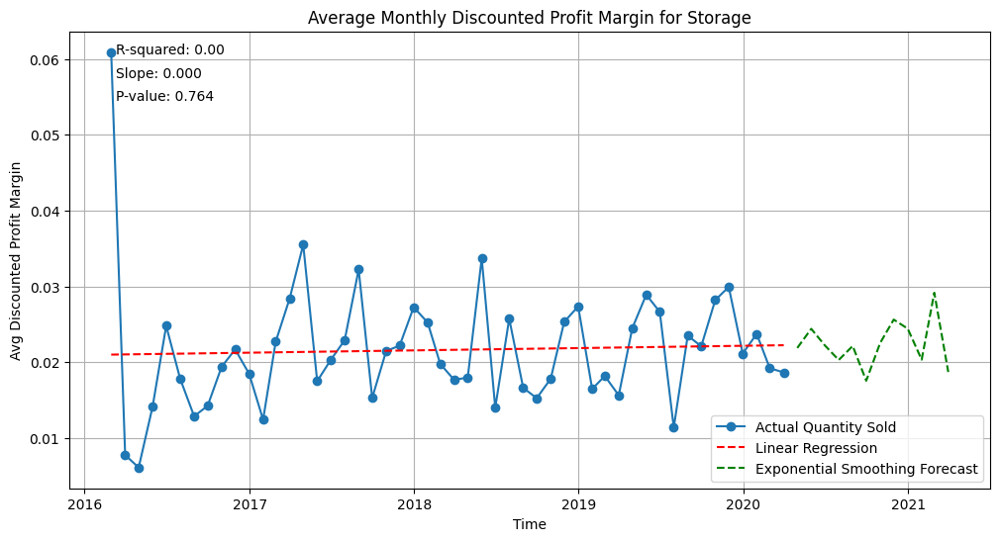

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


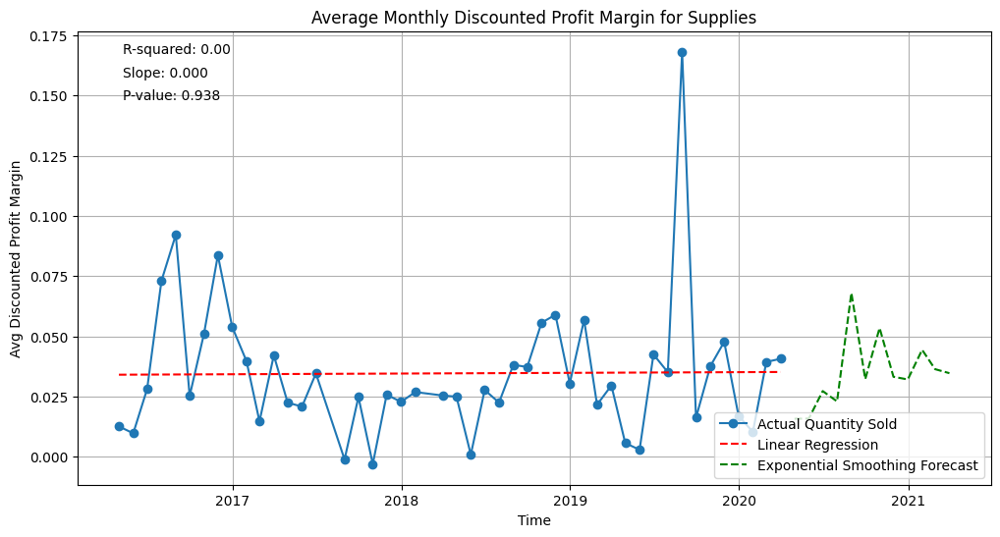

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


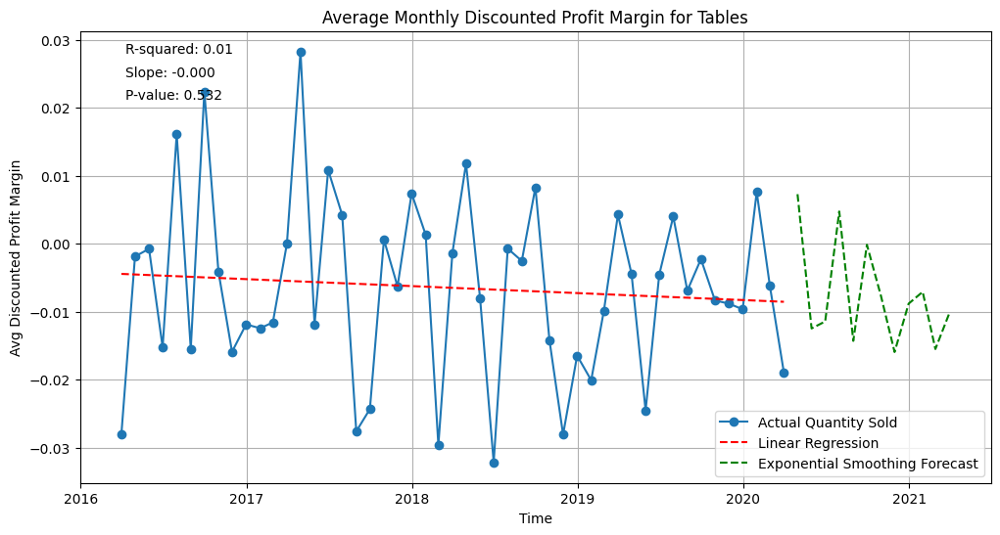

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import numpy as np
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Convert 'Order Date' to datetime objects
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Group by product subcategory and month, then calculate the total quantity sold
monthly_sales = removed.groupby(['Product_subcategory', pd.Grouper(key='Order Date', freq='ME')])['Discounted_product_margin'].mean().reset_index()

# Iterate through each subcategory
for subcategory in monthly_sales['Product_subcategory'].unique():
    # Filter data for the current subcategory
    subcategory_data = monthly_sales[monthly_sales['Product_subcategory'] == subcategory]

    # Convert months to integer numbers for linear regression
    subcategory_data['month_int'] = subcategory_data['Order Date'].dt.month + (subcategory_data['Order Date'].dt.year - subcategory_data['Order Date'].dt.year.min()) * 12

    # Perform linear regression
    X = subcategory_data['month_int']
    y = subcategory_data['Discounted_product_margin']
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()

    # Predict using linear regression
    y_pred = model.predict(X)

    # Plot the data and the linear regression line
    plt.figure(figsize=(12, 6))
    plt.plot(subcategory_data['Order Date'], subcategory_data['Discounted_product_margin'], marker='o', linestyle='-', label='Actual Quantity Sold')
    plt.plot(subcategory_data['Order Date'], y_pred, linestyle='--', color='red', label='Linear Regression')
    plt.xlabel('Time')
    plt.ylabel('Avg Discounted Profit Margin')
    plt.title(f'Average Monthly Discounted Profit Margin for {subcategory}')
    plt.legend()
    plt.grid(True)

    # Display the slope, R2, and p-value
    # print(f"For {subcategory}:")
    # print(f"Slope: {model.params['month_int']:.2f}")
    # print(f"R-squared: {model.rsquared:.2f}")
    # print(f"P-value: {model.pvalues['month_int']:.3f}")

    plt.text(0.05, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.90, f"Slope: {model.params['month_int']:.3f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.85, f"P-value: {model.pvalues['month_int']:.3f}", transform=plt.gca().transAxes)

    # Perform Exponential Smoothing for forecasting
    model_es = ExponentialSmoothing(subcategory_data['Discounted_product_margin'], trend='add', seasonal='add', seasonal_periods=12).fit()
    forecast = model_es.forecast(12) # Forecast for the next year (12 months)

    # Generate timestamps for the forecast period
    last_date = subcategory_data['Order Date'].max()
    forecast_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=12, freq='ME')

    # Plot the forecast
    plt.plot(forecast_dates, forecast, linestyle='--', color='green', label='Exponential Smoothing Forecast')
    plt.legend(loc='lower right')
    plt.show()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


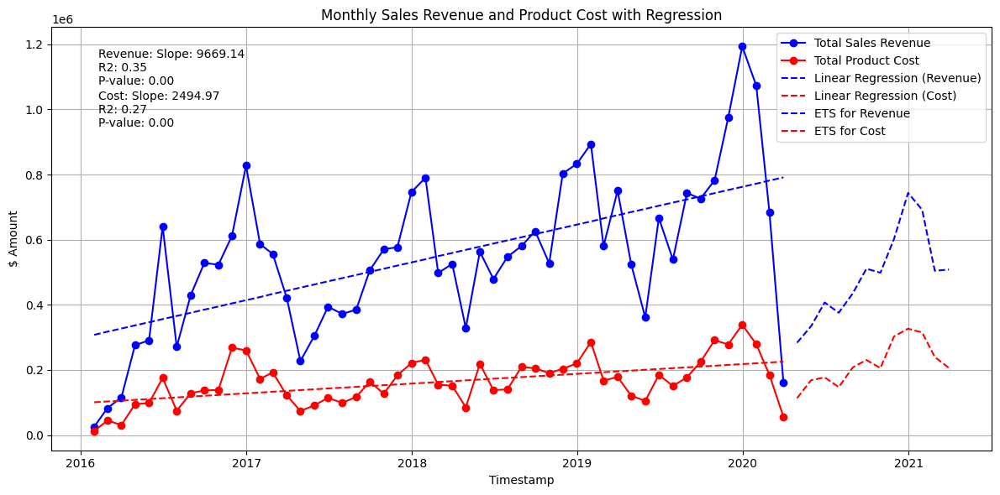

In [54]:
# prompt: Using dataframe removed: make a line plot for total monthly sales revenue and total product cost - add the best fit linear line with slope, R2 and p-value and use exponential smoothing to predict the total revenue and cost for the next year - use matplotlib and use timestamp as the x-axis - take care that the linear regression works by converting the months to integer numbers so the slope is given in units quantity per month to avoid the error argument must be a string or a real number, not 'Period'

import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Convert 'Order Date' to datetime objects if it's not already
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Group by month and calculate total sales revenue and total product cost
monthly_sales = removed.groupby(pd.Grouper(key='Order Date', freq='M'))[['Sales_revenue', 'Product_cost']].sum()

# Convert month to integer number for linear regression
monthly_sales['Month'] = range(len(monthly_sales))

# Perform linear regression on total revenue
X = monthly_sales['Month']
y = monthly_sales['Sales_revenue']
y2 = monthly_sales['Product_cost']

X = sm.add_constant(X)  # Add a constant term for the intercept
model = sm.OLS(y, X).fit()
model2 = sm.OLS(y2, X).fit()

# Extract regression results
slope = model.params['Month']
r2 = model.rsquared
p_value = model.pvalues['Month']

# Extract regression results
slope2 = model2.params['Month']
r22 = model2.rsquared
p_value2 = model2.pvalues['Month']

# Plot total monthly sales revenue and product cost
plt.figure(figsize=(12, 6))
plt.plot(monthly_sales.index, monthly_sales['Sales_revenue'], label='Total Sales Revenue', marker = 'o', color = 'blue')
plt.plot(monthly_sales.index, monthly_sales['Product_cost'], label='Total Product Cost', marker = 'o', color='red')

# Add linear regression line
plt.plot(monthly_sales.index, model.predict(), label='Linear Regression (Revenue)', linestyle='--', color='blue')
plt.plot(monthly_sales.index, model2.predict(), label='Linear Regression (Cost)', linestyle='--', color='red')


# Add best fit linear line equation
plt.text(0.05, 0.95, f"Revenue: Slope: {slope:.2f}\nR2: {r2:.2f}\nP-value: {p_value:.2f}",
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

plt.text(0.05, 0.85, f"Cost: Slope: {slope2:.2f}\nR2: {r22:.2f}\nP-value: {p_value2:.2f}",
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

# Exponential Smoothing
# Create a model and fit it using total revenue
model_es = ExponentialSmoothing(monthly_sales['Sales_revenue'], trend='mul', seasonal='mul', seasonal_periods=12).fit()


# Prediction for the next year (12 months)
forecast = model_es.forecast(12)

plt.plot(forecast.index, forecast, label='ETS for Revenue', linestyle='--', color='blue')


# Create a model and fit it using total cost
model_es = ExponentialSmoothing(monthly_sales['Product_cost'], trend='mul', seasonal='mul', seasonal_periods=12).fit()

# Prediction for the next year (12 months)
forecast = model_es.forecast(12)

plt.plot(forecast.index, forecast, label='ETS for Cost', linestyle='--', color='red')


# Customize the plot
plt.xlabel('Timestamp')
plt.ylabel('$ Amount')
plt.title('Monthly Sales Revenue and Product Cost with Regression')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

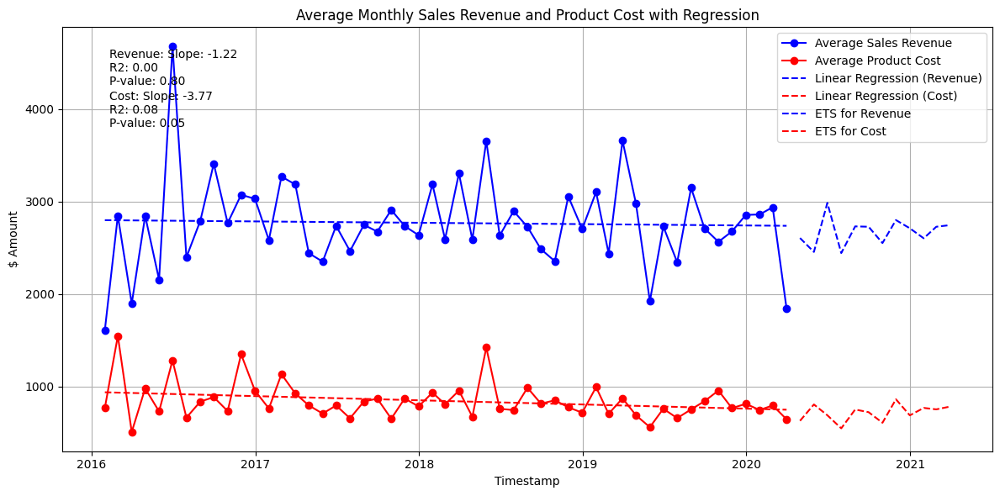

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Convert 'Order Date' to datetime objects if it's not already
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Group by month and calculate total sales revenue and total product cost
monthly_sales = removed.groupby(pd.Grouper(key='Order Date', freq='M'))[['Sales_revenue', 'Product_cost']].mean()

# Convert month to integer number for linear regression
monthly_sales['Month'] = range(len(monthly_sales))

# Perform linear regression on total revenue
X = monthly_sales['Month']
y = monthly_sales['Sales_revenue']
y2 = monthly_sales['Product_cost']

X = sm.add_constant(X)  # Add a constant term for the intercept
model = sm.OLS(y, X).fit()
model2 = sm.OLS(y2, X).fit()

# Extract regression results
slope = model.params['Month']
r2 = model.rsquared
p_value = model.pvalues['Month']

# Extract regression results
slope2 = model2.params['Month']
r22 = model2.rsquared
p_value2 = model2.pvalues['Month']

# Plot total monthly sales revenue and product cost
plt.figure(figsize=(12, 6))
plt.plot(monthly_sales.index, monthly_sales['Sales_revenue'], label='Average Sales Revenue', marker = 'o', color = 'blue')
plt.plot(monthly_sales.index, monthly_sales['Product_cost'], label='Average Product Cost', marker = 'o', color='red')

# Add linear regression line
plt.plot(monthly_sales.index, model.predict(), label='Linear Regression (Revenue)', linestyle='--', color='blue')
plt.plot(monthly_sales.index, model2.predict(), label='Linear Regression (Cost)', linestyle='--', color='red')


# Add best fit linear line equation
plt.text(0.05, 0.95, f"Revenue: Slope: {slope:.2f}\nR2: {r2:.2f}\nP-value: {p_value:.2f}",
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

plt.text(0.05, 0.85, f"Cost: Slope: {slope2:.2f}\nR2: {r22:.2f}\nP-value: {p_value2:.2f}",
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

# Exponential Smoothing
# Create a model and fit it using total revenue
model_es = ExponentialSmoothing(monthly_sales['Sales_revenue'], trend='add', seasonal='add', seasonal_periods=12).fit()


# Prediction for the next year (12 months)
forecast = model_es.forecast(12)

plt.plot(forecast.index, forecast, label='ETS for Revenue', linestyle='--', color='blue')


# Create a model and fit it using total cost
model_es = ExponentialSmoothing(monthly_sales['Product_cost'], trend='add', seasonal='add', seasonal_periods=12).fit()

# Prediction for the next year (12 months)
forecast = model_es.forecast(12)

plt.plot(forecast.index, forecast, label='ETS for Cost', linestyle='--', color='red')


# Customize the plot
plt.xlabel('Timestamp')
plt.ylabel('$ Amount')
plt.title('Average Monthly Sales Revenue and Product Cost with Regression')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

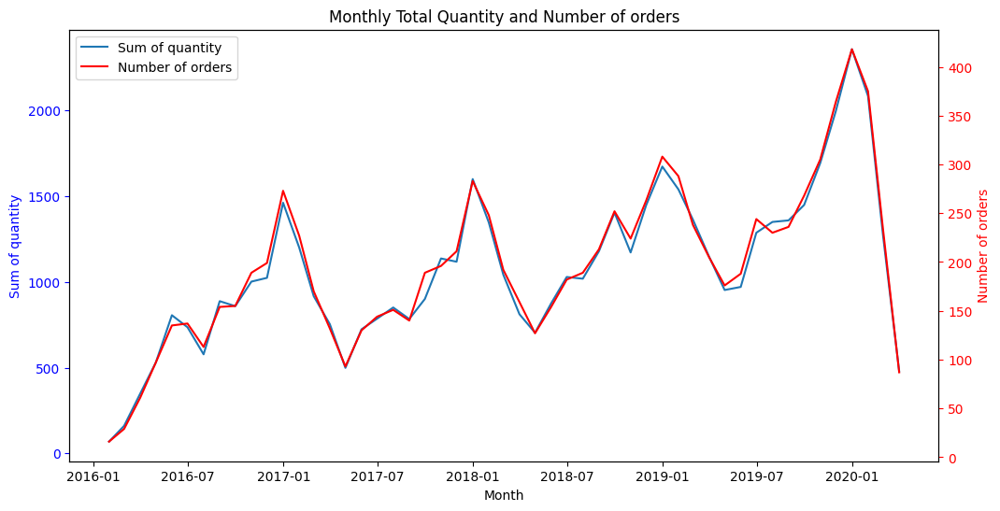

In [56]:
# prompt: Using dataframe removed: make a line plot for total sales revenue, profit on sale - aggregate by month to make the data less noisy - use matplotlib and twin axes for the profit and add legends

import matplotlib.pyplot as plt
import pandas as pd

# Convert 'Order Date' to datetime if it's not already
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Aggregate by month
monthly_data = removed.groupby(pd.Grouper(key='Order Date', freq='M')) \
    .agg({'Quantity_sold':'sum', 'Update order ID': 'count'})

# Create the figure and axes

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot total sales revenue
ax1.plot(monthly_data.index, monthly_data['Quantity_sold'], label='Sum of quantity')
ax1.set_xlabel('Month')
ax1.set_ylabel('Sum of quantity', color='blue')
ax1.tick_params('y', colors='blue')

#ax1.plot(monthly_data.index, monthly_data['Update order ID'], color='red', label='Number of orders')

# Create a second axes sharing the same x-axis
ax2 = ax1.twinx()

# Plot profit on sale
ax2.plot(monthly_data.index, monthly_data['Update order ID'], color='red', label='Number of orders')
ax2.set_ylabel('Number of orders', color='red')
ax2.tick_params('y', colors='red')

# Add legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='best')
#ax1.legend(lines, labels, loc='best')

# Show the plot
plt.title('Monthly Total Quantity and Number of orders')
plt.show()

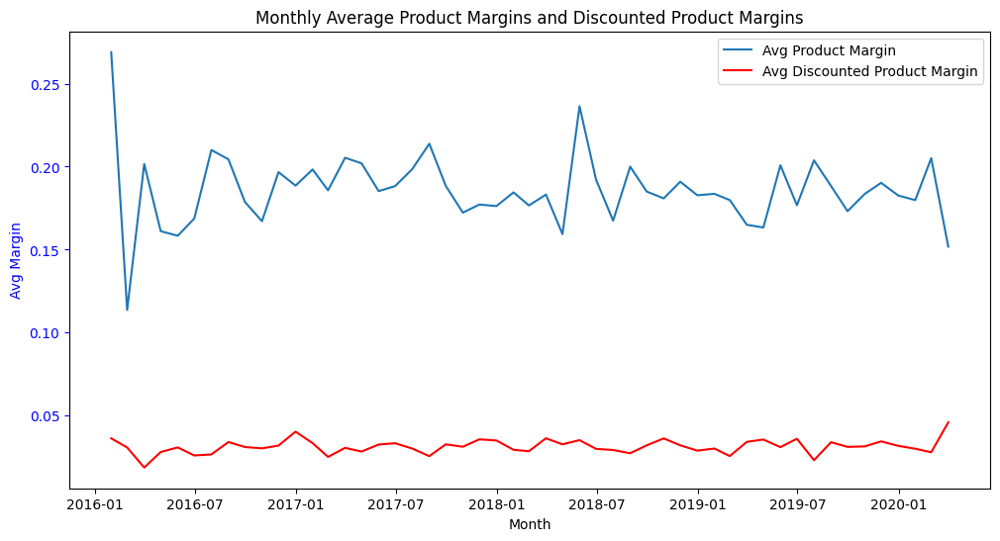

In [57]:
# prompt: Using dataframe removed: make a line plot for total sales revenue, profit on sale - aggregate by month to make the data less noisy - use matplotlib and twin axes for the profit and add legends

import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'removed' is your DataFrame

# Convert 'Order Date' to datetime if it's not already
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Aggregate by month
monthly_data = removed.groupby(pd.Grouper(key='Order Date', freq='M')) \
    .agg({'Product_margin': 'mean', 'Discounted_product_margin': 'mean'})

# Create the figure and axes

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot total sales revenue
ax1.plot(monthly_data.index, monthly_data['Product_margin'], label='Avg Product Margin')
ax1.set_xlabel('Month')
ax1.set_ylabel('Avg Margin', color='blue')
ax1.tick_params('y', colors='blue')

ax1.plot(monthly_data.index, monthly_data['Discounted_product_margin'], color='red', label='Avg Discounted Product Margin')

# Create a second axes sharing the same x-axis
# ax2 = ax1.twinx()

# Plot profit on sale
# ax2.plot(monthly_data.index, monthly_data['Product_cost'], color='green', label='Avg Product Cost')
# ax2.set_ylabel('Avg Product Cost', color='green')
# ax2.tick_params('y', colors='red')

# Add legends
lines, labels = ax1.get_legend_handles_labels()
#lines2, labels2 = ax2.get_legend_handles_labels()
#ax2.legend(lines + lines2, labels + labels2, loc='best')
ax1.legend(lines, labels, loc='best')

# Show the plot
plt.title('Monthly Average Product Margins and Discounted Product Margins')
plt.show()

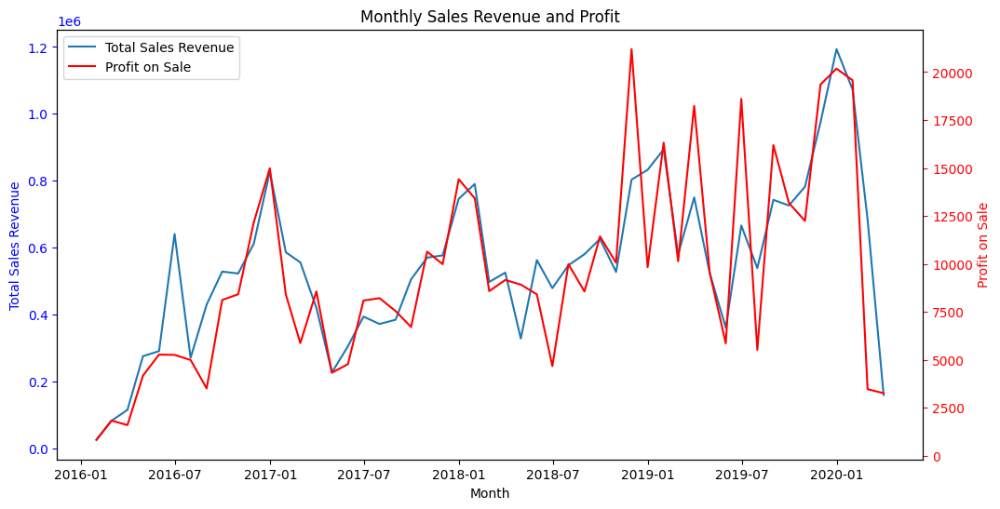

In [58]:
# prompt: Using dataframe removed: make a line plot for total sales revenue, profit on sale - aggregate by month to make the data less noisy - use matplotlib and twin axes for the profit and add legends

import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'removed' is your DataFrame

# Convert 'Order Date' to datetime if it's not already
removed['Order Date'] = pd.to_datetime(removed['Order Date'])

# Aggregate by month
monthly_data = removed.groupby(pd.Grouper(key='Order Date', freq='M')) \
    .agg({'Sales_revenue': 'sum', 'Profit_on_sale': 'sum'})

# Create the figure and axes

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot total sales revenue
ax1.plot(monthly_data.index, monthly_data['Sales_revenue'], label='Total Sales Revenue')
ax1.set_xlabel('Month')
ax1.set_ylabel('Total Sales Revenue', color='blue')
ax1.tick_params('y', colors='blue')

# Create a second axes sharing the same x-axis
ax2 = ax1.twinx()

# Plot profit on sale
ax2.plot(monthly_data.index, monthly_data['Profit_on_sale'], color='red', label='Profit on Sale')
ax2.set_ylabel('Profit on Sale', color='red')
ax2.tick_params('y', colors='red')

# Add legends
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='best')

# Show the plot
plt.title('Monthly Sales Revenue and Profit')
plt.show()

In [60]:
#Top products in terms of order number

sales.groupby('Update order ID')['Product ID'].first().value_counts()

,count
Product ID,
OFF-PA-10001970,19
TEC-AC-10003832,18
FUR-FU-10004270,16
FUR-CH-10001146,15
FUR-CH-10002647,15
...,...
TEC-PH-10003535,1
TEC-MA-10003329,1
FUR-TA-10001691,1


In [61]:
#Top products in terms of total quantity sold

sales.groupby('Product ID')['Quantity_sold'].sum().sort_values(ascending=False)

,Quantity_sold
Product ID,
OFF-PA-10001970,109
FUR-CH-10001146,99
TEC-AC-10003628,91
OFF-ST-10000078,88
TEC-AC-10003832,88
...,...
OFF-LA-10003388,1
TEC-MA-10003353,1
TEC-MA-10003066,1


In [59]:
#how many times a certain discount was applied on orders

sales['Discount_applied'].value_counts()

,count
Discount_applied,
0.00,4798
0.20,3657
0.70,418
0.80,300
0.30,227
0.40,206
0.60,138
0.10,94
0.50,66


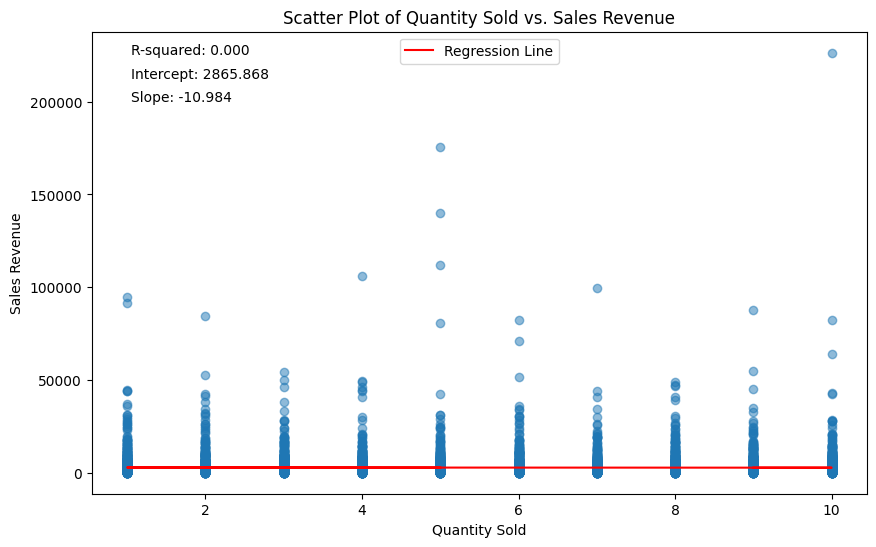

In [63]:
#revenue doesn't increase with more quantity?! Maybe it's unit price and not sales revenue?
# prompt: Using dataframe sales: make a scatter plot between quantity sold and sales revenue and add the regression line with R2 and regression coefficients displayed - use matplotlib

import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(sales['Quantity_sold'], sales['Sales_revenue'], alpha=0.5)
plt.xlabel('Quantity Sold')
plt.ylabel('Sales Revenue')
plt.title('Scatter Plot of Quantity Sold vs. Sales Revenue')

# Add regression line
X = sales['Quantity_sold'].values.reshape(-1, 1)  # Reshape for sklearn
y = sales['Sales_revenue'].values
reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)
plt.plot(X, y_pred, color='red', label='Regression Line')

# Calculate R-squared
r_squared = reg.score(X, y)

# Calculate regression coefficients
intercept = reg.intercept_
slope = reg.coef_[0]

# Display R-squared and regression coefficients
plt.text(0.05, 0.95, f"R-squared: {r_squared:.3f}", transform=plt.gca().transAxes)
plt.text(0.05, 0.90, f"Intercept: {intercept:.3f}", transform=plt.gca().transAxes)
plt.text(0.05, 0.85, f"Slope: {slope:.3f}", transform=plt.gca().transAxes)

plt.legend(loc='upper center')
plt.show()

<Figure size 1000x600 with 0 Axes>

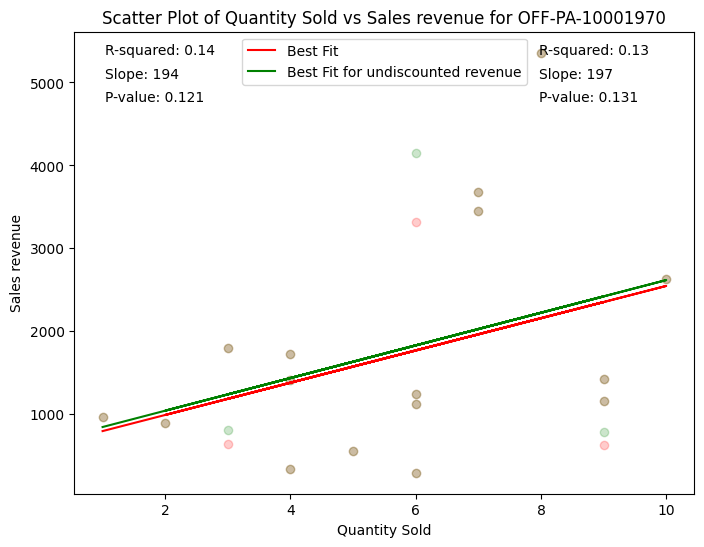

In [65]:
import statsmodels.formula.api as sm

paper = sales[sales['Product ID']=='OFF-PA-10001970']
paper['Undiscounted_sales_revenue'] = paper['Quantity_sold'] * paper['Product_price']

plt.figure(figsize=(10, 6))

# Fit a linear regression model
model = sm.ols('Sales_revenue ~ Quantity_sold', data=paper).fit()

# Create the scatter plot
plt.figure(figsize=(8, 6))

plt.scatter(paper['Quantity_sold'], paper['Sales_revenue'], alpha=0.2, color='red')
plt.scatter(paper['Quantity_sold'], paper['Undiscounted_sales_revenue'], alpha=0.2, color='green')

plt.title(f'Scatter Plot of Quantity Sold vs Sales revenue for OFF-PA-10001970')
plt.xlabel('Quantity Sold')
plt.ylabel('Sales revenue')

# Add the regression line
plt.plot(paper['Quantity_sold'], model.predict(), color='red', label='Best Fit')

# Add R-squared value to the plot
# Add regression coefficients to the plot
plt.text(0.05, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
plt.text(0.05, 0.90, f"Slope: {model.params['Quantity_sold']:.0f}", transform=plt.gca().transAxes)
plt.text(0.05, 0.85, f"P-value: {model.pvalues[1]:.3f}", transform=plt.gca().transAxes)

# Add regression line
model = sm.ols('Undiscounted_sales_revenue ~ Quantity_sold', data=paper).fit()
plt.plot(paper['Quantity_sold'], model.predict(), color='green', label='Best Fit for undiscounted revenue')

# Display R-squared and regression coefficients
plt.text(0.75, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
plt.text(0.75, 0.90, f"Slope: {model.params['Quantity_sold']:.0f}", transform=plt.gca().transAxes)
plt.text(0.75, 0.85, f"P-value: {model.pvalues[1]:.3f}", transform=plt.gca().transAxes)

plt.legend(loc='upper center')
plt.show()

In [66]:
#not quite the slope on the graph..

sales[sales['Product ID'] == 'OFF-PA-10001970']['Discounted_product_price'].mean()

343.02819548872185

In [67]:
sales[sales['Product ID'] == 'OFF-PA-10001970']['Product_price'].mean()

354.0420843776107

<Figure size 1000x600 with 0 Axes>

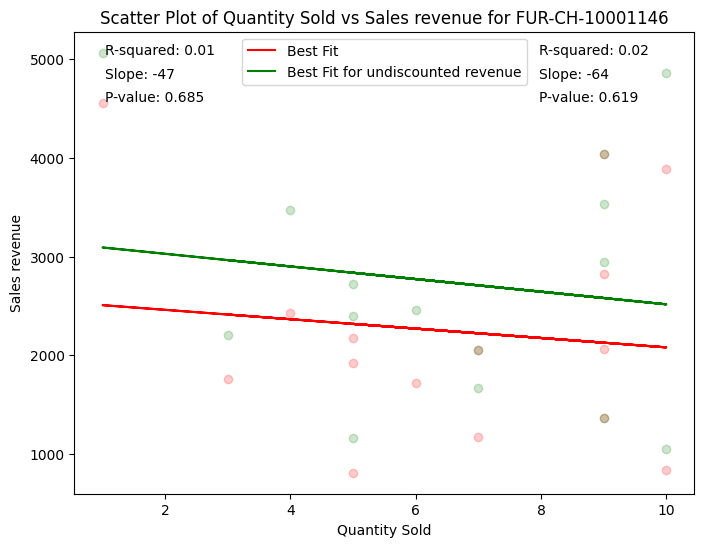

In [68]:
#now sales revenue decreases with quantity?! (not significant though)

paper = sales[sales['Product ID']=='FUR-CH-10001146']
paper['Undiscounted_sales_revenue'] = paper['Quantity_sold'] * paper['Product_price']

plt.figure(figsize=(10, 6))

# Fit a linear regression model
model = sm.ols('Sales_revenue ~ Quantity_sold', data=paper).fit()

# Create the scatter plot
plt.figure(figsize=(8, 6))

plt.scatter(paper['Quantity_sold'], paper['Sales_revenue'], alpha=0.2, color='red')
plt.scatter(paper['Quantity_sold'], paper['Undiscounted_sales_revenue'], alpha=0.2, color='green')

plt.title(f'Scatter Plot of Quantity Sold vs Sales revenue for FUR-CH-10001146')
plt.xlabel('Quantity Sold')
plt.ylabel('Sales revenue')

# Add the regression line
plt.plot(paper['Quantity_sold'], model.predict(), color='red', label='Best Fit')

# Add R-squared value to the plot
# Add regression coefficients to the plot
plt.text(0.05, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
plt.text(0.05, 0.90, f"Slope: {model.params['Quantity_sold']:.0f}", transform=plt.gca().transAxes)
plt.text(0.05, 0.85, f"P-value: {model.pvalues[1]:.3f}", transform=plt.gca().transAxes)

# Add regression line
model = sm.ols('Undiscounted_sales_revenue ~ Quantity_sold', data=paper).fit()
plt.plot(paper['Quantity_sold'], model.predict(), color='green', label='Best Fit for undiscounted revenue')

# Display R-squared and regression coefficients
plt.text(0.75, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
plt.text(0.75, 0.90, f"Slope: {model.params['Quantity_sold']:.0f}", transform=plt.gca().transAxes)
plt.text(0.75, 0.85, f"P-value: {model.pvalues[1]:.3f}", transform=plt.gca().transAxes)

plt.legend(loc='upper center')
plt.show()

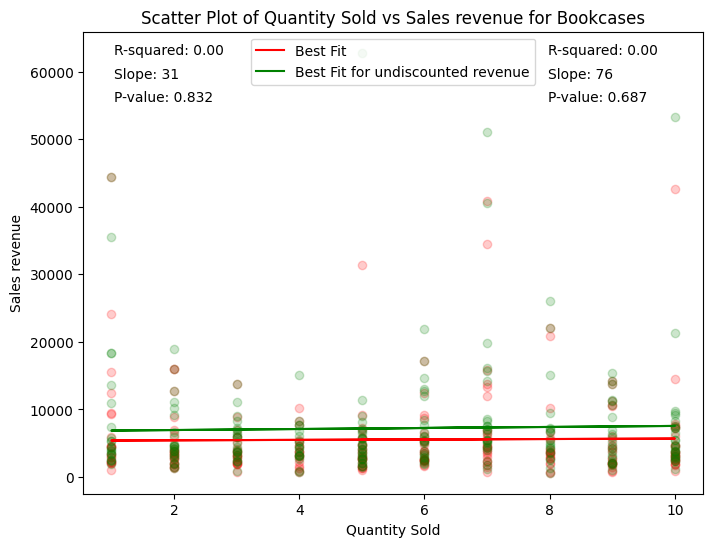

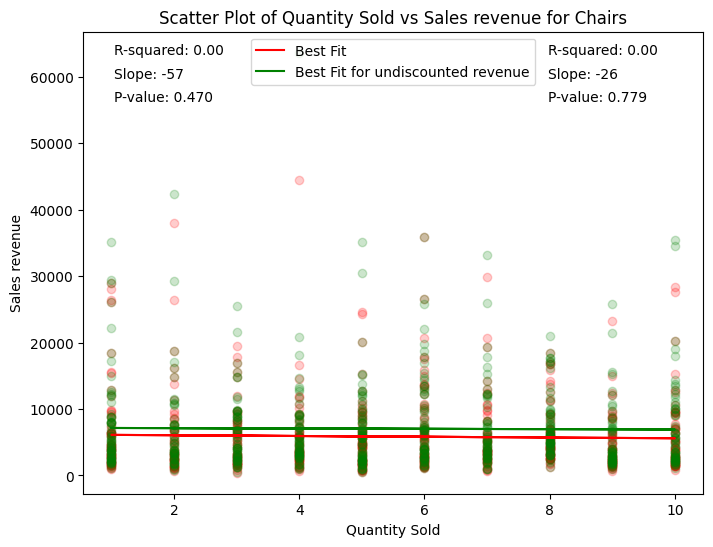

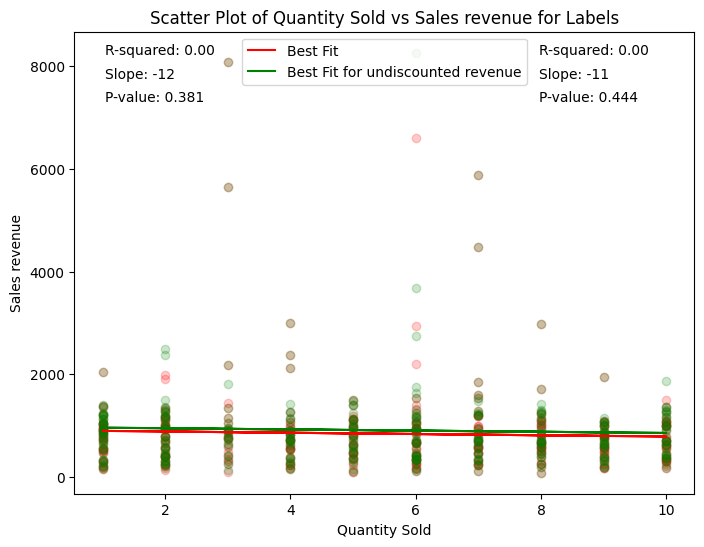

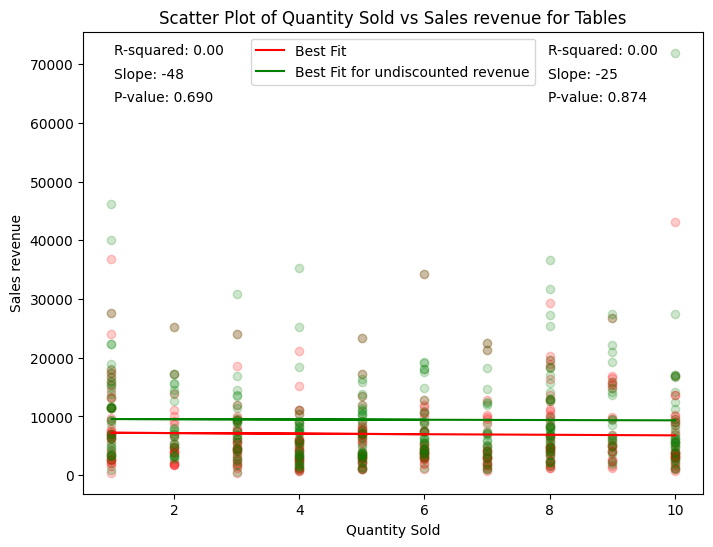

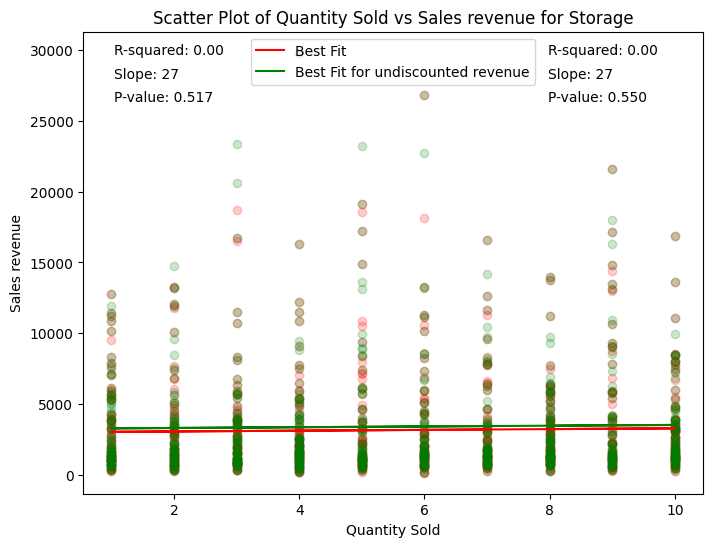

...

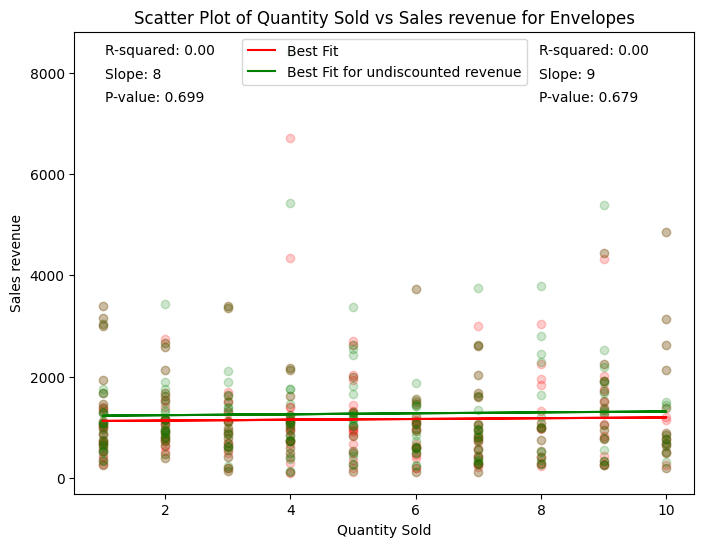

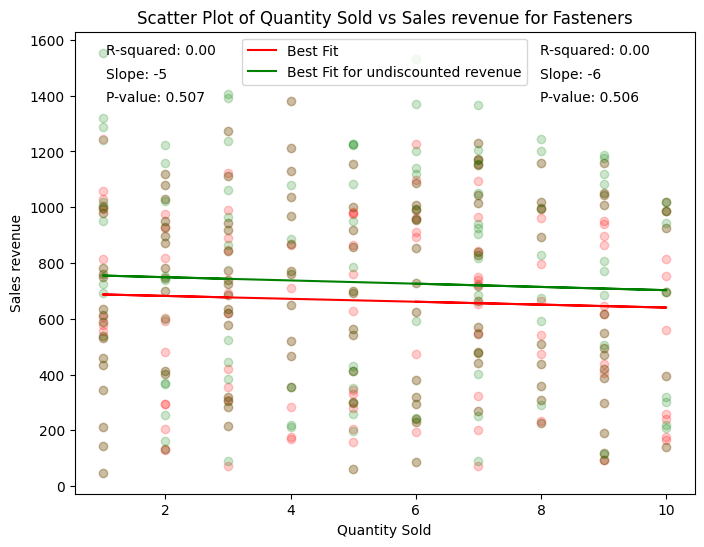

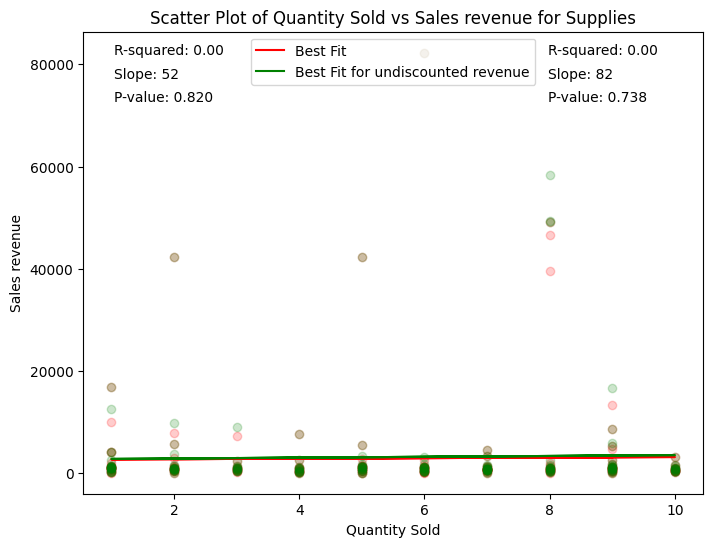

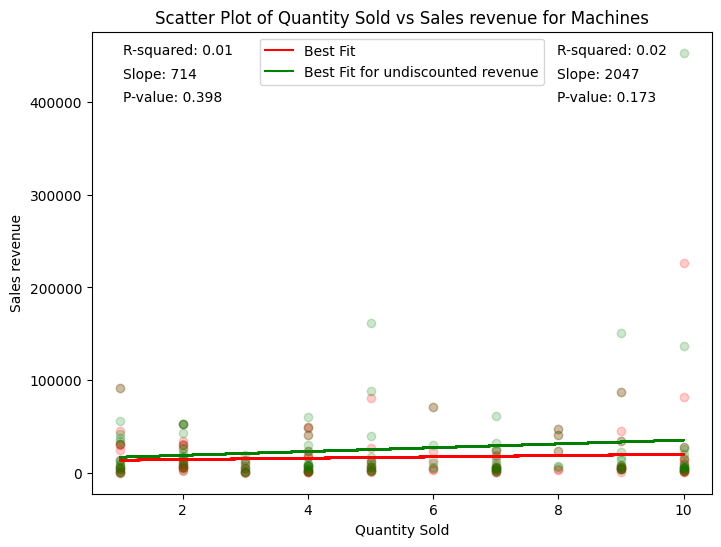

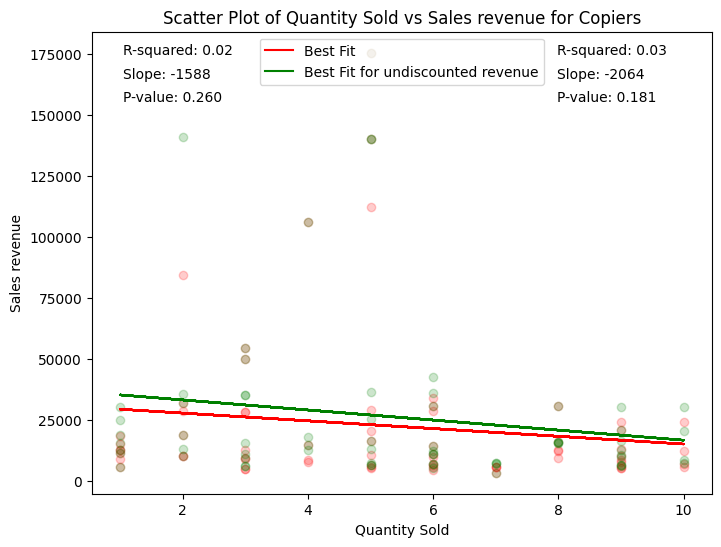

In [69]:
import matplotlib.pyplot as plt
import statsmodels.formula.api as sm
import numpy as np
import pandas as pd

# Loop through each product subcategory
for subcategory in sales['Product_subcategory'].unique():
    # Filter the dataframe for the current subcategory
    df_subcategory = sales[sales['Product_subcategory'] == subcategory]
    df_subcategory.loc[:, 'Undiscounted_sales_revenue'] = df_subcategory['Quantity_sold'] * df_subcategory['Product_price']

    # Fit a linear regression model
    model = sm.ols('Sales_revenue ~ Quantity_sold', data=df_subcategory).fit()

    # Create the scatter plot
    plt.figure(figsize=(8, 6))

    plt.scatter(df_subcategory['Quantity_sold'], df_subcategory['Sales_revenue'], alpha=0.2, color='red')
    plt.scatter(df_subcategory['Quantity_sold'], df_subcategory['Undiscounted_sales_revenue'], alpha=0.2, color='green')

    plt.title(f'Scatter Plot of Quantity Sold vs Sales revenue for {subcategory}')
    plt.xlabel('Quantity Sold')
    plt.ylabel('Sales revenue')

    # Add the regression line
    plt.plot(df_subcategory['Quantity_sold'], model.predict(), color='red', label='Best Fit')

    # Add R-squared value to the plot
    # Add regression coefficients to the plot
    plt.text(0.05, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.90, f"Slope: {model.params['Quantity_sold']:.0f}", transform=plt.gca().transAxes)
    plt.text(0.05, 0.85, f"P-value: {model.pvalues[1]:.3f}", transform=plt.gca().transAxes)

    # Add regression line
    model = sm.ols('Undiscounted_sales_revenue ~ Quantity_sold', data=df_subcategory).fit()
    plt.plot(df_subcategory['Quantity_sold'], model.predict(), color='green', label='Best Fit for undiscounted revenue')

    # Display R-squared and regression coefficients
    plt.text(0.75, 0.95, f"R-squared: {model.rsquared:.2f}", transform=plt.gca().transAxes)
    plt.text(0.75, 0.90, f"Slope: {model.params['Quantity_sold']:.0f}", transform=plt.gca().transAxes)
    plt.text(0.75, 0.85, f"P-value: {model.pvalues[1]:.3f}", transform=plt.gca().transAxes)

    plt.legend(loc='upper center')
    plt.show()

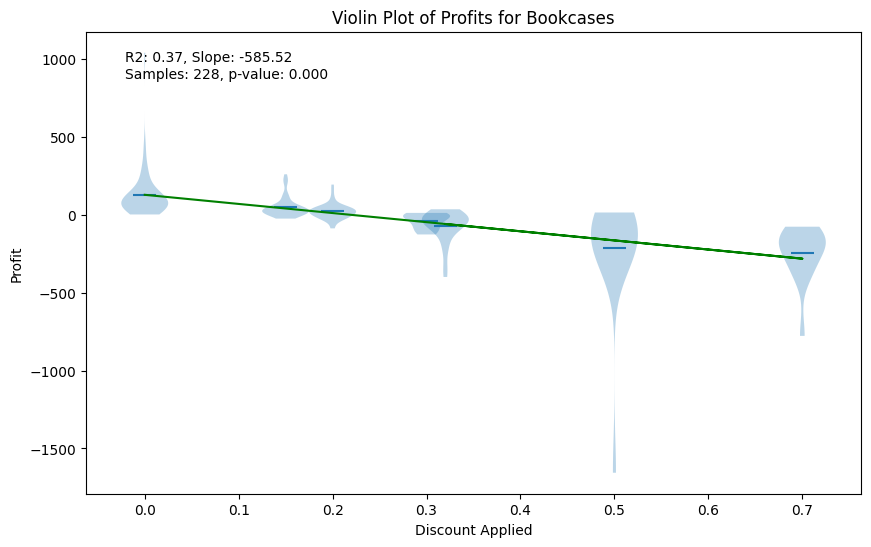

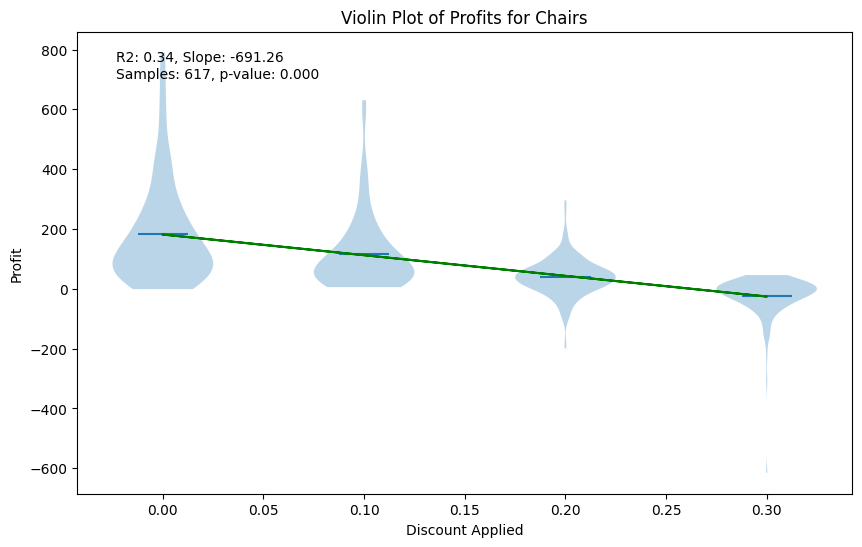

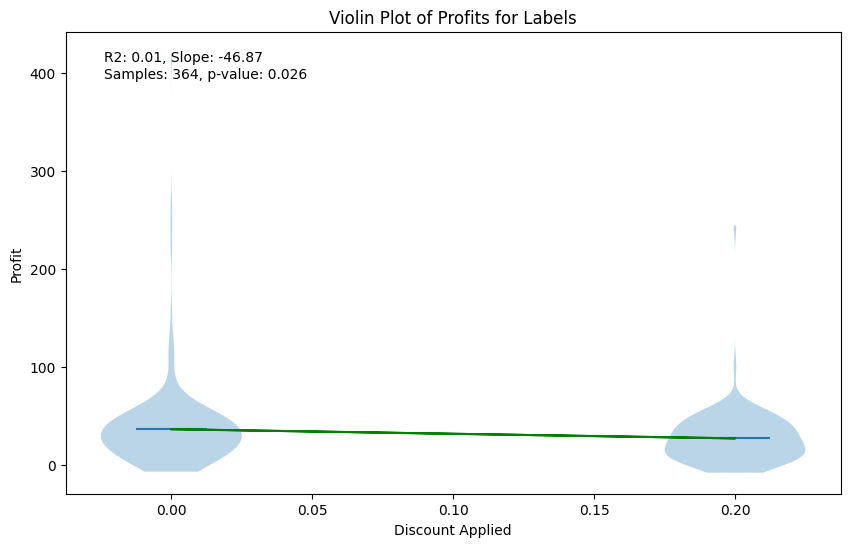

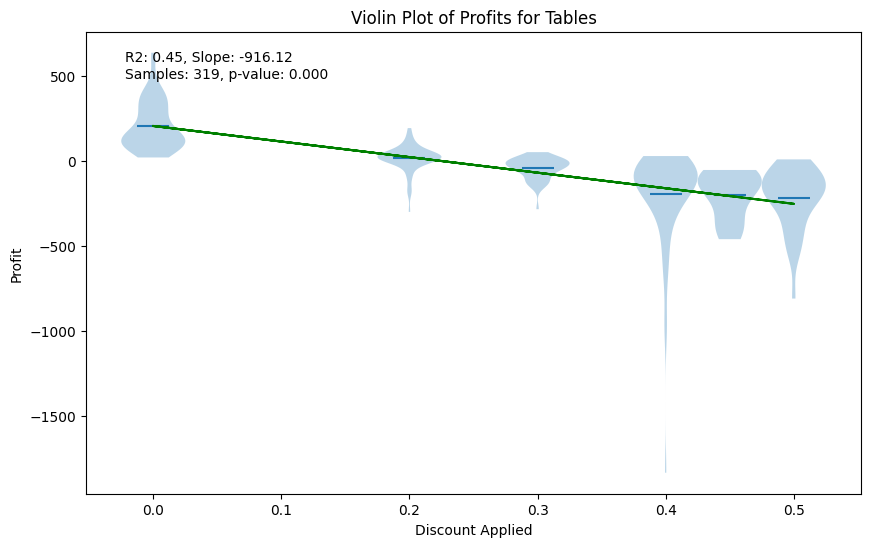

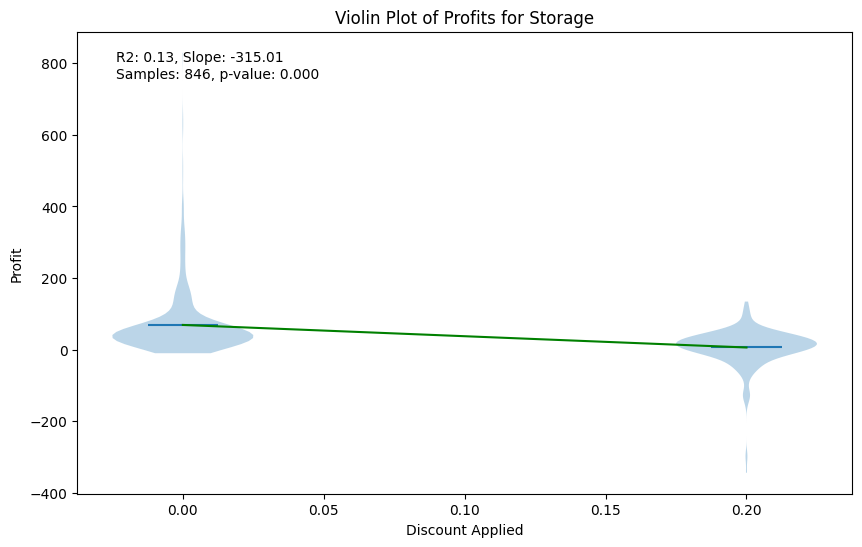

...

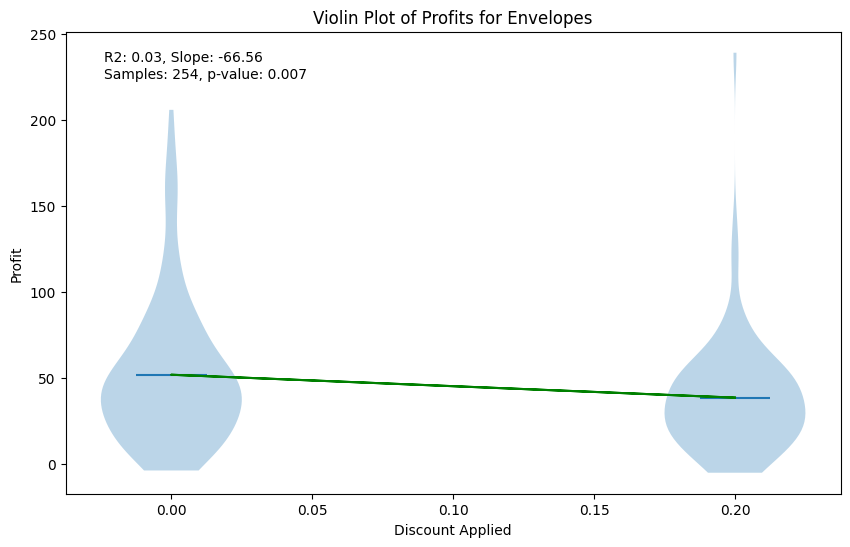

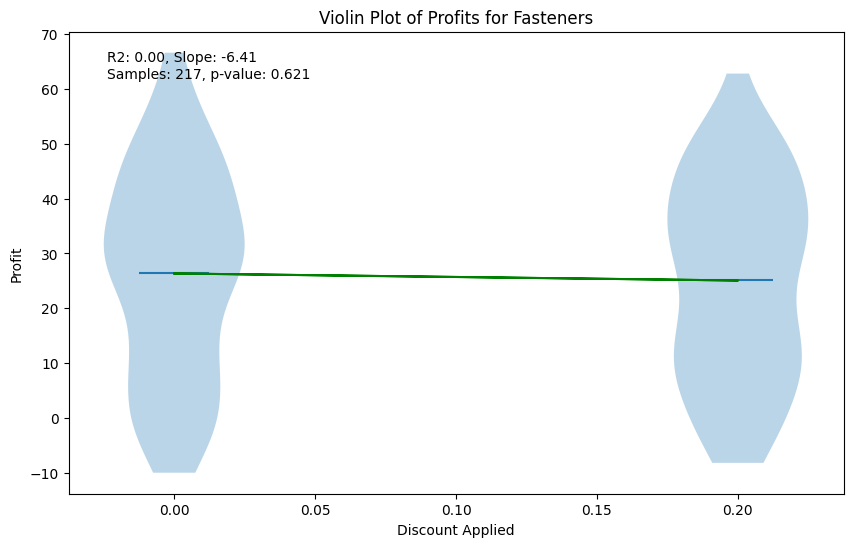

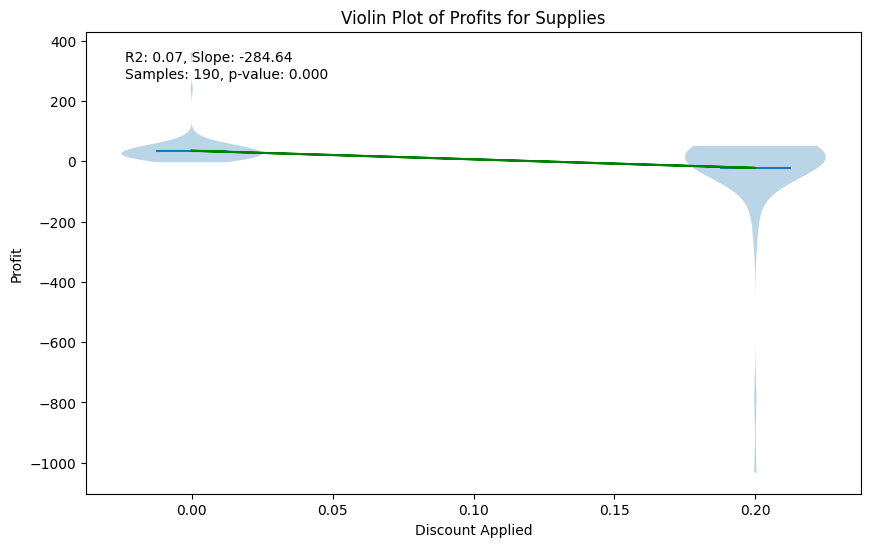

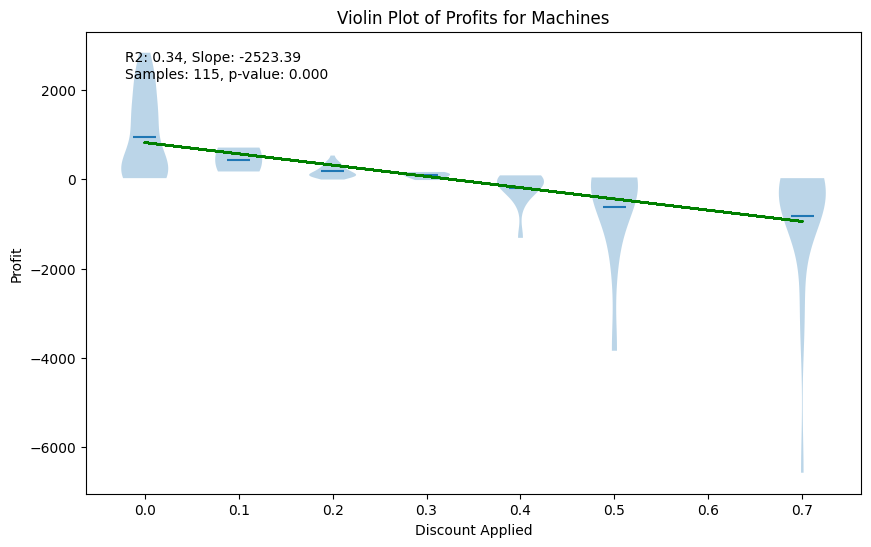

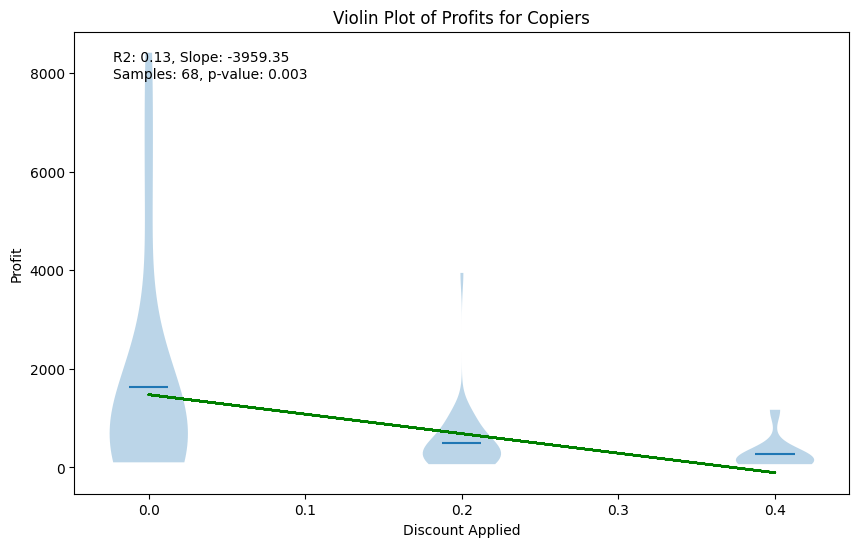

In [73]:
# For every subcategory except for Fasteners, more discount was significantly negatively associated with profit.
# prompt: Using dataframe sales: for each subcategory, make a  violin plot of quantity sold with discount given on the x axis and fit a regression line displayed over the same x-axis - do not use altair or seaborne - and display R2

# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression
import statsmodels.formula.api as sm


# Group data by subcategory
for subcategory in sales['Product_subcategory'].unique():
    # Create a subplot for each subcategory
    plt.figure(figsize=(10, 6))
    plt.title(f"Violin Plot of Profits for {subcategory}")

    # Extract data for the current subcategory
    subcategory_data = sales[sales['Product_subcategory'] == subcategory]

    # Get unique discount values and corresponding quantity sold data
    unique_discounts = subcategory_data['Discount_applied'].unique()
    quantity_sold_data = [subcategory_data['Profit_on_sale'][subcategory_data['Discount_applied'] == discount] for discount in unique_discounts]

    # Create a violin plot of quantity sold with discount applied on the x-axis
    plt.violinplot(
        quantity_sold_data,
        unique_discounts,  # Use unique discount values as positions
        showmeans=True,
        showextrema=False,
        showmedians=False,
        widths = 0.05
    )

    plt.xlabel("Discount Applied")
    plt.ylabel("Profit")

    # Fit a regression line to the data
    model = sm.ols('Profit_on_sale ~ Discount_applied', data=subcategory_data).fit()
    plt.plot(subcategory_data['Discount_applied'], model.predict(), color='green', label='Best Fit for undiscounted revenue')

    # Calculate and display R2
    r2 = model.rsquared
    slope = model.params['Discount_applied']
    total_samples = len(subcategory_data)
    p_value = model.pvalues[1]

    # Display all the information
    plt.text(0.05, 0.90, f"R2: {r2:.2f}, Slope: {slope:.2f}\nSamples: {total_samples}, p-value: {p_value:.3f}",
             transform=plt.gca().transAxes)
    # Display the plot
    plt.show()

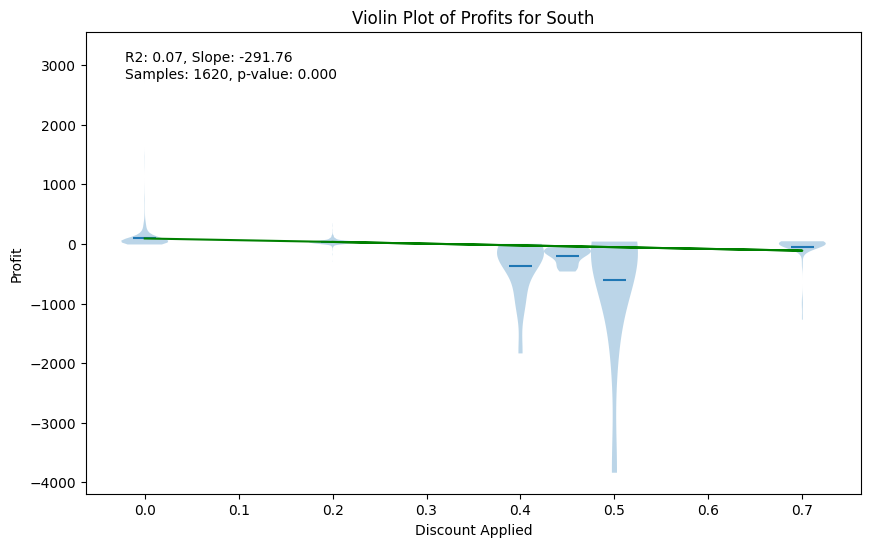

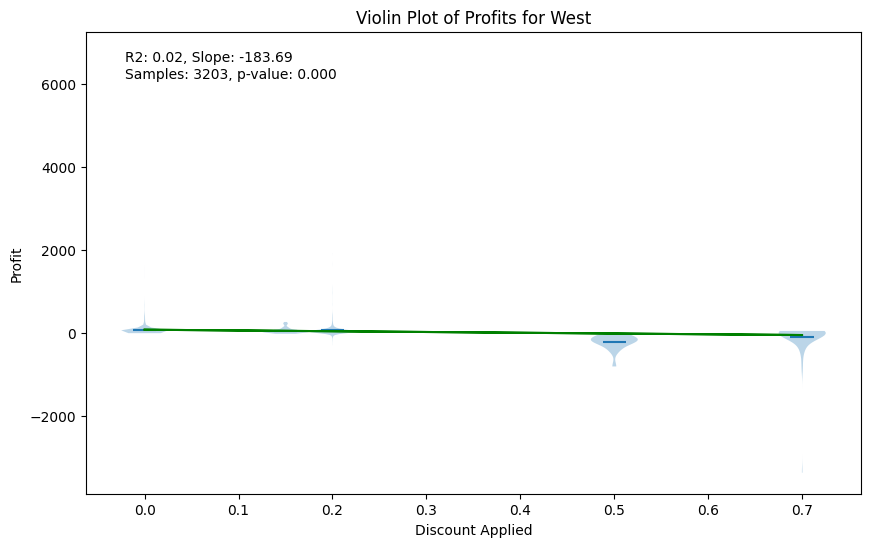

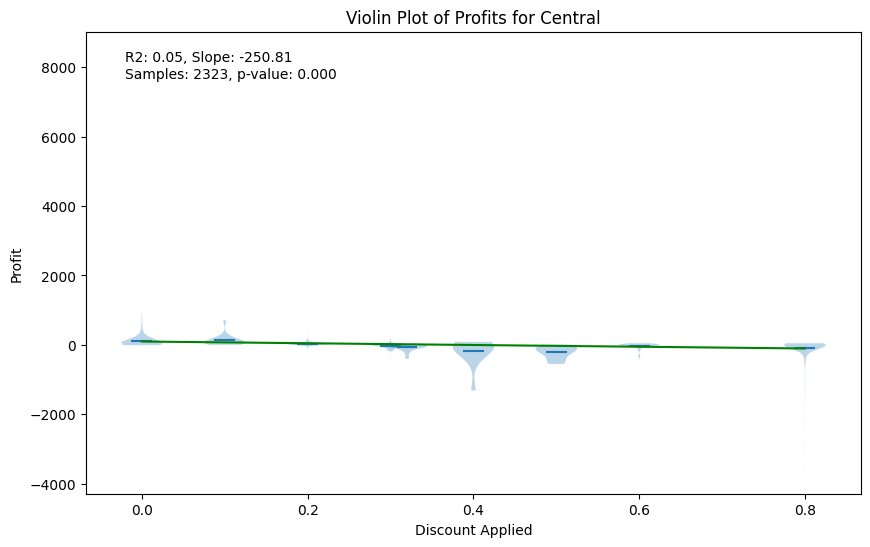

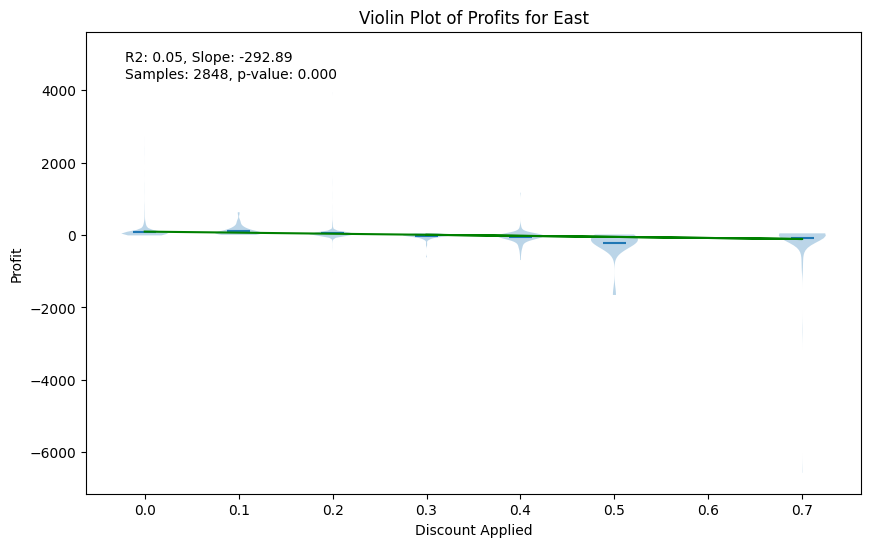

In [72]:
#For every Region, more discount was significantly negatively associated with profit.
# prompt: Using dataframe sales: for each subcategory, make a  violin plot of quantity sold with discount given on the x axis and fit a regression line displayed over the same x-axis - do not use altair or seaborne - and display R2

# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression
import statsmodels.formula.api as sm


# Group data by subcategory
for subcategory in sales['Region'].unique():
    # Create a subplot for each subcategory
    plt.figure(figsize=(10, 6))
    plt.title(f"Violin Plot of Profits for {subcategory}")

    # Extract data for the current subcategory
    subcategory_data = sales[sales['Region'] == subcategory]

    # Get unique discount values and corresponding quantity sold data
    unique_discounts = subcategory_data['Discount_applied'].unique()
    quantity_sold_data = [subcategory_data['Profit_on_sale'][subcategory_data['Discount_applied'] == discount] for discount in unique_discounts]

    # Create a violin plot of quantity sold with discount applied on the x-axis
    plt.violinplot(
        quantity_sold_data,
        unique_discounts,  # Use unique discount values as positions
        showmeans=True,
        showextrema=False,
        showmedians=False,
        widths = 0.05
    )

    plt.xlabel("Discount Applied")
    plt.ylabel("Profit")

    # Fit a regression line to the data
    model = sm.ols('Profit_on_sale ~ Discount_applied', data=subcategory_data).fit()
    plt.plot(subcategory_data['Discount_applied'], model.predict(), color='green', label='Best Fit for undiscounted revenue')

    # Calculate and display R2
    r2 = model.rsquared
    slope = model.params['Discount_applied']
    total_samples = len(subcategory_data)
    p_value = model.pvalues[1]

    # Display all the information
    plt.text(0.05, 0.90, f"R2: {r2:.2f}, Slope: {slope:.2f}\nSamples: {total_samples}, p-value: {p_value:.3f}",
             transform=plt.gca().transAxes)
    # Display the plot
    plt.show()

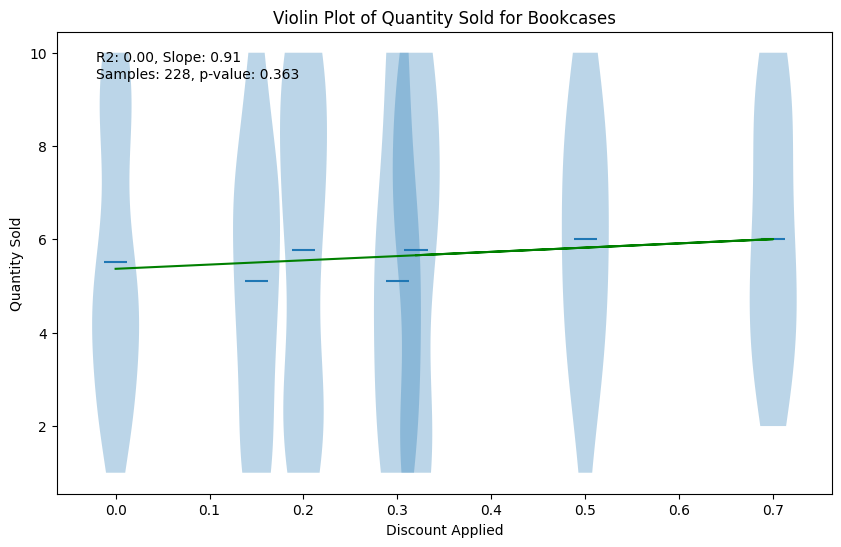

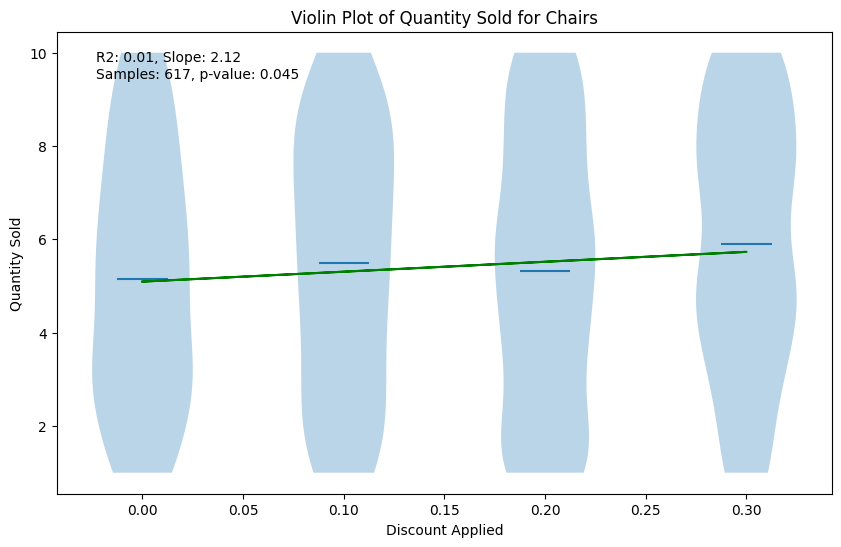

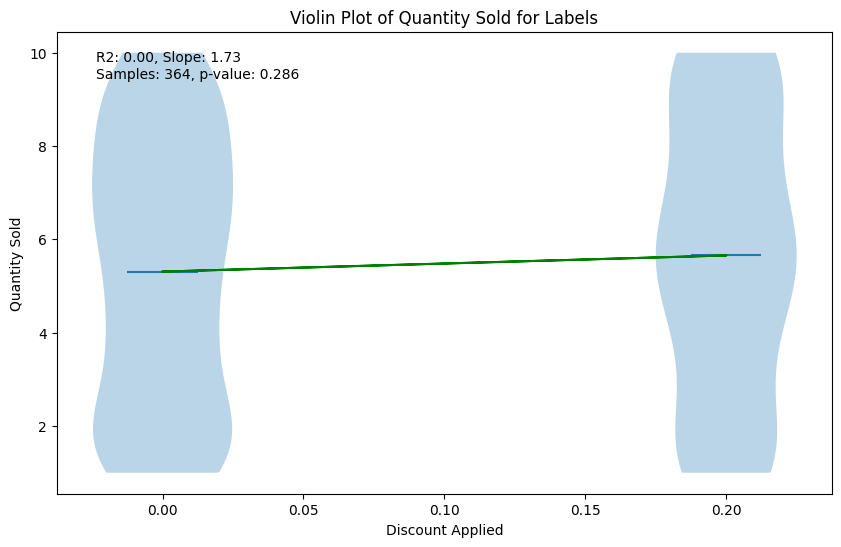

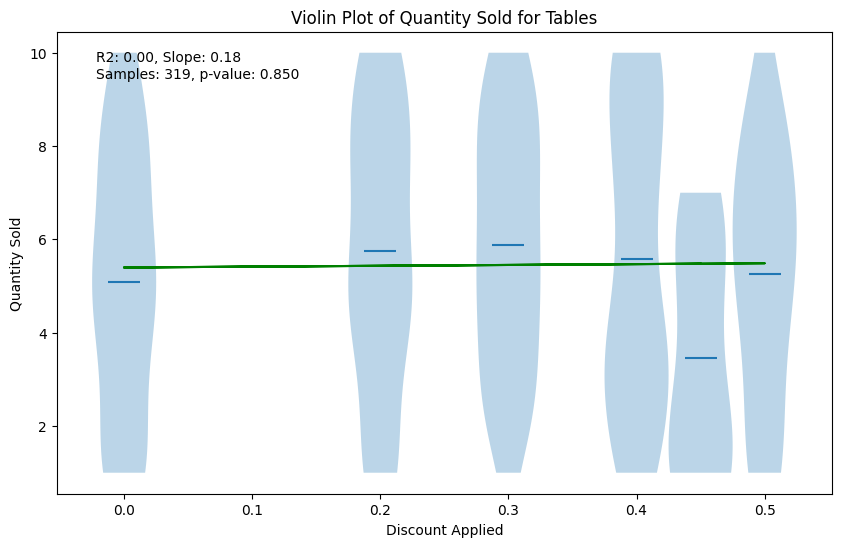

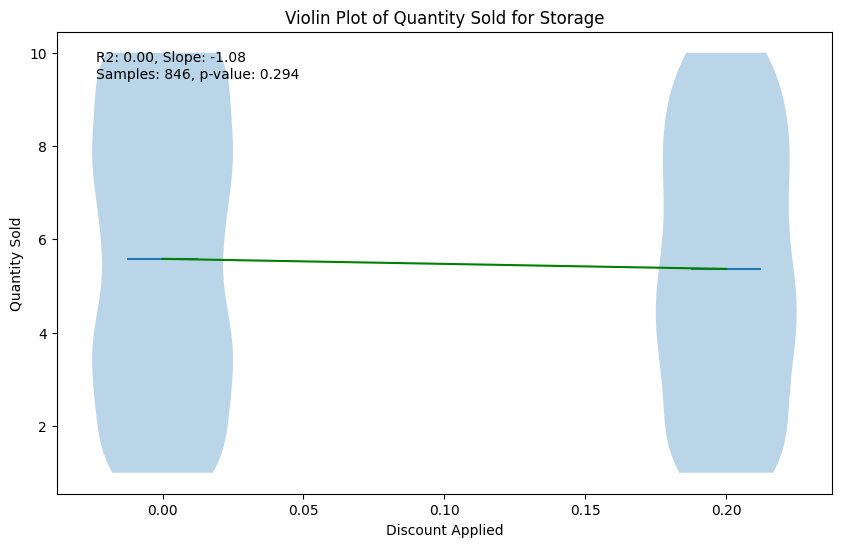

...

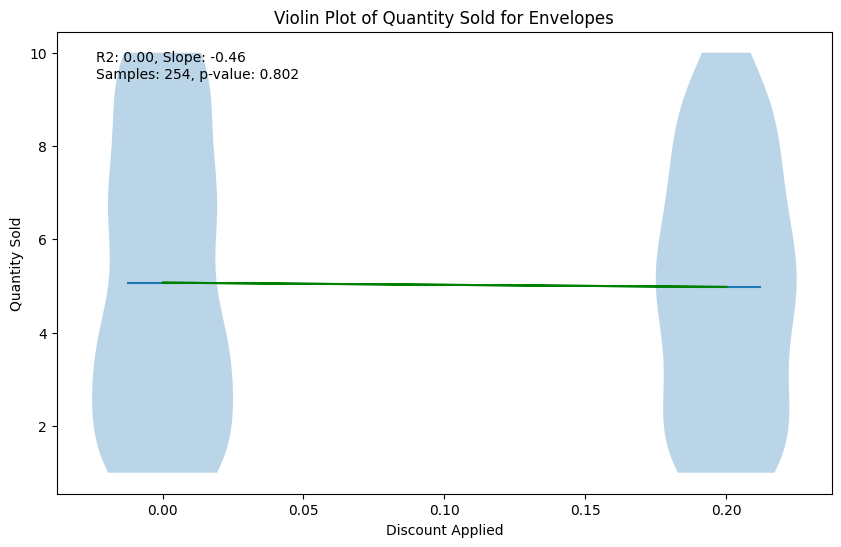

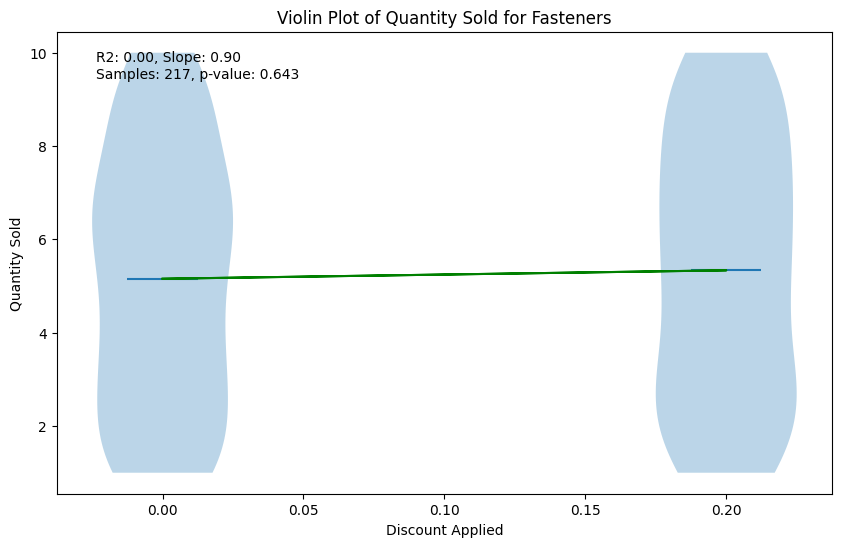

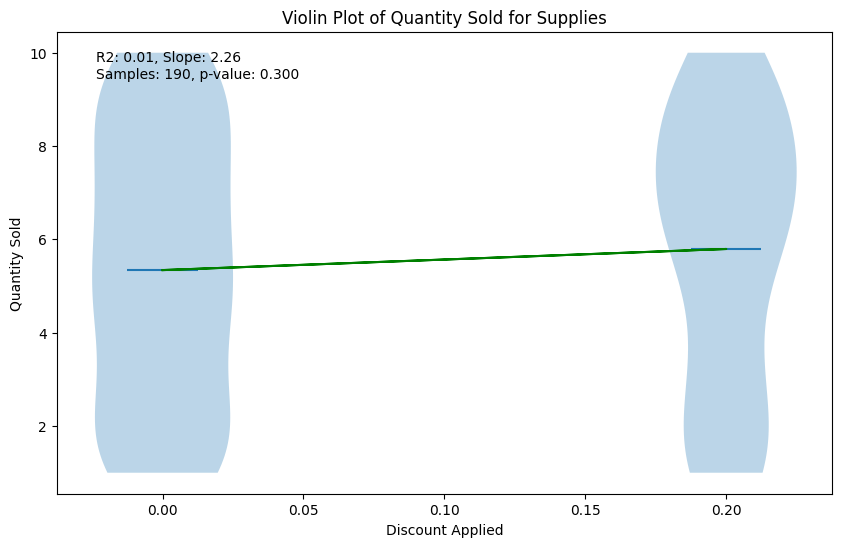

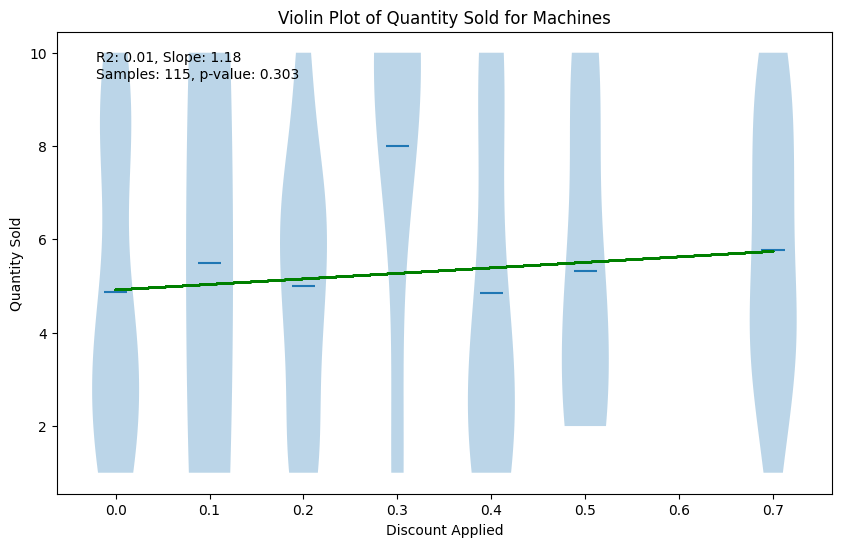

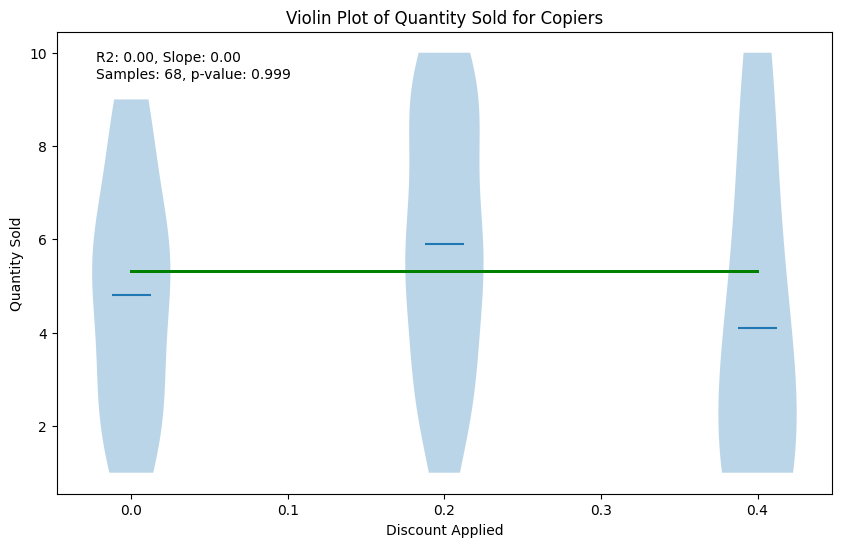

In [71]:
#Shows how quantity sold is related to discount offered in the various product subcategories. In general, quite surprisingly, we’ve seen no significant relationship between the two, except for the Chairs subcategory

# prompt: Using dataframe sales: for each subcategory, make a  violin plot of quantity sold with discount given on the x axis and fit a regression line displayed over the same x-axis - do not use altair or seaborne - and display R2

# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression


# Group data by subcategory
for subcategory in sales['Product_subcategory'].unique():
    # Create a subplot for each subcategory
    plt.figure(figsize=(10, 6))
    plt.title(f"Violin Plot of Quantity Sold for {subcategory}")

    # Extract data for the current subcategory
    subcategory_data = sales[sales['Product_subcategory'] == subcategory]

    # Get unique discount values and corresponding quantity sold data
    unique_discounts = subcategory_data['Discount_applied'].unique()
    quantity_sold_data = [subcategory_data['Quantity_sold'][subcategory_data['Discount_applied'] == discount] for discount in unique_discounts]

    # Create a violin plot of quantity sold with discount applied on the x-axis
    plt.violinplot(
        quantity_sold_data,
        unique_discounts,  # Use unique discount values as positions
        showmeans=True,
        showextrema=False,
        showmedians=False,
        widths = 0.05
    )

    plt.xlabel("Discount Applied")
    plt.ylabel("Quantity Sold")

    # Fit a regression line to the data
    model = sm.ols('Quantity_sold ~ Discount_applied', data=subcategory_data).fit()
    plt.plot(subcategory_data['Discount_applied'], model.predict(), color='green', label='Best Fit for undiscounted revenue')

    # Calculate and display R2
    r2 = model.rsquared
    slope = model.params['Discount_applied']
    total_samples = len(subcategory_data)
    p_value = model.pvalues[1]

    # Display all the information
    plt.text(0.05, 0.90, f"R2: {r2:.2f}, Slope: {slope:.2f}\nSamples: {total_samples}, p-value: {p_value:.3f}",
             transform=plt.gca().transAxes)
    # Display the plot
    plt.show()

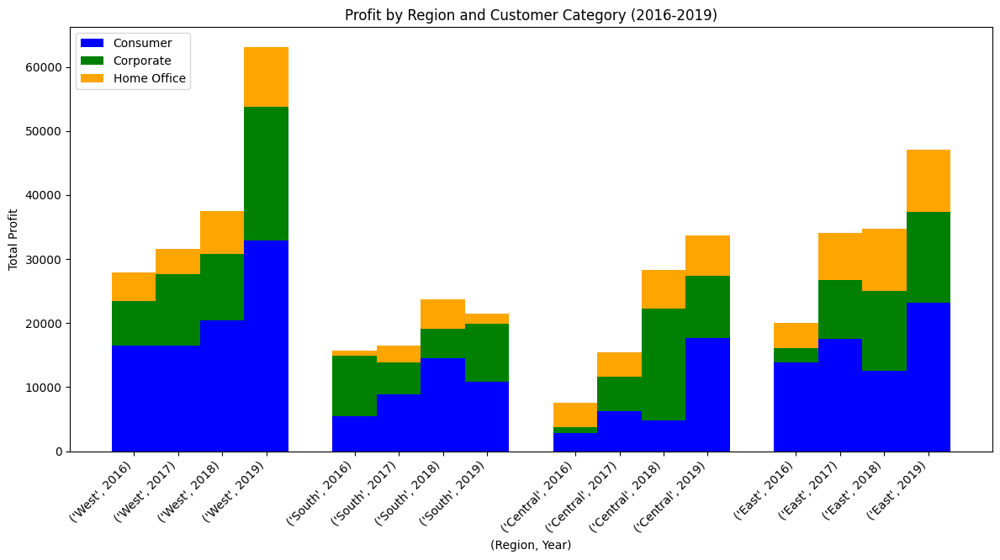

In [74]:
# prompt: Using dataframe sales: on one single figure without subplots for each year from 2016 to 2019 make 4 vertical bars close to each other showing the profit by the 4 regions: West, South, Central, East
# in total you should have 16 vertical stacked bars - one for each (region, year)
# make the bar charts stacked by product category - use matplotlib and one color for each product category

import matplotlib.pyplot as plt
import pandas as pd

# Assuming your dataframe is named 'sales'

# Filter data for the years 2016 to 2019
sales_filtered = sales[(sales['Order Date'].dt.year >= 2016) & (sales['Order Date'].dt.year <= 2019)]

# Group by year, region, and product category to calculate total profit
profit_by_year_region_category = sales_filtered.groupby([sales_filtered['Order Date'].dt.year, 'Region', 'Customer_type'])['Profit_on_sale'].sum().unstack()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Define width of bars
width = 1

# Define colors for each product category
colors = ['blue', 'green', 'orange']

# Loop through years and regions to create the stacked bar charts
xticklab = []
for k, region in enumerate(['West', 'South', 'Central', 'East']):
    for i, year in enumerate([2016,2017,2018,2019]):
        profit_data = profit_by_year_region_category.loc[(year, region)]
        bottom = 0  # Track the bottom of the current stack
        xticklab.append((region, year))
        for j, category in enumerate(profit_data.index):
            profit = profit_data[category]
            ax.bar(i + k * width * 5, profit, width, bottom=bottom, color=colors[j], label=category if year == 2016 and region == 'West' else None)
            bottom += profit

# Set the x-axis labels and tick positions
ax.set_xticks([0,1,2,3,5,6,7,8,10,11,12,13,15,16,17,18])
ax.set_xticklabels(xticklab)

# Set the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, loc='upper left')

# Set the title and axis labels
ax.set_title('Profit by Region and Customer Category (2016-2019)')
ax.set_xlabel('(Region, Year)')
ax.set_ylabel('Total Profit')

# Display the plot
plt.tight_layout()
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

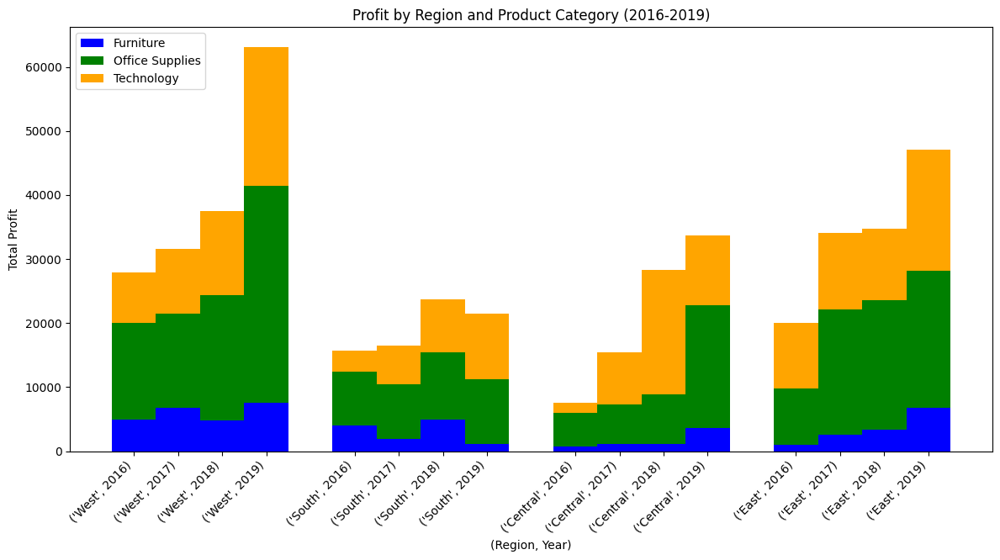

In [75]:
# prompt: Using dataframe sales: on one single figure without subplots for each year from 2016 to 2019 make 4 vertical bars close to each other showing the profit by the 4 regions: West, South, Central, East
# in total you should have 16 vertical stacked bars - one for each (region, year)
# make the bar charts stacked by product category - use matplotlib and one color for each product category

import matplotlib.pyplot as plt
import pandas as pd

# Assuming your dataframe is named 'sales'

# Filter data for the years 2016 to 2019
sales_filtered = sales[(sales['Order Date'].dt.year >= 2016) & (sales['Order Date'].dt.year <= 2019)]

# Group by year, region, and product category to calculate total profit
profit_by_year_region_category = sales_filtered.groupby([sales_filtered['Order Date'].dt.year, 'Region', 'Product_category'])['Profit_on_sale'].sum().unstack()

# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 6))

# Define width of bars
width = 1

# Define colors for each product category
colors = ['blue', 'green', 'orange']

# Loop through years and regions to create the stacked bar charts
xticklab = []
for k, region in enumerate(['West', 'South', 'Central', 'East']):
    for i, year in enumerate([2016,2017,2018,2019]):
        profit_data = profit_by_year_region_category.loc[(year, region)]
        bottom = 0  # Track the bottom of the current stack
        xticklab.append((region, year))
        for j, category in enumerate(profit_data.index):
            profit = profit_data[category]
            ax.bar(i + k * width * 5, profit, width, bottom=bottom, color=colors[j], label=category if year == 2016 and region == 'West' else None)
            bottom += profit

# Set the x-axis labels and tick positions
ax.set_xticks([0,1,2,3,5,6,7,8,10,11,12,13,15,16,17,18])
ax.set_xticklabels(xticklab)

# Set the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels, loc='upper left')

# Set the title and axis labels
ax.set_title('Profit by Region and Product Category (2016-2019)')
ax.set_xlabel('(Region, Year)')
ax.set_ylabel('Total Profit')

# Display the plot
plt.tight_layout()
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

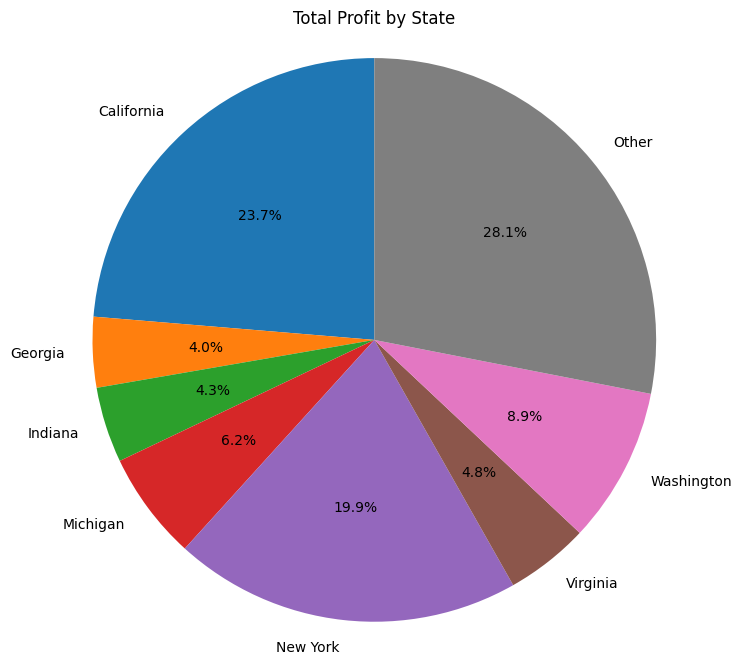

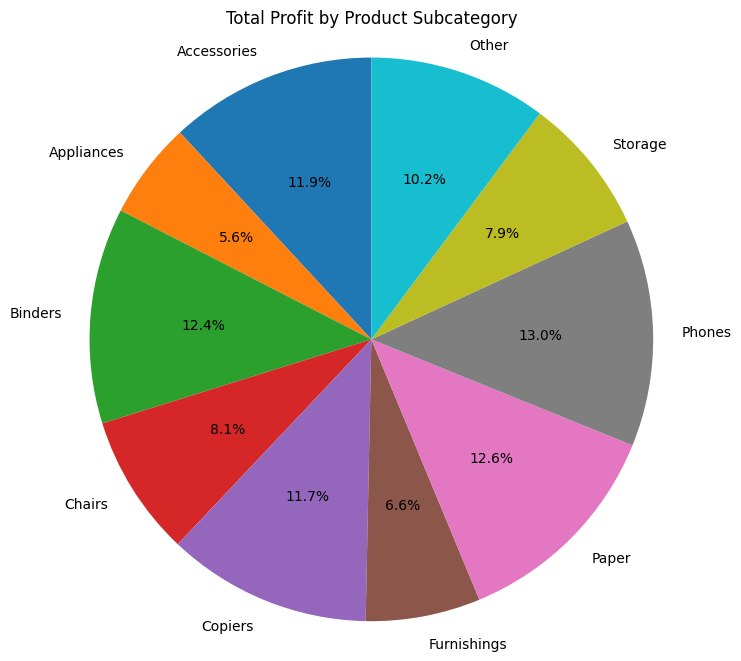

In [76]:
# prompt: Using dataframe sales: calculate total profit for both state and product subcategory and make pie chart out of them showing labels and percentages: for visibility, for states and subcategories with less than 5% contribution, add them together and show them as other on the pie chart, use matplotlib

import matplotlib.pyplot as plt

# Calculate total profit by state
profit_by_state = sales.groupby('State')['Profit_on_sale'].sum()

# Calculate total profit by product subcategory
profit_by_subcategory = sales.groupby('Product_subcategory')['Profit_on_sale'].sum()


# Function to create pie chart with "Other" category for smaller contributions
def create_pie_chart(data, title, threshold):
    total_profit = data.sum()
    labels = []
    sizes = []
    other_size = 0

    for label, size in data.items():
        percentage = size / total_profit
        if percentage >= threshold:
            labels.append(label)
            sizes.append(size)
        else:
            other_size += size

    if other_size > 0:
        labels.append("Other")
        sizes.append(other_size)

    plt.figure(figsize=(8, 8))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
    plt.title(title)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()

# Create pie charts for state and product subcategory
create_pie_chart(profit_by_state, "Total Profit by State", 0.03)
create_pie_chart(profit_by_subcategory, "Total Profit by Product Subcategory", 0.05)

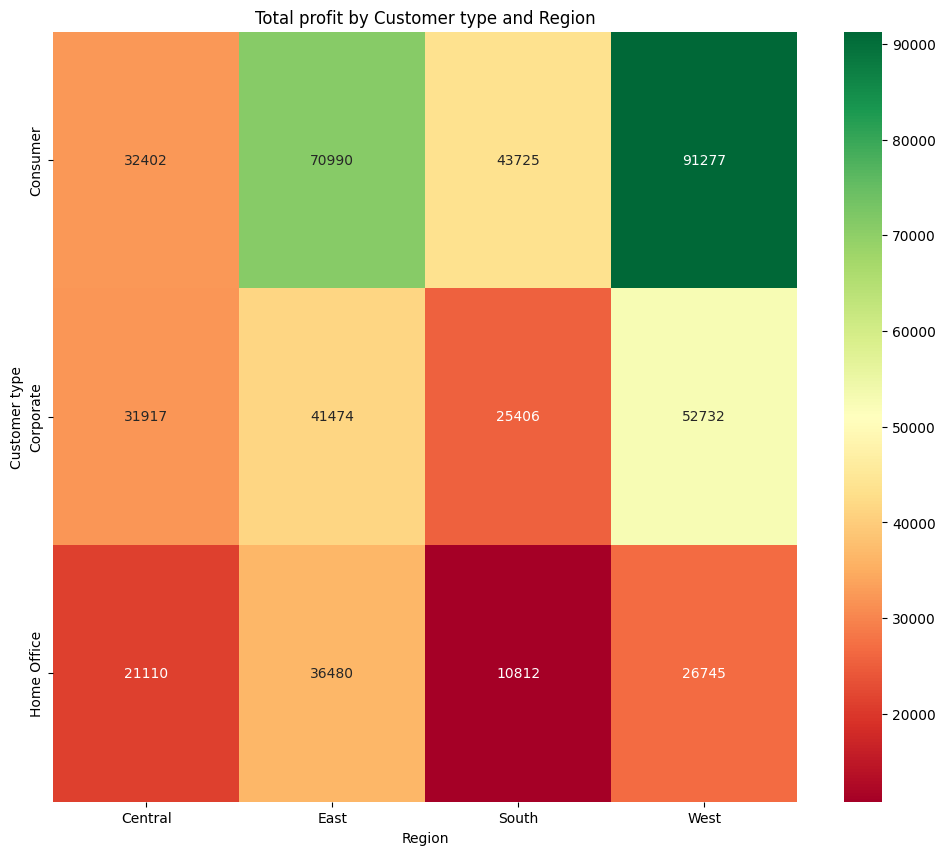

In [77]:
# from matplotlib import pyplot as plt
# import seaborn as sns
# import pandas as pd
# plt.subplots(figsize=(8, 8))
# df_2dhist = pd.DataFrame({
#     x_label: grp['Category'].value_counts()
#     for x_label, grp in sales.groupby('Region')
# })
# sns.heatmap(df_2dhist, cmap='viridis')
# plt.xlabel('Region')
# _ = plt.ylabel('Category')

# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Group by state and calculate the total profit
state_profit = sales.groupby('Customer_type')['Profit_on_sale'].sum().reset_index()

# Create a pivot table with states on the y-axis and quantity sold on the x-axis, showing profit
heatmap_data = pd.pivot_table(sales, values='Profit_on_sale', index='Customer_type', columns='Region', aggfunc='sum')

# Round the values in the heatmap data to the nearest integer
heatmap_data = heatmap_data.round(0)

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="RdYlGn", yticklabels=True)

# Customize the plot
plt.title('Total profit by Customer type and Region')
plt.xlabel('Region')
plt.ylabel('Customer type')

# Display the plot
plt.show()

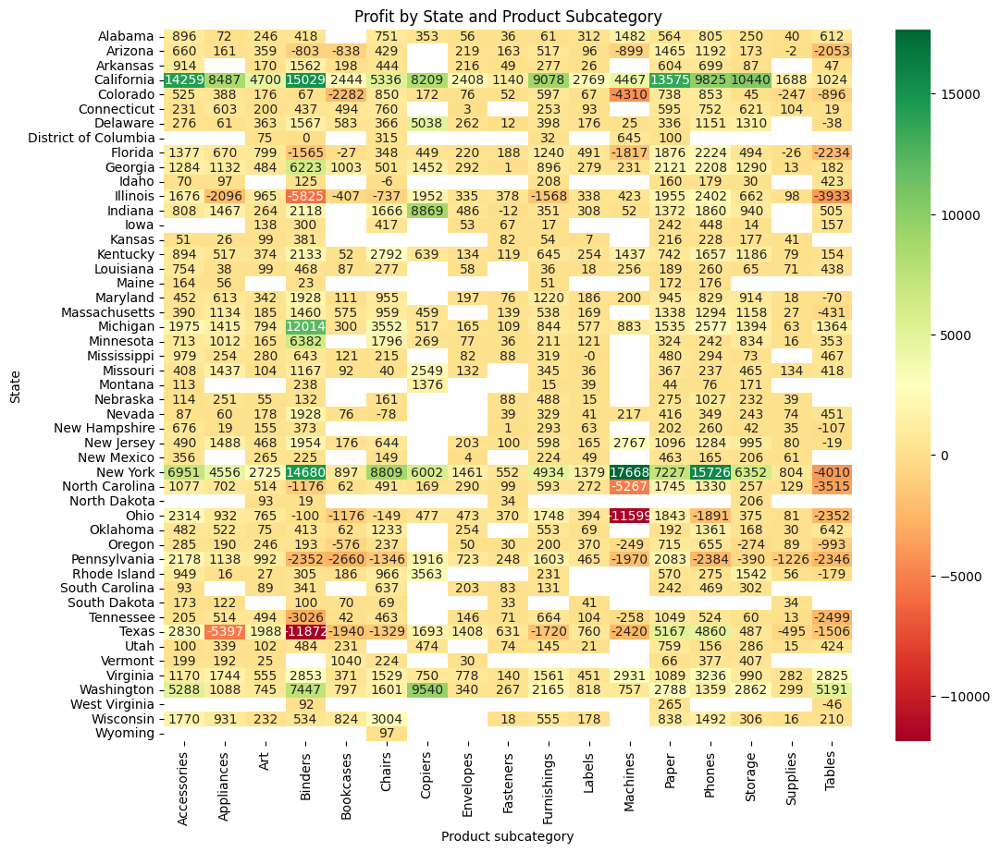

In [78]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Group by state and calculate the total profit
state_profit = sales.groupby('State')['Profit_on_sale'].sum().reset_index()

# Create a pivot table with states on the y-axis and quantity sold on the x-axis, showing profit
heatmap_data = pd.pivot_table(sales, values='Profit_on_sale', index='State', columns='Product_subcategory', aggfunc='sum')

# Round the values in the heatmap data to the nearest integer
heatmap_data = heatmap_data.round(0)

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="RdYlGn", yticklabels=True)

# Customize the plot
plt.title('Profit by State and Product Subcategory')
plt.xlabel('Product subcategory')
plt.ylabel('State')

# Display the plot
plt.show()

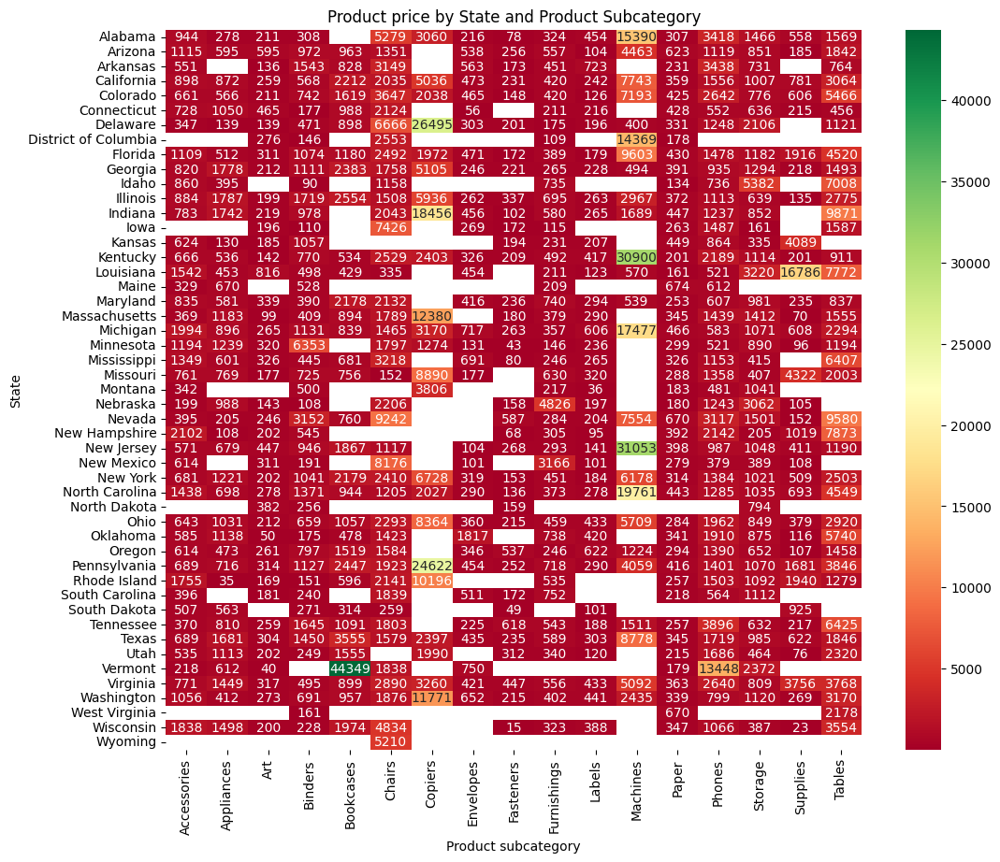

In [79]:
#Price variance
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Group by state and calculate the total profit
state_profit = sales.groupby('State')['Profit_on_sale'].sum().reset_index()

# Create a pivot table with states on the y-axis and quantity sold on the x-axis, showing profit
heatmap_data = pd.pivot_table(sales, values='Product_price', index='State', columns='Product_subcategory', aggfunc='mean')

# Round the values in the heatmap data to the nearest integer
heatmap_data = heatmap_data.round(0)

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap="RdYlGn", yticklabels=True)

# Customize the plot
plt.title('Product price by State and Product Subcategory')
plt.xlabel('Product subcategory')
plt.ylabel('State')

# Display the plot
plt.show()